Sovconsult DOO

# 定量 截至 2023 年 11 月 30 日俄罗斯公寓住宅房地产市场的地区间定量分析  基于 Sberindex 数据（俄罗斯联邦储蓄银行股份公司服务 服务）

方案 1：圣彼得堡和列宁格勒州、莫斯科和莫斯科州被视为四个独立的州

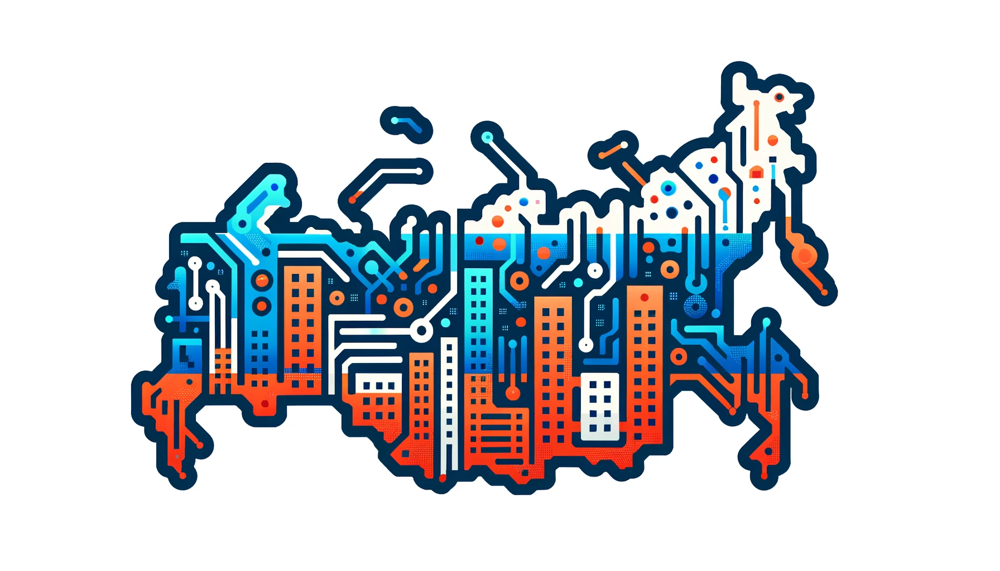

本研究的分析完全基于[Sberindex](https://sberindex.ru/en)提供并[公开](https://sberindex.ru/en/dashboards?partition=7)的数据。 本研究的作者以及本研究中使用的[Syväjärvi© 机器学习模型](https://www.facebook.com/groups/1977067932456703)的版权持有者（[Sovconsult DOO](https://sovconsult.tech)）和该模型的云基础设施提供商（Meleksa Research AB）与 Sberindex 或 Sberbank 无关。Sberindex 和 Sberbank PJSC 与本研究无任何关系，对其结果和结论不承担任何责任。

本研究报告根据[CC BY-SA 4.0 license](https://creativecommons.org/licenses/by-sa/4.0/) 条款发布。所有数据、模型、发现和结果均 "按原样 "提供，仅供参考。研究报告的作者、Syväjärvi© 模型的开发者或其基础设施的提供者对使用本研究报告的后果不承担任何责任，也不保证其内容的准确性和正确性。
任何个人或公司用户均需承担使用本研究报告的所有风险。

本研究以及所有使用 Syväjärvi© 模型创建的产品均基于以下原则：
1) 认同[有效市场假说](https://en.wikipedia.org/wiki/Efficient-market_hypothesis) 的有效性；
2) [KISS 原则](https://en.wikipedia.org/wiki/KISS_principle)；
3) 符合[国际财务报告准则第 13 号--公允价值计量]第 3 段的要求(https://www.ifrs.org/issued-standards/list-of-standards/ifrs-13-fair-value-measurement/#about)。

这项研究有两个版本。在一个版本中，圣彼得堡、列宁格勒州、莫斯科和莫斯科州被视为四个独立的地区。在第二个版本中，圣彼得堡和列宁格勒州合并为经济大区 "英格里亚"；莫斯科和莫斯科州合并为 "大莫斯科"。

## 00. 关于所用数据的信息

|数据|权利持有人|许可证|网址|
| :- | :- | :- | :- |
|有关多户住宅房地产市场的定量数据|俄罗斯联邦储蓄银行|未定义|[https://sberindex.ru/en/dashboards?partition=7](https://sberindex.ru/en/dashboards?partition=7)|
|GeoJSON 格式的区域坐标数据|独资业主 德米特里-叶夫根尼耶维奇-萨沃斯季亚诺夫|未定义|[https://mydata.biz/ru/catalog/databases/borders_ru](https://mydata.biz/ru/catalog/databases/borders_ru)|

## 0. 有关本研究成果材料的信息 

主要结果见本研究报告正文。其他资料可通过表格中的链接获取。

|材料|链接|
| :- | :- |
|主存储库|https://github.com/Kirill-Murashev/sberindex|
|研究报告正文（俄文）及定性分析|https://nbviewer.org/github/Kirill-Murashev/sberindex/blob/master/ru_flats_2023_nov_rus.ipynb|
|研究报告正文（英文）及定性分析结果|https://nbviewer.org/github/Kirill-Murashev/sberindex/blob/master/ru_flats_2023_nov_eng.ipynb|
|研究报告正文（中文）及定性效果图|https://nbviewer.org/github/Kirill-Murashev/sberindex/blob/master/ru_flats_2023_nov_chn.ipynb|
|UTF-8 编码的源数据|https://web.tresorit.com/l/mhRxz#phwMYN_at8U-x1ZBHUfbjQ|
|以 XLSX 格式将原始数据汇总到一个文件中|https://web.tresorit.com/l/BwLdB#WfcPGKOySdyvUgruGdGYig|
|PNG 和 HTML 热图（在 OSM 地图基础上进行交互）|https://web.tresorit.com/l/RTdE4#_8WMDnK6hjXgVfSPD5-mlg|
|图表|https://web.tresorit.com/l/1SK8A#4Rzl6PPlQ6Ri07meLsayuA|

## 1. 入门

连接锡韦伊湖 Syväjärvi。

In [1]:
import pandas as pd
import syvajarvi as syv

加载和清理 Sberindex 数据。

In [2]:
# Set the display options to show all rows and columns
pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)

# Fetch data for November 2023
primary_deals, secondary_deals, primary_offers,\
secondary_offers, primary_volumes, secondary_volumes,\
secondary_exposure = syv.read_sberindex_flats('2023-11%')

# Check data
primary_deals, secondary_deals, primary_offers, secondary_offers,\
primary_volumes, secondary_volumes, secondary_exposure = syv.check_consistency(primary_deals,\
                                                                             secondary_deals,\
                                                                             primary_offers,\
                                                                             secondary_offers,\
                                                                             primary_volumes,\
                                                                             secondary_volumes,\
                                                                             secondary_exposure)




让我们计算一下从买入价到成交价之间的折扣。

In [3]:
# Calculate discount rates
primary_discounts = syv.calculate_discount(primary_deals, primary_offers)
secondary_discounts = syv.calculate_discount(secondary_deals, secondary_offers)

让我们来计算一级市场和二级市场之间的比率。比率的计算方法是一级市场的某一价值与二级市场相应价值的比率。

In [4]:
# Calculate ratios between primary and secondary markets
deals_ratios = syv.calculate_market_ratios(primary_deals, secondary_deals, 'value')
offers_ratios = syv.calculate_market_ratios(primary_offers, secondary_offers, 'value')
volumes_ratios = syv.calculate_market_ratios(primary_volumes, secondary_volumes, 'value')
discounts_ratios = syv.calculate_market_ratios(primary_discounts, secondary_discounts, 'value')

我们添加了一个标准化值变量。标准化采用 Z 分数法：

\begin{align}
z_{i} = \frac{x_{i} - \mu }{\sigma},
\end{align}

其中，$x_{i}$ &mdash;是第 i 次观测的指标原始值，$\mu$ &mdash;是指标的平均值，$\sigma$ &mdash;是指标的标准差。

In [5]:
# Define a list of data frames
sberindex_data_frames = [primary_deals,\
                         secondary_deals,\
                         primary_offers,\
                         secondary_offers,\
                         primary_volumes,\
                         secondary_volumes,\
                         secondary_exposure,\
                         primary_discounts,\
                         secondary_discounts,\
                         deals_ratios,\
                         offers_ratios,\
                         volumes_ratios,\
                         discounts_ratios]

# Define the column to standardize
column_name = 'value'

# Apply the function to each data frame in the list
for i in range(len(sberindex_data_frames)):
    sberindex_data_frames[i] = syv.add_standardized_column(sberindex_data_frames[i], column_name, exclude_regions=['Россия'])

# Update individual data frames
primary_deals, secondary_deals, primary_offers, secondary_offers,\
primary_volumes, secondary_volumes, secondary_exposure,\
primary_discounts, secondary_discounts, deals_ratios,\
offers_ratios, volumes_ratios, discounts_ratios = sberindex_data_frames



In [6]:
# Apply the smart sorting function to each data frame in the list directly
for i in range(len(sberindex_data_frames)):
    sberindex_data_frames[i] = syv.sberindex_regions_smart_sorting(sberindex_data_frames[i])
    
primary_deals, secondary_deals, primary_offers, secondary_offers,\
primary_volumes, secondary_volumes, secondary_exposure,\
primary_discounts, secondary_discounts, deals_ratios,\
offers_ratios, volumes_ratios, discounts_ratios = sberindex_data_frames


研究将使用以下数据框架。

|数据帧名称|说明|
| :- | :- |
|primary_deals|一级市场每平方米平均交易价格数据|
|secondary_deals|二级市场每平方米平均交易价格数据|
|primary_offers|一级市场每平方米要价中位数数据|
|secondary_offers|二手市场每平方米要价中位数数据|
|primary_volumes|一级市场供应数据|
|secondary_volumes|二级市场供应数据|
|secondary_exposure|关于二级市场风险敞口平均持续时间的数据|
|primary_discounts|关于一级市场从买入价到成交价过渡过程中典型折扣的数据|
|secondary_discounts|关于二级市场从出价到成交价之间典型折扣的数据|
|deals_ratios|一级市场交易价格与二级市场交易价格之比|
|offers_ratios|一级市场买入价与二级市场成交价之比|
|volumes_ratios|一级市场供应与二级市场供应之比|
|discounts_ratios|一级市场从报价到成交价过渡时的典型折扣值与二级市场类似指标的比率|


## 2. 主要市场数据

### 2.1. 表格

一级市场平均交易价格数据。

In [7]:
primary_deals[['region', 'value', 'standardized_value']]

,region,value,standardized_value
0,"Санкт-Петербург, St. Petersburg, 圣彼得堡",217688,2.859576
1,"Ленинградская область, Leningrad Oblast, 列宁格勒州",158917,1.260154
2,"Москва, Moscow, 莫斯科",291733,4.874672
3,"Московская область, Moscow Oblast, 莫斯科州",173928,1.668670
4,"Краснодарский край, Krasnodar Krai, 克拉斯诺达尔边疆区",169714,1.553988
5,"Алтайский край, Altai Krai, 阿尔泰边疆区",106353,-0.170348
6,"Амурская область, Amur Oblast, 阿穆尔州",142432,0.811523
7,"Архангельская область, Arkhangelsk Oblast, 阿尔汉...",123668,0.300871
8,"Астраханская область, Astrakhan Oblast, 阿斯特拉罕州",126756,0.384909
9,"Белгородская область, Belgorod Oblast, 别尔哥罗德州",104349,-0.224886


一级市场投标价格中位数数据。

In [8]:
primary_offers[['region', 'value', 'standardized_value' ]]

,region,value,standardized_value
0,"Санкт-Петербург, St. Petersburg, 圣彼得堡",256306.0,2.872051
1,"Ленинградская область, Leningrad Oblast, 列宁格勒州",154442.0,0.645452
2,"Москва, Moscow, 莫斯科",376189.0,5.492519
3,"Московская область, Moscow Oblast, 莫斯科州",193898.0,1.507903
4,"Краснодарский край, Krasnodar Krai, 克拉斯诺达尔边疆区",163033.0,0.833239
5,"Алтайский край, Altai Krai, 阿尔泰边疆区",125869.0,0.020888
6,"Амурская область, Amur Oblast, 阿穆尔州",170000.0,0.985527
7,"Архангельская область, Arkhangelsk Oblast, 阿尔汉...",140295.0,0.336219
8,"Астраханская область, Astrakhan Oblast, 阿斯特拉罕州",123956.0,-0.020928
9,"Белгородская область, Belgorod Oblast, 别尔哥罗德州",116579.0,-0.182178


二级市场平均交易价格数据。

In [9]:
secondary_deals[['region', 'value', 'standardized_value']]

,region,value,standardized_value
0,"Санкт-Петербург, St. Petersburg, 圣彼得堡",175180,2.637603
1,"Ленинградская область, Leningrad Oblast, 列宁格勒州",117905,0.839731
2,"Москва, Moscow, 莫斯科",275327,5.781234
3,"Московская область, Moscow Oblast, 莫斯科州",140575,1.551346
4,"Краснодарский край, Krasnodar Krai, 克拉斯诺达尔边疆区",139639,1.521965
5,"Алтайский край, Altai Krai, 阿尔泰边疆区",81976,-0.288086
6,"Амурская область, Amur Oblast, 阿穆尔州",120058,0.907314
7,"Архангельская область, Arkhangelsk Oblast, 阿尔汉...",83607,-0.236889
8,"Астраханская область, Astrakhan Oblast, 阿斯特拉罕州",72027,-0.600387
9,"Белгородская область, Belgorod Oblast, 别尔哥罗德州",76616,-0.456337


二级市场投标价格中位数数据。

In [10]:
secondary_offers[['region', 'value', 'standardized_value']]

,region,value,standardized_value
0,"Санкт-Петербург, St. Petersburg, 圣彼得堡",214122.0,3.242373
1,"Ленинградская область, Leningrad Oblast, 列宁格勒州",149239.0,1.335770
2,"Москва, Moscow, 莫斯科",300000.0,5.765919
3,"Московская область, Moscow Oblast, 莫斯科州",163793.0,1.763443
4,"Краснодарский край, Krasnodar Krai, 克拉斯诺达尔边疆区",140000.0,1.064280
5,"Алтайский край, Altai Krai, 阿尔泰边疆区",97682.1,-0.179242
6,"Амурская область, Amur Oblast, 阿穆尔州",145008.0,1.211441
7,"Архангельская область, Arkhangelsk Oblast, 阿尔汉...",96645.4,-0.209705
8,"Астраханская область, Astrakhan Oblast, 阿斯特拉罕州",74028.9,-0.874297
9,"Белгородская область, Belgorod Oblast, 别尔哥罗德州",84568.8,-0.564579


一级市场报价数量数据。

In [11]:
primary_volumes[['region', 'value', 'standardized_value']]

,region,value,standardized_value
0,"Санкт-Петербург, St. Petersburg, 圣彼得堡",31194,0.361046
1,"Ленинградская область, Leningrad Oblast, 列宁格勒州",24182,0.229203
2,"Москва, Moscow, 莫斯科",58285,0.870422
3,"Московская область, Moscow Oblast, 莫斯科州",33319,0.401001
4,"Краснодарский край, Krasnodar Krai, 克拉斯诺达尔边疆区",62318,0.946253
5,"Алтайский край, Altai Krai, 阿尔泰边疆区",1813,-0.191388
6,"Амурская область, Amur Oblast, 阿穆尔州",571,-0.214741
7,"Архангельская область, Arkhangelsk Oblast, 阿尔汉...",2005,-0.187778
8,"Астраханская область, Astrakhan Oblast, 阿斯特拉罕州",2593,-0.176723
9,"Белгородская область, Belgorod Oblast, 别尔哥罗德州",480,-0.216452


二级市场报价数量数据。

In [12]:
secondary_volumes[['region', 'value', 'standardized_value']]

,region,value,standardized_value
0,"Санкт-Петербург, St. Petersburg, 圣彼得堡",37760,0.311269
1,"Ленинградская область, Leningrad Oblast, 列宁格勒州",15567,0.001798
2,"Москва, Moscow, 莫斯科",34573,0.266828
3,"Московская область, Moscow Oblast, 莫斯科州",37085,0.301857
4,"Краснодарский край, Krasnodar Krai, 克拉斯诺达尔边疆区",84806,0.967304
5,"Алтайский край, Altai Krai, 阿尔泰边疆区",4631,-0.150699
6,"Амурская область, Amur Oblast, 阿穆尔州",3931,-0.160461
7,"Архангельская область, Arkhangelsk Oblast, 阿尔汉...",3458,-0.167056
8,"Астраханская область, Astrakhan Oblast, 阿斯特拉罕州",2862,-0.175367
9,"Белгородская область, Belgorod Oblast, 别尔哥罗德州",7287,-0.113663


二级市场风险敞口平均期限数据。

In [13]:
secondary_exposure[['region', 'value', 'standardized_value']]

,region,value,standardized_value
0,"Санкт-Петербург, St. Petersburg, 圣彼得堡",92.8729,1.560324
1,"Ленинградская область, Leningrad Oblast, 列宁格勒州",85.8070,1.161025
2,"Москва, Moscow, 莫斯科",69.6140,0.245949
3,"Московская область, Moscow Oblast, 莫斯科州",78.7171,0.760371
4,"Краснодарский край, Krasnodar Krai, 克拉斯诺达尔边疆区",70.3610,0.288162
5,"Алтайский край, Altai Krai, 阿尔泰边疆区",48.6643,-0.937932
6,"Амурская область, Amur Oblast, 阿穆尔州",77.0764,0.667654
7,"Архангельская область, Arkhangelsk Oblast, 阿尔汉...",74.3178,0.511763
8,"Астраханская область, Astrakhan Oblast, 阿斯特拉罕州",64.6426,-0.034988
9,"Белгородская область, Belgorod Oblast, 别尔哥罗德州",104.5410,2.219695


一级市场从买入价到成交价过渡过程中的典型折扣数据。

In [14]:
primary_discounts[['region', 'value', 'standardized_value']]

,region,value,standardized_value
0,"Санкт-Петербург, St. Petersburg, 圣彼得堡",0.150671,0.713005
1,"Ленинградская область, Leningrad Oblast, 列宁格勒州",0.000000,-0.987218
2,"Москва, Moscow, 莫斯科",0.224504,1.546156
3,"Московская область, Moscow Oblast, 莫斯科州",0.102992,0.174978
4,"Краснодарский край, Krasnodar Krai, 克拉斯诺达尔边疆区",0.000000,-0.987218
5,"Алтайский край, Altai Krai, 阿尔泰边疆区",0.155050,0.762415
6,"Амурская область, Amur Oblast, 阿穆尔州",0.162165,0.842698
7,"Архангельская область, Arkhangelsk Oblast, 阿尔汉...",0.118515,0.350136
8,"Астраханская область, Astrakhan Oblast, 阿斯特拉罕州",0.000000,-0.987218
9,"Белгородская область, Belgorod Oblast, 别尔哥罗德州",0.104907,0.196589


二级市场从出价到成交价过渡期间的典型折扣数据。

In [15]:
secondary_discounts[['region', 'value', 'standardized_value']]

,region,value,standardized_value
0,"Санкт-Петербург, St. Petersburg, 圣彼得堡",0.181868,1.074781
1,"Ленинградская область, Leningrad Oblast, 列宁格勒州",0.209959,1.617333
2,"Москва, Moscow, 莫斯科",0.082243,-0.849432
3,"Московская область, Moscow Oblast, 莫斯科州",0.141752,0.299954
4,"Краснодарский край, Krasnodar Krai, 克拉斯诺达尔边疆区",0.002579,-2.388124
5,"Алтайский край, Altai Krai, 阿尔泰边疆区",0.160788,0.667623
6,"Амурская область, Amur Oblast, 阿穆尔州",0.172059,0.885328
7,"Архангельская область, Arkhangelsk Oblast, 阿尔汉...",0.134910,0.167796
8,"Астраханская область, Astrakhan Oblast, 阿斯特拉罕州",0.027042,-1.915620
9,"Белгородская область, Belgorod Oblast, 别尔哥罗德州",0.094039,-0.621596


一级市场交易价格与二级市场交易价格之比数据（一级市场为分子）。

In [16]:
deals_ratios[['region', 'value', 'standardized_value']]

,region,value,standardized_value
0,"Санкт-Петербург, St. Petersburg, 圣彼得堡",1.242653,-0.056415
1,"Ленинградская область, Leningrad Oblast, 列宁格勒州",1.347839,0.594139
2,"Москва, Moscow, 莫斯科",1.059587,-1.188638
3,"Московская область, Moscow Oblast, 莫斯科州",1.237261,-0.089763
4,"Краснодарский край, Krasnodar Krai, 克拉斯诺达尔边疆区",1.215377,-0.225114
5,"Алтайский край, Altai Krai, 阿尔泰边疆区",1.297368,0.281981
6,"Амурская область, Amur Oblast, 阿穆尔州",1.186360,-0.404577
7,"Архангельская область, Arkhangelsk Oblast, 阿尔汉...",1.479158,1.406319
8,"Астраханская область, Astrakhan Oblast, 阿斯特拉罕州",1.759840,3.142274
9,"Белгородская область, Belgorod Oblast, 别尔哥罗德州",1.361974,0.681558


一级市场与二级市场投标价格之比数据（一级市场为分子）。

In [17]:
offers_ratios[['region', 'value', 'standardized_value']]

,region,value,standardized_value
0,"Санкт-Петербург, St. Petersburg, 圣彼得堡",1.197009,-0.030938
1,"Ленинградская область, Leningrad Oblast, 列宁格勒州",1.034864,-0.846146
2,"Москва, Moscow, 莫斯科",1.253963,0.255406
3,"Московская область, Moscow Oblast, 莫斯科州",1.183799,-0.097354
4,"Краснодарский край, Krasnodar Krai, 克拉斯诺达尔边疆区",1.164521,-0.194274
5,"Алтайский край, Altai Krai, 阿尔泰边疆区",1.288557,0.429332
6,"Амурская область, Amur Oblast, 阿穆尔州",1.172349,-0.154920
7,"Архангельская область, Arkhangelsk Oblast, 阿尔汉...",1.451647,1.249285
8,"Астраханская область, Astrakhan Oblast, 阿斯特拉罕州",1.674427,2.369340
9,"Белгородская область, Belgorod Oblast, 别尔哥罗德州",1.378511,0.881584


一级市场交易量与二级市场交易量之比数据（一级市场为分子）。

In [18]:
volumes_ratios[['region', 'value', 'standardized_value']]

,region,value,standardized_value
0,"Санкт-Петербург, St. Petersburg, 圣彼得堡",0.826112,0.414756
1,"Ленинградская область, Leningrad Oblast, 列宁格勒州",1.553414,1.737464
2,"Москва, Moscow, 莫斯科",1.685853,1.978324
3,"Московская область, Moscow Oblast, 莫斯科州",0.898450,0.546312
4,"Краснодарский край, Krasnodar Krai, 克拉斯诺达尔边疆区",0.734830,0.248745
5,"Алтайский край, Altai Krai, 阿尔泰边疆区",0.391492,-0.375667
6,"Амурская область, Amur Oblast, 阿穆尔州",0.145256,-0.823485
7,"Архангельская область, Arkhangelsk Oblast, 阿尔汉...",0.579815,-0.033173
8,"Астраханская область, Astrakhan Oblast, 阿斯特拉罕州",0.906010,0.560061
9,"Белгородская область, Belgorod Oblast, 别尔哥罗德州",0.065871,-0.967858


月从报价到一级和二级市场成交价（一级市场为分子）的折扣比率数据。

In [19]:
discounts_ratios[['region', 'value', 'standardized_value']]

,region,value,standardized_value
0,"Санкт-Петербург, St. Petersburg, 圣彼得堡",0.828465,-0.012498
1,"Ленинградская область, Leningrad Oblast, 列宁格勒州",0.000000,-0.710307
2,"Москва, Moscow, 莫斯科",2.729755,1.588942
3,"Московская область, Moscow Oblast, 莫斯科州",0.726566,-0.098327
4,"Краснодарский край, Krasnodar Krai, 克拉斯诺达尔边疆区",0.000000,-0.710307
5,"Алтайский край, Altai Krai, 阿尔泰边疆区",0.964314,0.101927
6,"Амурская область, Amur Oblast, 阿穆尔州",0.942492,0.083546
7,"Архангельская область, Arkhangelsk Oblast, 阿尔汉...",0.878473,0.029623
8,"Астраханская область, Astrakhan Oblast, 阿斯特拉罕州",0.000000,-0.710307
9,"Белгородская область, Belgorod Oblast, 别尔哥罗德州",1.115568,0.229327


### 2.2. 图表

让我们绘制一张按一级市场每平方米交易价格排序的前 10 个地区的图表。

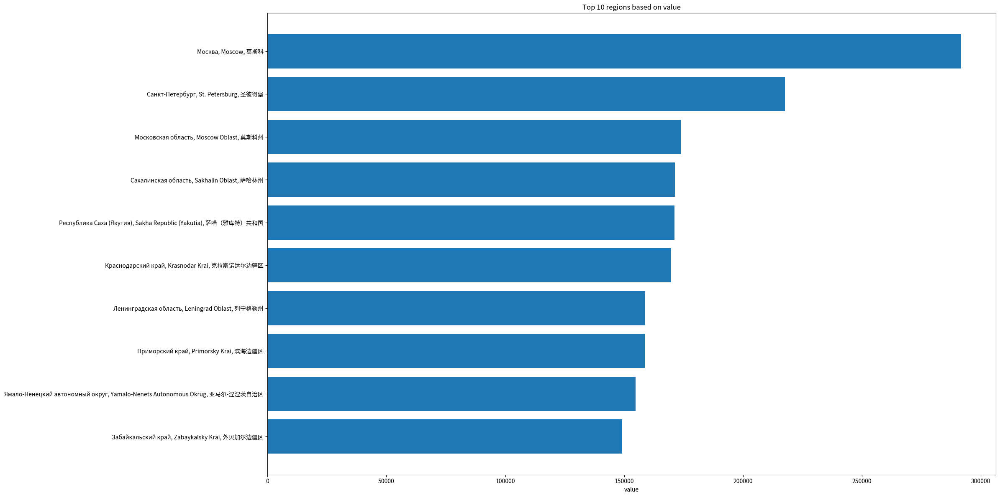

In [20]:
syv.plot_regions_barcharts(df=primary_deals,\
                       column='value',\
                       num_regions=10, orientation='top',\
                       data_frame_name="primary_deals")


让我们按一级市场房源每平方米成本列出前 10 个地区。

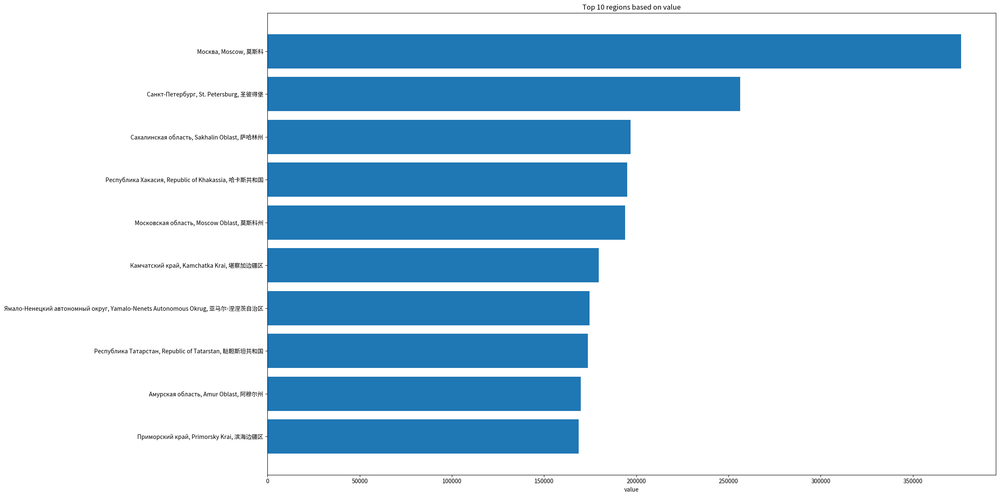

In [21]:
syv.plot_regions_barcharts(df=primary_offers,\
                       column='value',\
                       num_regions=10, orientation='top',\
                       data_frame_name="primary_offers")

让我们绘制一张按二手市场每平方米交易价格排序的前 10 个地区的图表。

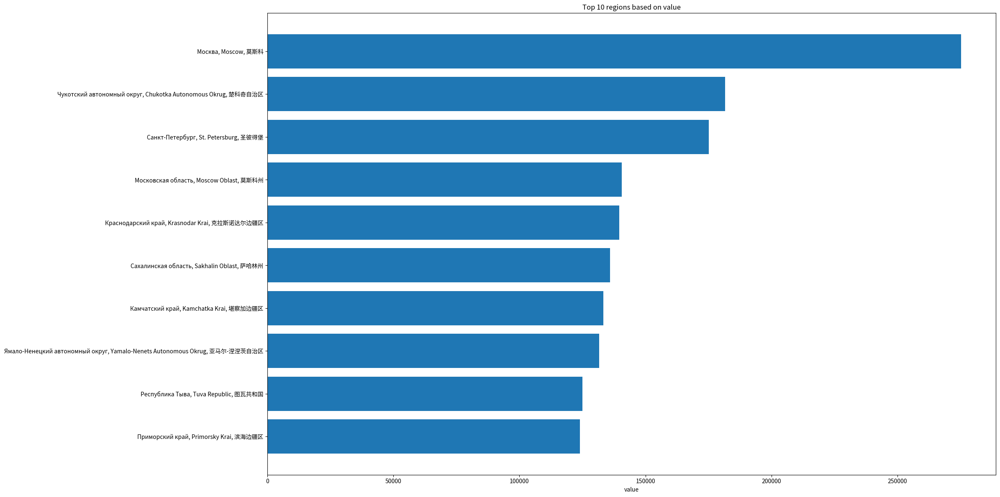

In [22]:
syv.plot_regions_barcharts(df=secondary_deals,\
                       column='value',\
                       num_regions=10, orientation='top',\
                       data_frame_name="secondary_deals")

让我们按二级市场每平方米的挂牌成本，绘制一份排名前十的地区图表。

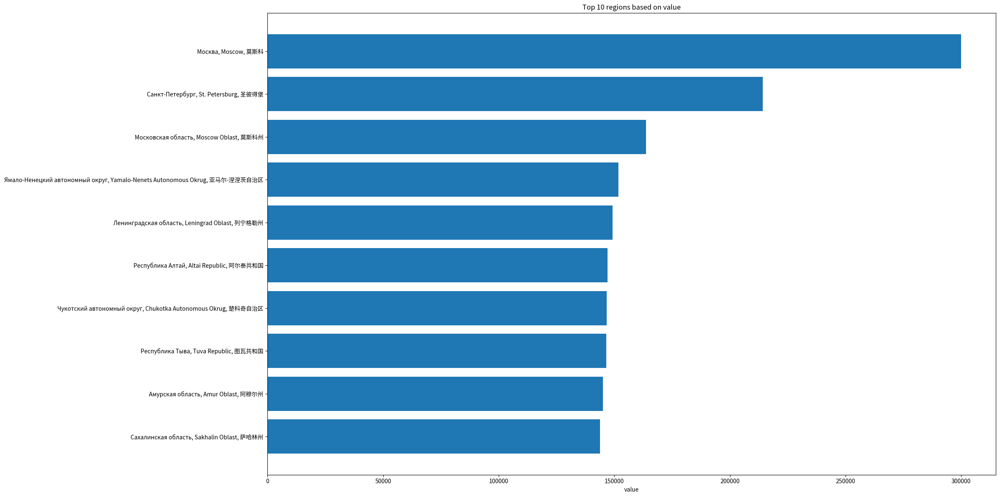

In [23]:
syv.plot_regions_barcharts(df=secondary_offers,\
                       column='value',\
                       num_regions=10, orientation='top',\
                       data_frame_name="secondary_offers")

让我们绘制一张各地区一级市场挂牌量的示意图。

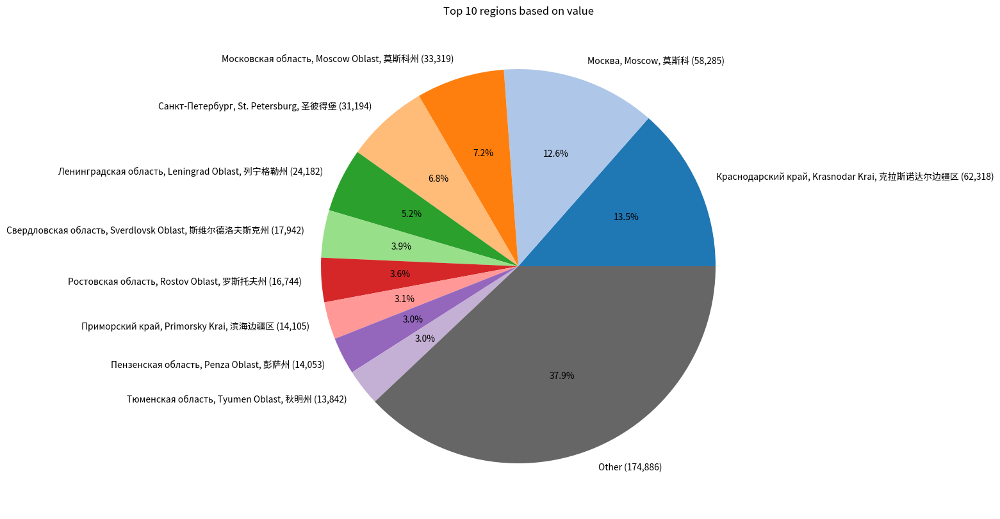

In [24]:
syv.plot_pie_chart(df=primary_volumes,\
                   column='value',\
                   exclude_regions=['Россия, Russia, 俄罗斯'],\
                   num_regions=10,\
                   data_frame_name="primary_volumes")


让我们绘制一个关于二级市场各地区房源量的图表。

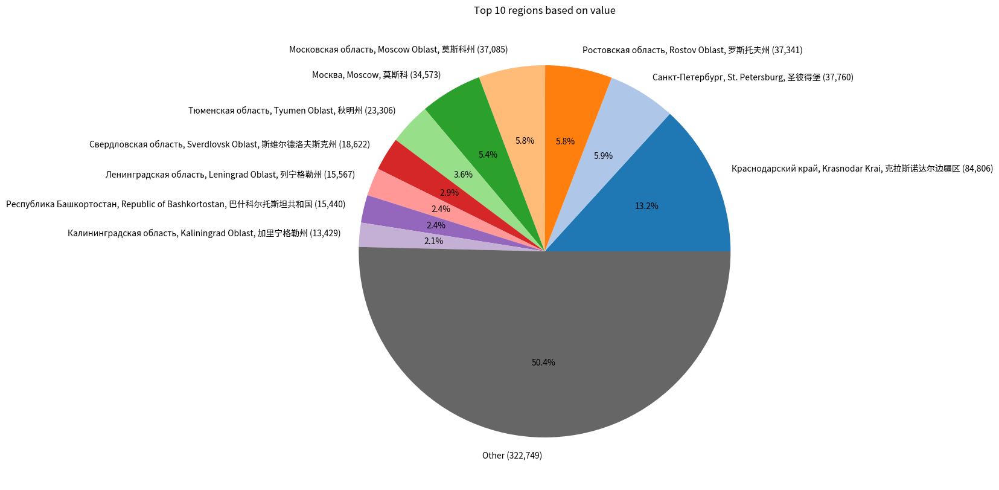

In [25]:
syv.plot_pie_chart(df=secondary_volumes,\
                   column='value',\
                   exclude_regions=['Россия, Russia, 俄罗斯'],\
                   num_regions=10,\
                   data_frame_name="secondary_volumes")

让我们制作一个关于二手房流动性排名前10的地区的图表。

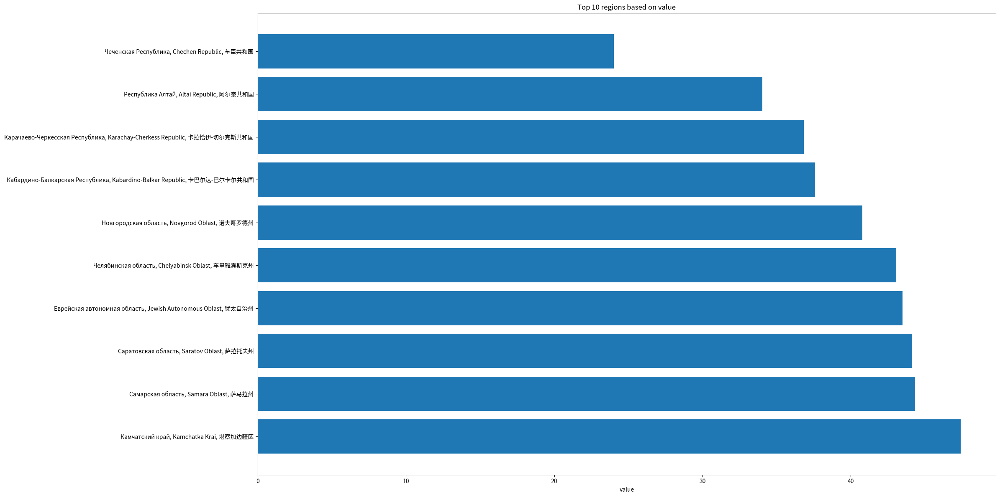

In [26]:
syv.plot_regions_barcharts(df=secondary_exposure,\
                       column='value',\
                       num_regions=10, orientation='bottom',\
                       data_frame_name="secondary_exposure")

让我们绘制一个图表，显示愿意从要价中提供最大折扣的初级房地产卖家排名前10的地区。

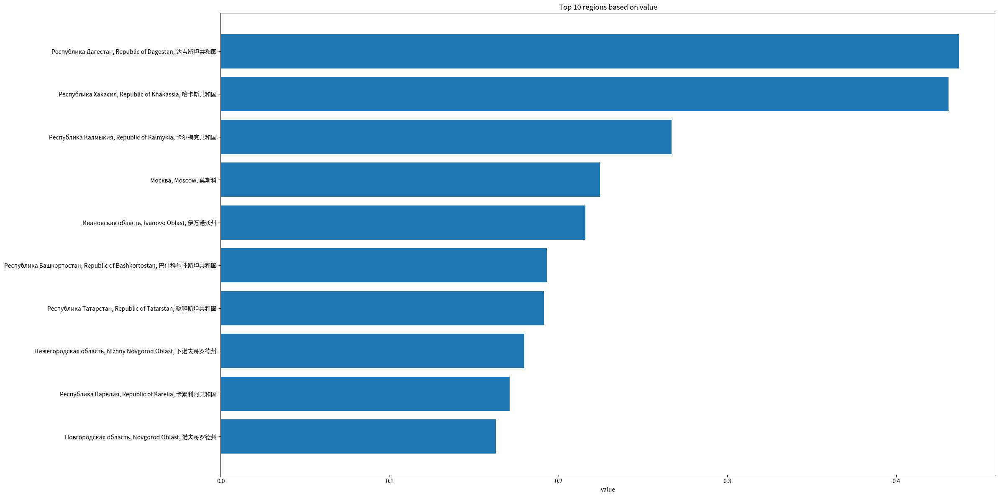

In [27]:
syv.plot_regions_barcharts(df=primary_discounts,\
                       column='value',\
                       num_regions=10, orientation='top',\
                       data_frame_name="primary_discounts")

让我们绘制一个图表，显示愿意从要价中提供最大折扣的二手房地产卖家排名前10的地区。

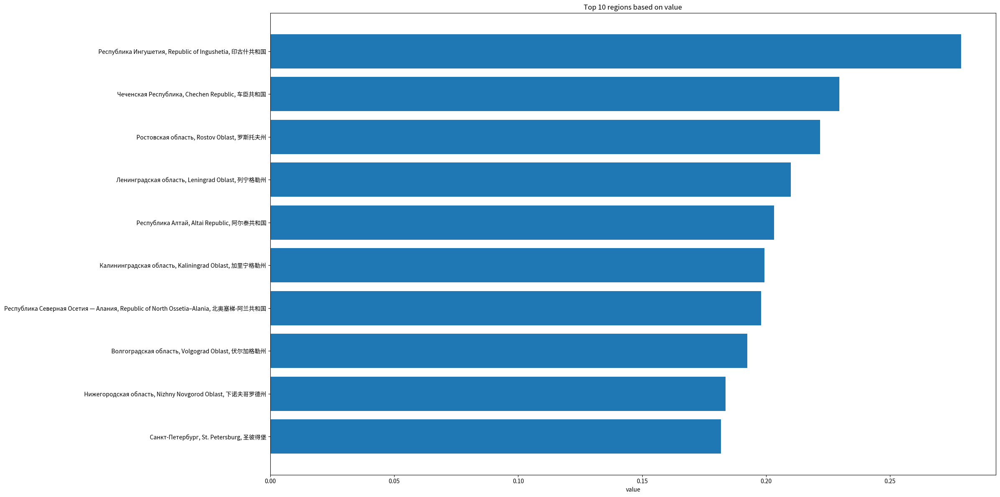

In [28]:
syv.plot_regions_barcharts(df=secondary_discounts,\
                       column='value',\
                       num_regions=10, orientation='top',\
                       data_frame_name="secondary_discounts")

让我们创建一个图表，展示初级市场交易价格与二级市场交易价格比率最高的前10个地区。

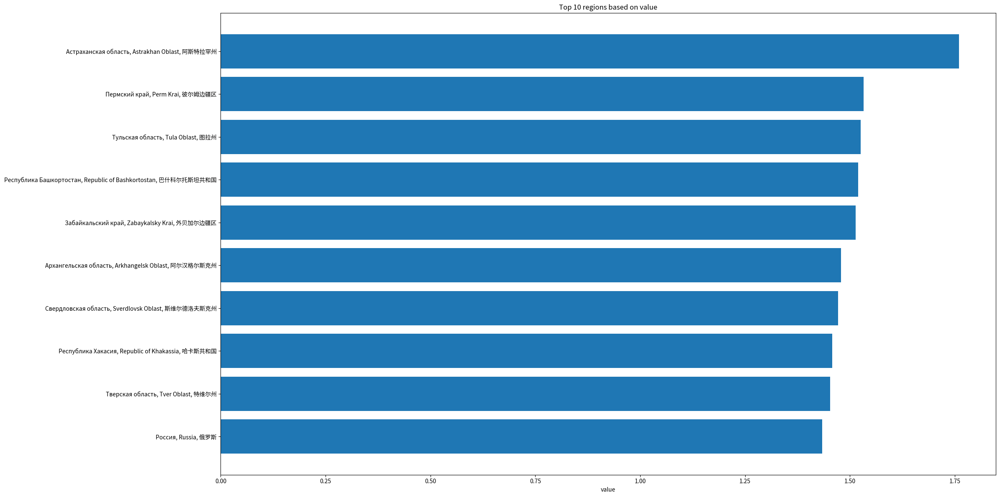

In [29]:
syv.plot_regions_barcharts(df=deals_ratios,\
                       column='value',\
                       num_regions=10, orientation='top',\
                       data_frame_name="deals_ratios")

让我们创建一个图表，展示初级市场交易价格与二级市场交易价格比率最低的前10个地区。

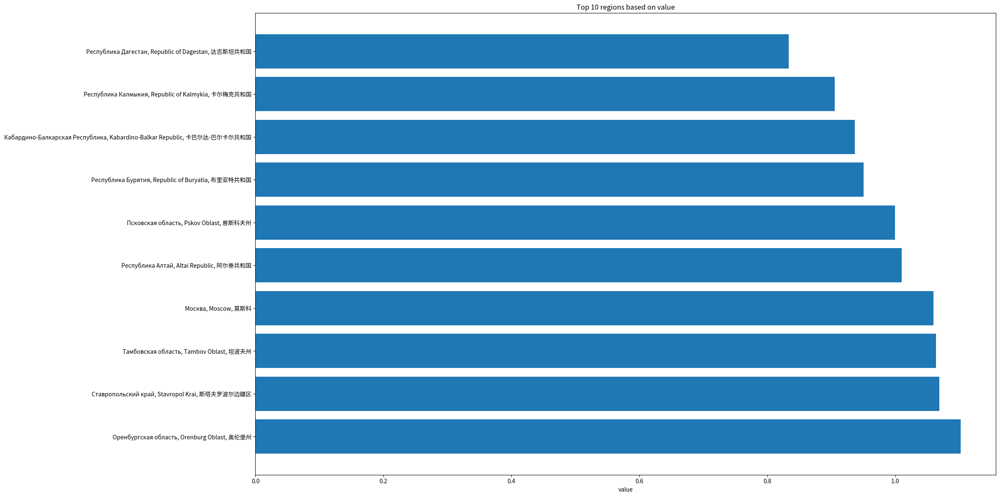

In [30]:
syv.plot_regions_barcharts(df=deals_ratios,\
                       column='value',\
                       num_regions=10, orientation='bottom',\
                       data_frame_name="deals_ratios")

让我们创建一个图表，展示初级市场要价与二级市场要价比率最高的前10个地区。

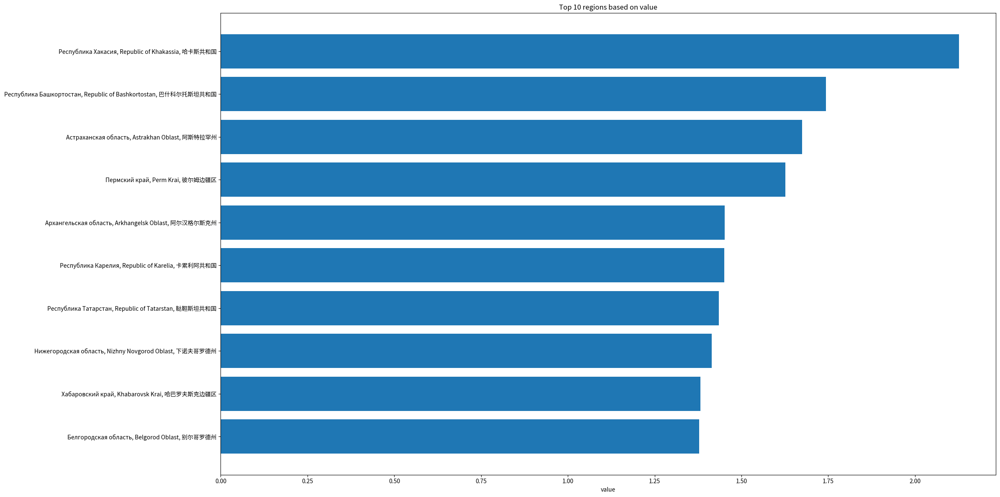

In [31]:
syv.plot_regions_barcharts(df=offers_ratios,\
                       column='value',\
                       num_regions=10, orientation='top',\
                       data_frame_name="offers_ratios")

让我们创建一个图表，展示初级市场要价与二级市场要价比率最低的前10个地区。

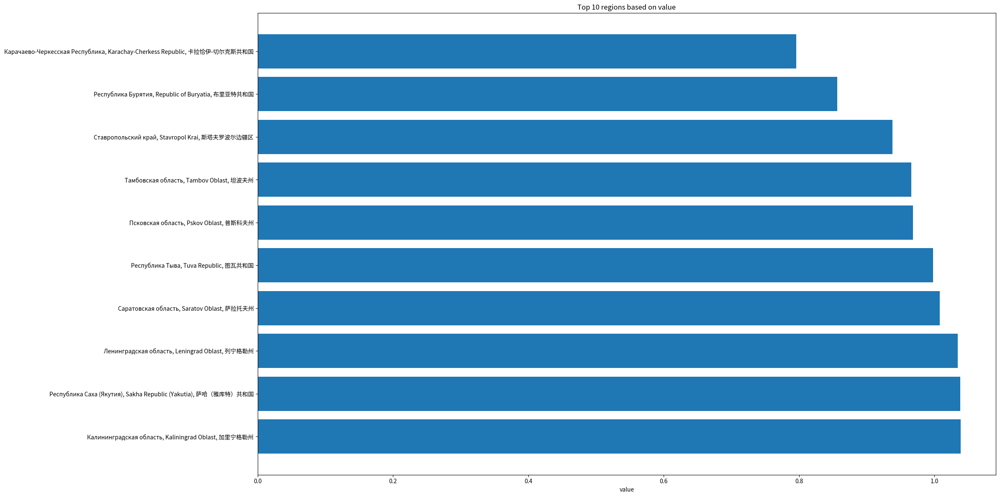

In [32]:
syv.plot_regions_barcharts(df=offers_ratios,\
                       column='value',\
                       num_regions=10, orientation='bottom',\
                       data_frame_name="offers_ratios")

让我们创建一个图表，展示初级市场挂牌与二级市场挂牌比率最高的前10个地区。

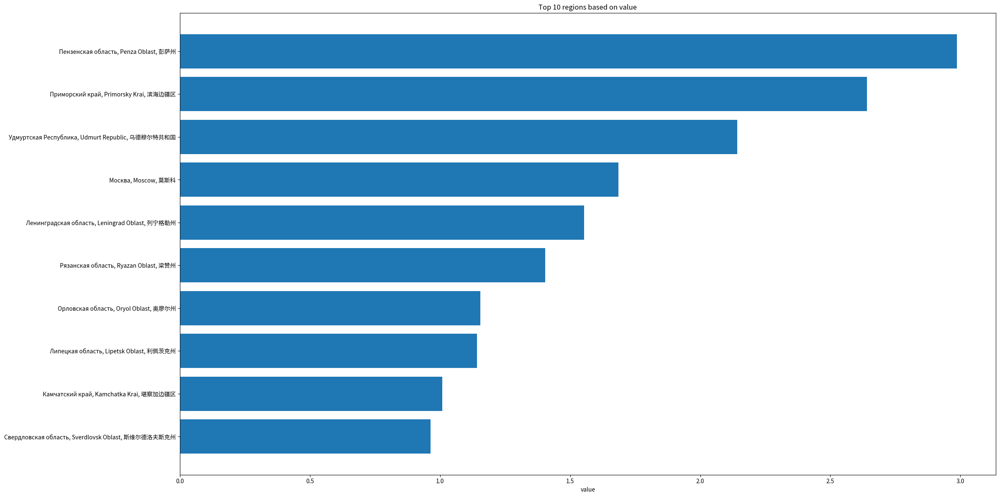

In [33]:
syv.plot_regions_barcharts(df=volumes_ratios,\
                       column='value',\
                       num_regions=10, orientation='top',\
                       data_frame_name="volumes_ratios")

让我们创建一个图表，展示初级市场挂牌与二级市场挂牌比率最低的前10个地区。

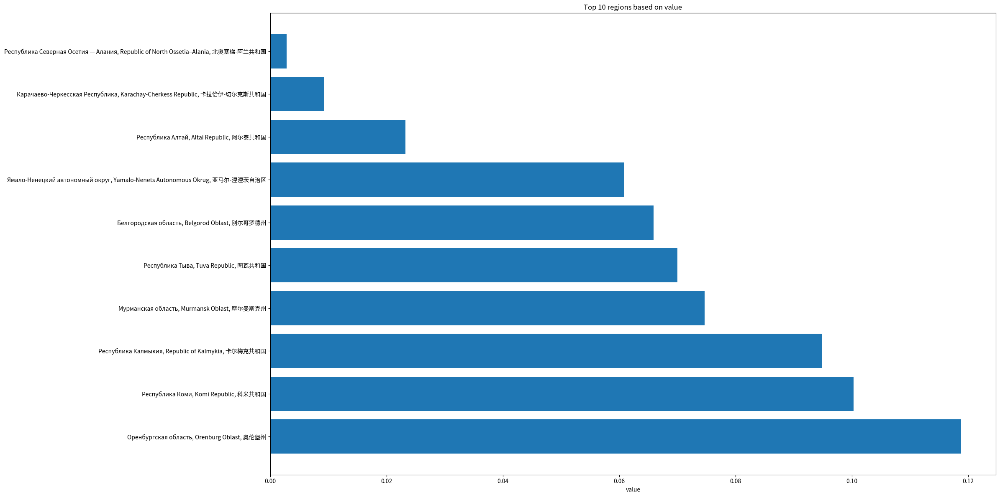

In [34]:
syv.plot_regions_barcharts(df=volumes_ratios,\
                       column='value',\
                       num_regions=10, orientation='bottom',\
                       data_frame_name="volumes_ratios")

### 2.3. 地区不平等的问题

为了分析地区不平等，我们绘制核密度估计图（这些图表是直方图的改进版，更现代）并计算吉尼系数的值，用于各种市场指标。吉尼系数在房地产市场的应用在[这篇材料](https://nbviewer.org/github/Kirill-Murashev/gini_coef_in_valuation/blob/master/gini_coef_en.ipynb)中有讨论。

#### 2.3.1. 核密度图的构建

让我们绘制一个核密度估计的图表，显示各地区初级市场交易价格的分布。蓝线和其下方的阴影区域 — 核密度估计的经验值；红色垂直虚线 — 表示整个俄罗斯的指标值；红色曲线 — 基于俄罗斯平均值和根据地区数据计算的经验标准偏差构建的正态分布的理论曲线。

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


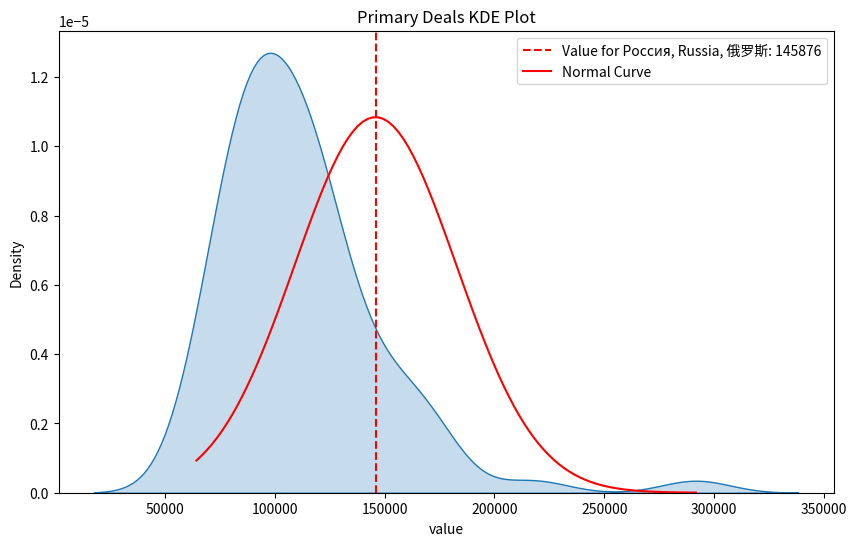

In [35]:
syv.plot_kde_single_column(df=primary_deals,\
                           title="Primary Deals KDE Plot")

让我们绘制区域初级市场供应价格分布密度的核密度估计图。

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


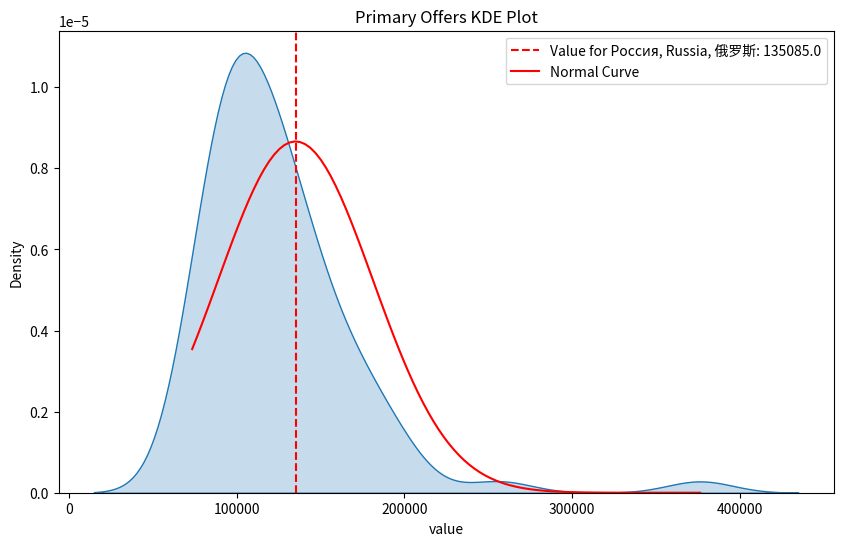

In [36]:
syv.plot_kde_single_column(df=primary_offers,\
                           title="Primary Offers KDE Plot")

让我们绘制区域次级市场交易价格分布的核密度估计图。

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


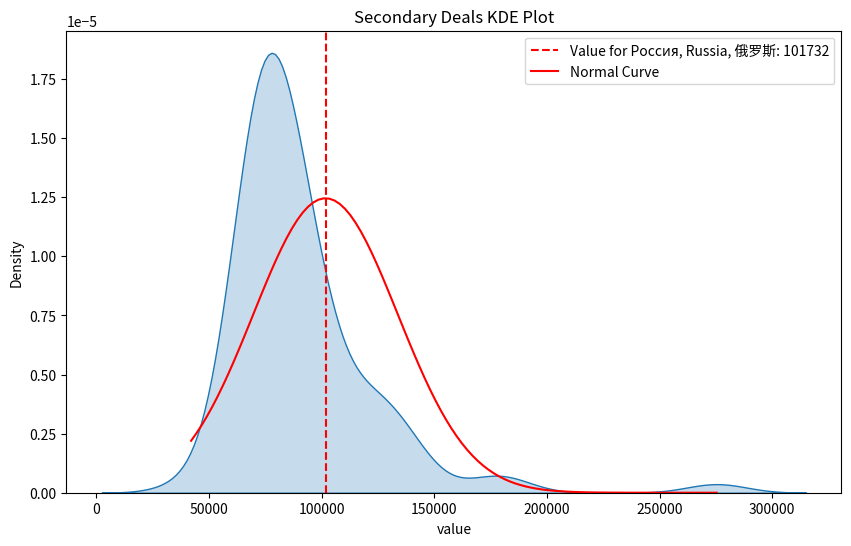

In [37]:
syv.plot_kde_single_column(df=secondary_deals,\
                           title="Secondary Deals KDE Plot")

让我们绘制区域次级市场供应价格分布密度的核密度估计图。

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


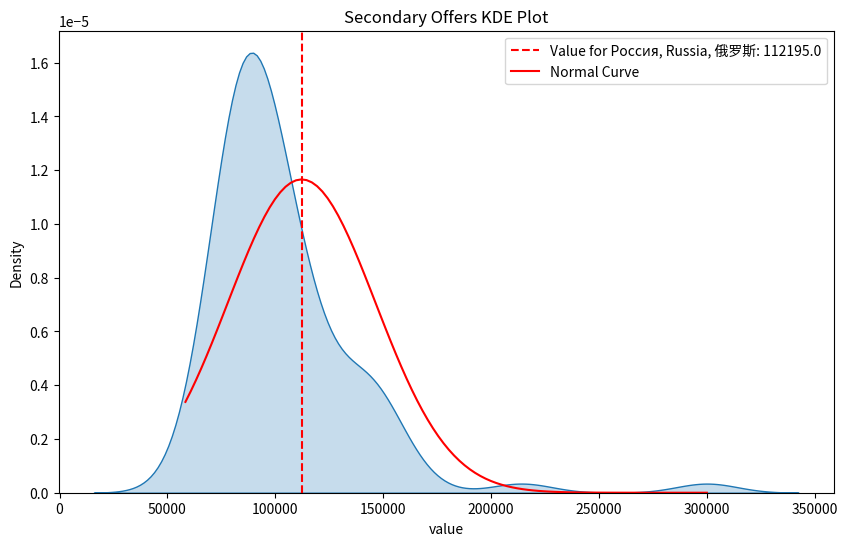

In [38]:
syv.plot_kde_single_column(df=secondary_offers,\
                           title="Secondary Offers KDE Plot")

让我们绘制区域初级市场供应量分布密度的核密度估计图。

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


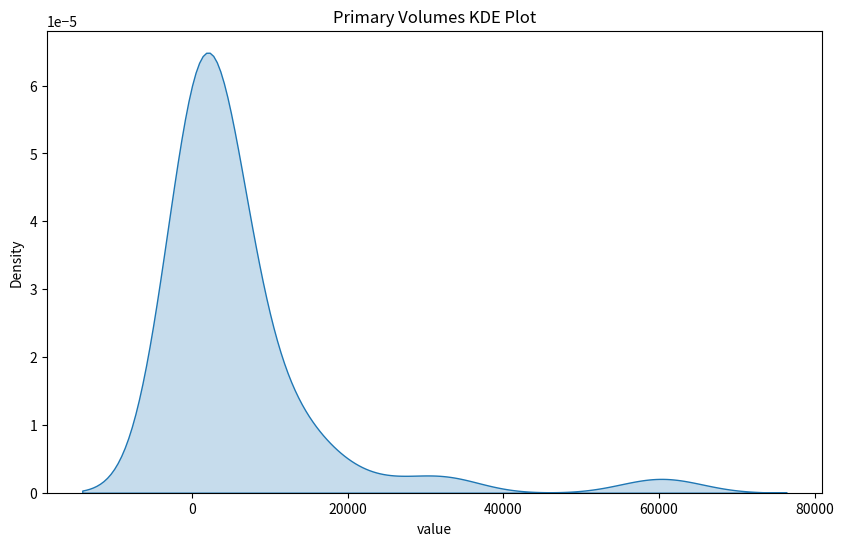

In [39]:
syv.plot_kde_single_column(df=primary_volumes,\
                           title="Primary Volumes KDE Plot",\
                           plot_russia_value=False,\
                           plot_normal_curve=False)

让我们绘制区域二级市场供应量分布密度的核密度估计图。

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


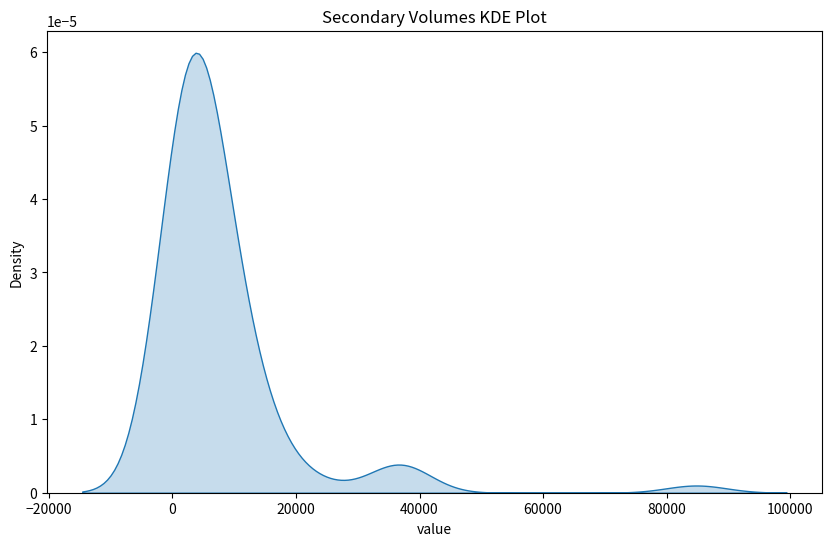

In [40]:
syv.plot_kde_single_column(df=secondary_volumes,\
                           title="Secondary Volumes KDE Plot",\
                           plot_russia_value=False,\
                           plot_normal_curve=False)

让我们构建一个核图来估计区域二级市场曝光期的密度分布。

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


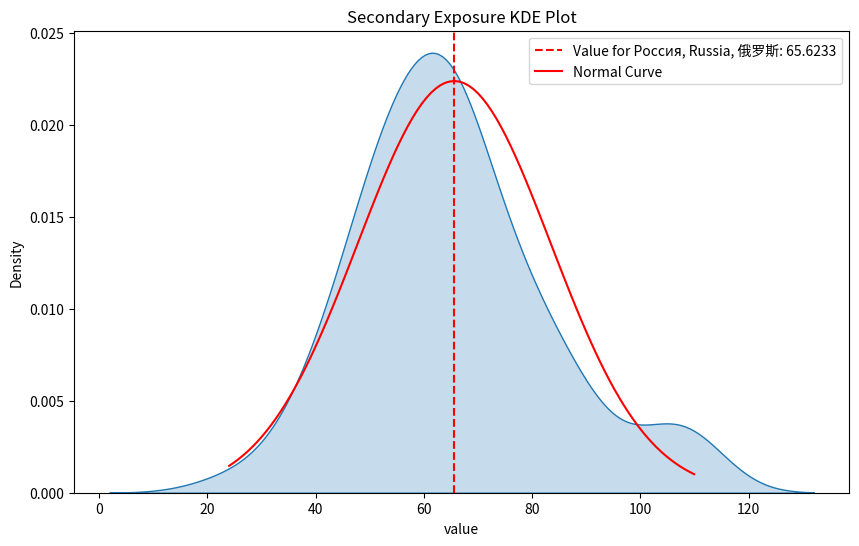

In [41]:
syv.plot_kde_single_column(df=secondary_exposure,\
                           title="Secondary Exposure KDE Plot")

让我们构建核估计图，以估算区域一级市场从报价到交易价格过渡中折扣的密度分布。

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


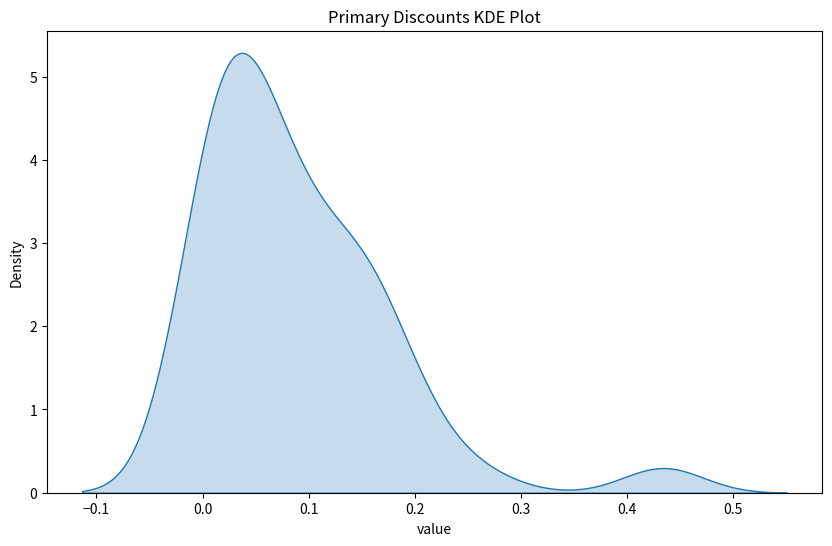

In [42]:
syv.plot_kde_single_column(df=primary_discounts,\
                           title="Primary Discounts KDE Plot",\
                           plot_russia_value=False,\
                           plot_normal_curve=False)

让我们构建核估计图，以估算区域二级市场从报价到交易价格过渡中折扣的密度分布。

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


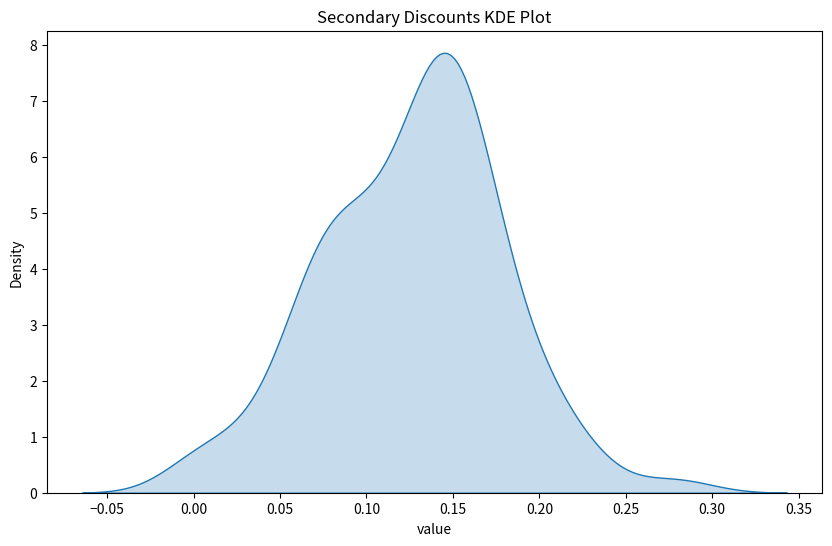

In [43]:
syv.plot_kde_single_column(df=secondary_discounts,\
                           title="Secondary Discounts KDE Plot",\
                           plot_russia_value=False,\
                           plot_normal_curve=False)

让我们绘制核密度估计图，来估算区域平均一级市场交易价格与平均二级市场价格之比。

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


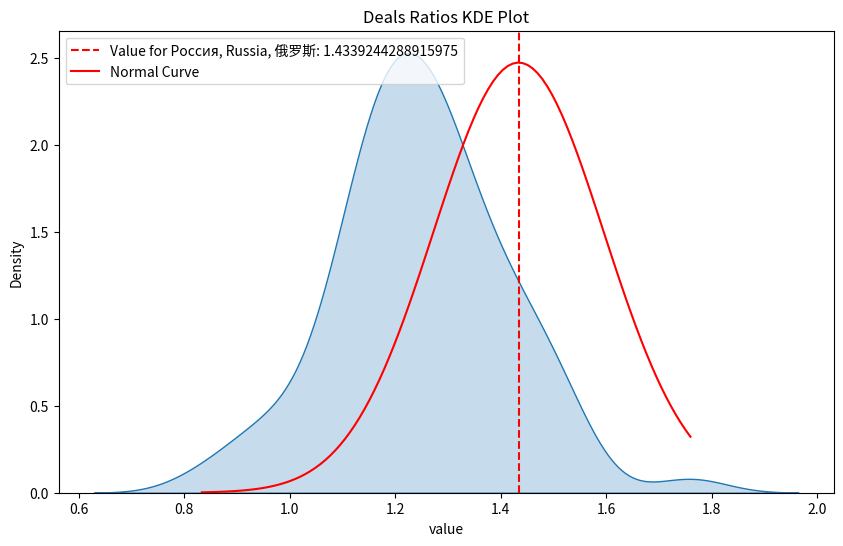

In [44]:
syv.plot_kde_single_column(df=deals_ratios,\
                           title="Deals Ratios KDE Plot")

让我们绘制核密度估计图，来估算区域内中位数一级市场报价与中位数二级市场报价之比。

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


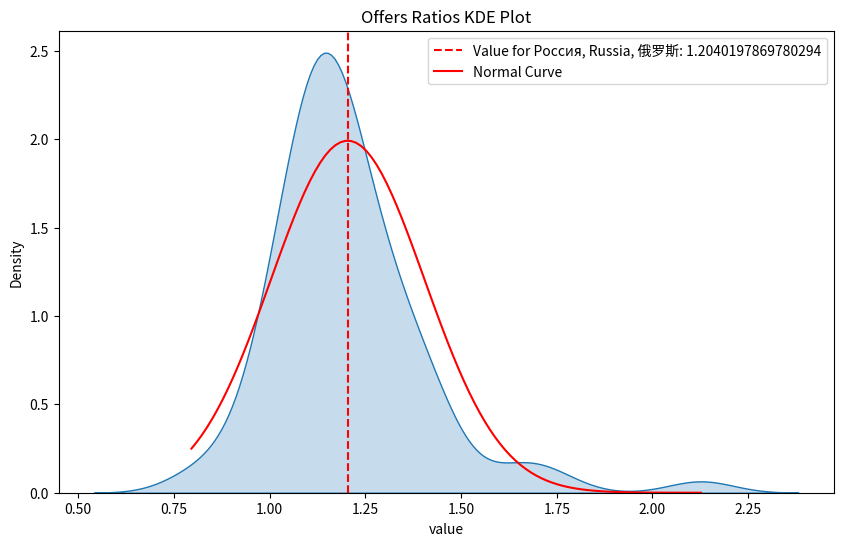

In [45]:
syv.plot_kde_single_column(df=offers_ratios,\
                           title="Offers Ratios KDE Plot")

让我们绘制核密度估计图，来估算区域内一级市场与二级市场供应之比。

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


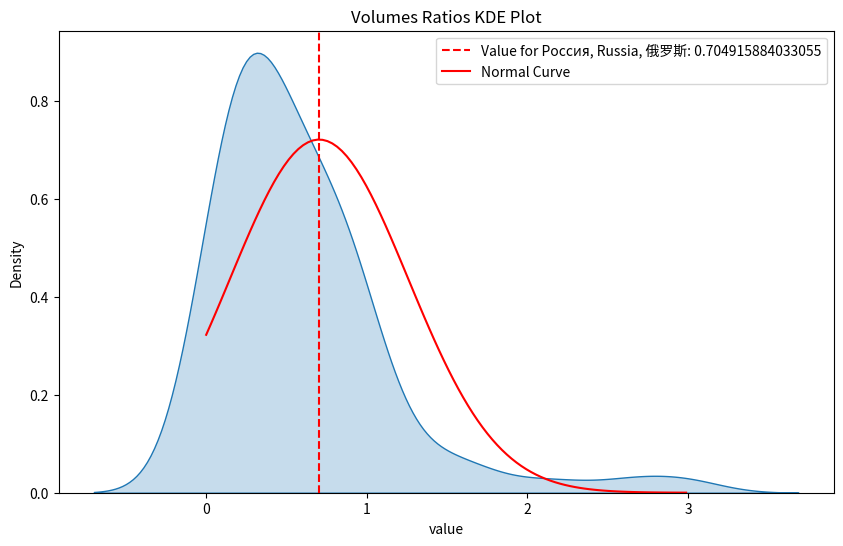

In [46]:
syv.plot_kde_single_column(df=volumes_ratios,\
                           title="Volumes Ratios KDE Plot")

#### 2.3.2. 计算基尼系数。

让我们计算实际值和标准化值的基尼系数值。

In [47]:
gini_df = syv.calculate_gini_coefficients(
    [primary_deals, primary_offers, secondary_deals, secondary_offers,
     primary_volumes, secondary_volumes],
    names=['primary_deals', 'primary_offers', 'secondary_deals', 'secondary_offers',
           'primary_volumes', 'secondary_volumes']
)

gini_df


,data_frame,gini_value,gini_standardized_value
0,primary_deals,0.163955,0.384508
1,primary_offers,0.175365,0.426707
2,secondary_deals,0.158601,0.294893
3,secondary_offers,0.152548,0.348751
4,primary_volumes,0.691546,0.691623
5,secondary_volumes,0.578708,0.581861


## 3. 聚类

使用层次聚类分析进行了聚类。使用欧几里得距离衡量对象间距离和Ward方法衡量簇间距离。我们基于四个价格和两个市场指标的标准化值进行聚类。只对在上述六个指标中均有值的地区进行了聚类。

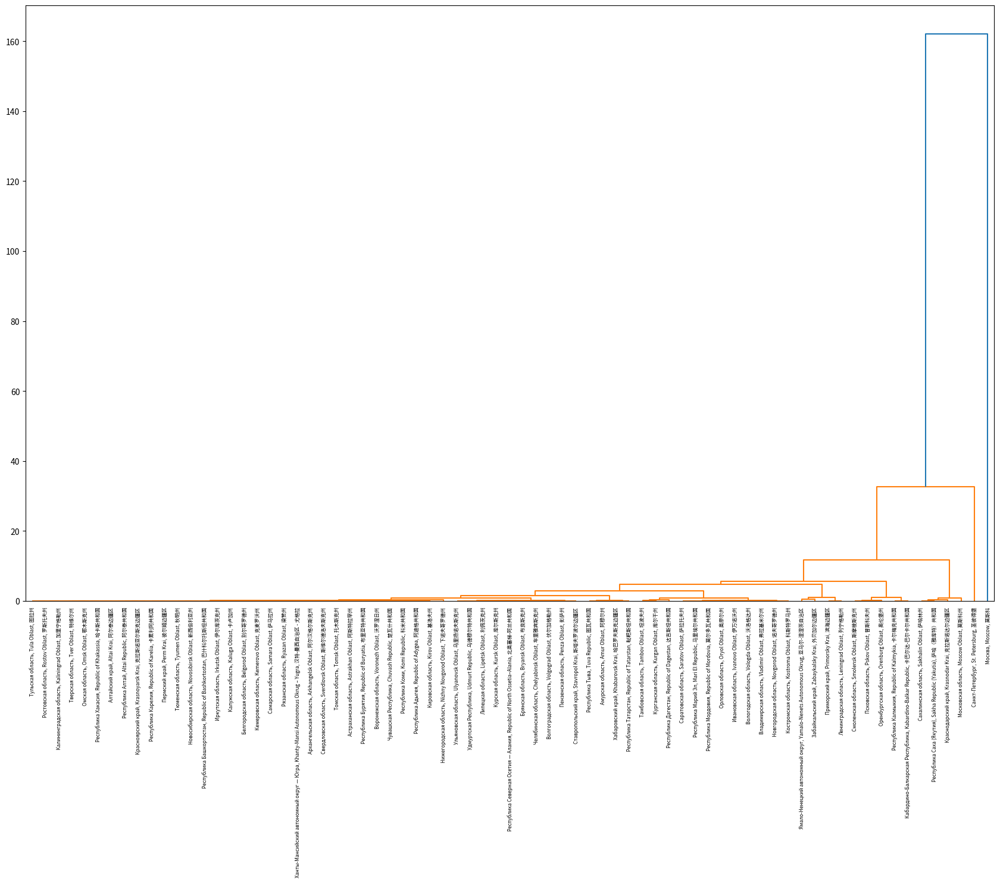

/home/kaarlahti/anaconda3/lib/python3.11/site-packages/sklearn/cluster/_agglomerative.py:1006: FutureWarning: Attribute `affinity` was deprecated in version 1.2 and will be removed in 1.4. Use `metric` instead
  warnings.warn(


,region,cluster_label
0,"Санкт-Петербург, St. Petersburg, 圣彼得堡",2
1,"Ленинградская область, Leningrad Oblast, 列宁格勒州",0
2,"Москва, Moscow, 莫斯科",3
3,"Московская область, Moscow Oblast, 莫斯科州",4
4,"Краснодарский край, Krasnodar Krai, 克拉斯诺达尔边疆区",4
5,"Алтайский край, Altai Krai, 阿尔泰边疆区",0
6,"Амурская область, Amur Oblast, 阿穆尔州",0
7,"Архангельская область, Arkhangelsk Oblast, 阿尔汉...",0
8,"Астраханская область, Astrakhan Oblast, 阿斯特拉罕州",0
9,"Белгородская область, Belgorod Oblast, 别尔哥罗德州",0


In [48]:
# List of data frames to be used in clustering
data_frames_to_cluster = [primary_deals, primary_offers, secondary_deals, secondary_offers, primary_volumes, secondary_volumes]

# Columns to be used in clustering
columns_to_cluster = ['standardized_value']

# Number of clusters
num_clusters = 5

# Affinity
affinity_type = 'euclidean'

# Linkage method
linkage_method = 'ward'

# Calling the hierarchical_clustering function
clustered_data_hier = syv.hierarchical_clustering(data_frames=data_frames_to_cluster, 
                                        columns=columns_to_cluster, 
                                        n_clusters=num_clusters, 
                                        affinity=affinity_type, 
                                        linkage_method=linkage_method)

# Displaying the resulting DataFrame with cluster labels
clustered_data_hier


除其他外，可以从以下几个方面来解释聚类结果

|群组编号|说明|
| :- | :- |
|3|该集群包括一个地区 &mdash；莫斯科市，该市是[全球阿尔法城市](https://en.wikipedia.org/wiki/Global_city)，其住宅房地产市场表现尤为突出|
|2|该集群包括一个地区 &mdash；圣彼得堡市，该市是[全球 Beta 城市](https://en.wikipedia.org/wiki/Globalization_and_World_Cities_Research_Network)，同时也拥有较高的住宅房地产市场发展水平，以及生活水平和人民福祉|
|1|这一组既包括生活水平较高的繁荣地区（如列宁格勒州和克拉斯诺达尔州），也包括名义工资处于 "北方 "水平的地区。这种工资水平提高了名义价格，但生活质量却没有得到实际改善（如后贝加尔边疆区和雅库特）。|
|0|该组包含了大部分房地产市场发展水平一般的地区|
|4|该组包括房地产市场发展水平和生活质量相对较低的地区|
|无编号|其余区域的特点是房地产对象数量相对较少，因此无法将其归入任何一个群组|

应该指出的是，组群编号本身并没有任何意义，而是与组群中各地区首次统一的时间有关的技术性编号。

## 4. 地理分析

按地区创建各种指标的热图。地图的高分辨率版本以及可缩放的交互式地图可通过以上链接获取。共创建了 13 幅热图。价格指标以名义卢布表示。

|指标|[目录](https://web.tresorit.com/l/RTdE4#_8WMDnK6hjXgVfSPD5-mlg) 中的地图和相应文件的名称|
| :- | :- |
|一级市场平均交易价格|Primary Deals|
|二级市场平均交易价格|Secondary Deals|
|一级市场投标价格中位数|Primary Offers|
|二级市场投标价格中位数|Secondary Offers|
|一级市场的供应量|Primary Volumes|
|二级市场的供应量|Secondary Volumes|
|在二级市场上购买住房的平均期限|Secondary Exposure|
|一级市场从买入价到成交价过渡过程中的典型折扣|Primary Discounts|
|二级市场上从买入价到成交价过渡过程中的典型折扣|Secondary Discounts|
|一级市场平均交易价格与二级市场相同指标的比率|Deals Ratios|
|一级市场投标价格中位数与二级市场相同指标的比率|Offers Ratios|
|一级市场供应量与二级市场相同指标的比率|Volumes Ratios|
|一级市场从报价到成交价过渡时的典型折扣与二级市场类似指标的比率|Discounts Ratios|


### 4.1. 静态地图

我们将得到包含边界坐标和区域多边形的 GeoJSON。

In [49]:
# Load the default GeoJSON data
gdf = syv.get_rf_geojson()
# Keeping only the 'name' and 'geometry' columns
gdf = gdf[['name', 'geometry']]
# Unify column names
gdf.rename(columns={'name': 'region'}, inplace=True)


数据完整性检查。

In [50]:
primary_deals, secondary_deals, primary_offers, secondary_offers,\
primary_volumes, secondary_volumes, secondary_exposure,\
primary_discounts, secondary_discounts, deals_ratios,\
offers_ratios, volumes_ratios, discounts_ratios = syv.check_consistency(
    primary_deals, 
    secondary_deals, 
    primary_offers, 
    secondary_offers,
    primary_volumes,
    secondary_volumes,
    secondary_exposure,
    primary_discounts,
    secondary_discounts,
    deals_ratios,
    offers_ratios,
    volumes_ratios,
    discounts_ratios
)

查找并纠正 Sberindex 和 GeoJSON 数据库之间区域名称的不匹配。

In [51]:
# Harmonize regions names
geojson_regions = syv.get_all_regions_from_geojson(gdf)
gdf = syv.harmonize_geojson_names(gdf)
primary_deals = syv.harmonize_sql_names(primary_deals)
secondary_deals = syv.harmonize_sql_names(secondary_deals)
primary_offers = syv.harmonize_sql_names(primary_offers)
secondary_offers = syv.harmonize_sql_names(secondary_offers)
primary_volumes = syv.harmonize_sql_names(primary_volumes)
secondary_volumes = syv.harmonize_sql_names(secondary_volumes)
secondary_exposure = syv.harmonize_sql_names(secondary_exposure)
primary_discounts = syv.harmonize_sql_names(primary_discounts)
secondary_discounts = syv.harmonize_sql_names(secondary_discounts)
deals_ratios = syv.harmonize_sql_names(deals_ratios)
offers_ratios = syv.harmonize_sql_names(offers_ratios)
volumes_ratios = syv.harmonize_sql_names(volumes_ratios)
discounts_ratios = syv.harmonize_sql_names(discounts_ratios)

# Create object
sberindex_regions = syv.get_all_regions_from_sql(primary_deals,\
                                                 secondary_deals,\
                                                 primary_offers,\
                                                 secondary_offers,\
                                                 primary_volumes,\
                                                 secondary_volumes,\
                                                 secondary_exposure,\
                                                 primary_discounts,\
                                                 secondary_discounts,\
                                                 deals_ratios,\
                                                 offers_ratios,\
                                                 volumes_ratios,\
                                                 discounts_ratios
                                                )

# Remove redundant regions
gdf = syv.remove_redundant_from_geojson(gdf)

# Create list of regions from GeoJSON
geojson_regions = syv.get_all_regions_from_geojson(gdf)

# Recreate object
sberindex_regions = syv.get_all_regions_from_sql(primary_deals,\
                                                 secondary_deals,\
                                                 primary_offers,\
                                                 secondary_offers,\
                                                 primary_volumes,\
                                                 secondary_volumes,\
                                                 secondary_exposure,\
                                                 primary_discounts,\
                                                 secondary_discounts,\
                                                 deals_ratios,\
                                                 offers_ratios,\
                                                 volumes_ratios,\
                                                 discounts_ratios
                                                )

让我们比较一下 Sberindex 和 GeoJSON 中的地区列表。

In [52]:
mismatches_sql_geojson, mismatches_geojson_sql = syv.find_region_mismatches(sberindex_regions, geojson_regions)

print("Regions in data frames but not in GeoJSON:", mismatches_sql_geojson)
print("Regions in GeoJSON but not in data frames:", mismatches_geojson_sql)

Regions in data frames but not in GeoJSON: ['Россия, Russia, 俄罗斯']
Regions in GeoJSON but not in data frames: []


让我们定义用于绘图的地图列表。

In [53]:
# Add to datasets
datasets_plt = [
    (primary_deals, 'value', 'Primary Deals', 'primary_deals.png'),
    (secondary_deals, 'value', 'Secondary Deals', 'secondary_deals.png'),
    (primary_offers, 'value', 'Primary Offers', 'primary_offers.png'),
    (secondary_offers, 'value', 'Secondary Offers', 'secondary_offers.png'),
    (primary_volumes, 'value', 'Primary Volume', 'primary_volumes.png'),
    (secondary_volumes, 'value', 'Secondary Volume', 'secondary_volumes.png'),
    (secondary_exposure, 'value', 'Secondary Exposure', 'secondary_exposure.png'),
    (primary_discounts, 'value', 'Primary Discount Rate', 'primary_discount.png'),
    (secondary_discounts, 'value', 'Secondary Discount Rate', 'secondary_discount.png'),
    (deals_ratios, 'value', 'Primary to Secondary Market Deals Ratios', 'deals_ratios.png'),
    (offers_ratios, 'value', 'Primary to Secondary Market Offers Ratios', 'offers_ratios.png'),
    (volumes_ratios, 'value', 'Primary to Secondary Market Volumes Ratios', 'volumes_ratios.png'),
    (discounts_ratios, 'value', 'Primary to Secondary Market Discounts Ratios', 'discounts_ratios.png')
]


让我们调整坐标，绘制一幅楚科奇部分位于西半球的地图。

In [54]:
shifted_gdf = syv.shift_geometry(gdf.copy())

让我们绘制截至研究之日俄罗斯住宅房地产市场 13 项指标的静态热图。这些地图可作为单独文件在 [链接](https://web.tresorit.com/l/RTdE4#_8WMDnK6hjXgVfSPD5-mlg) 上获取。

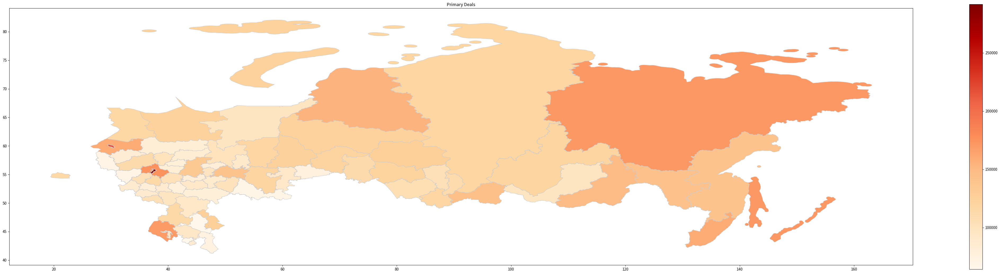

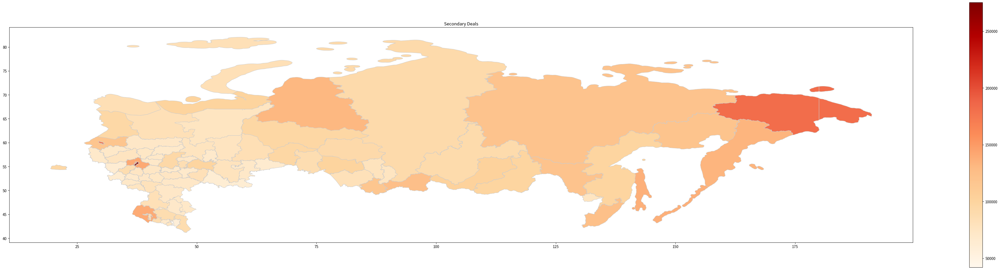

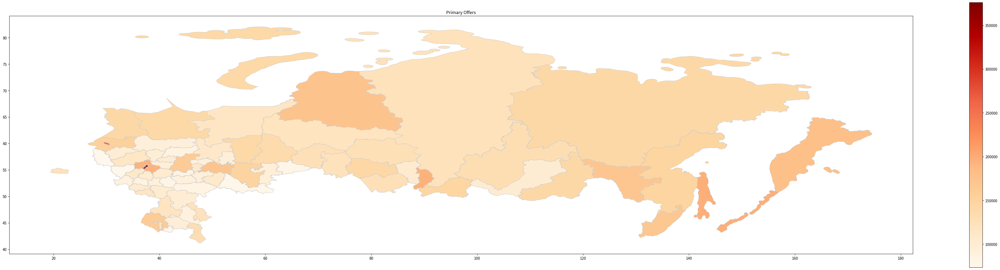

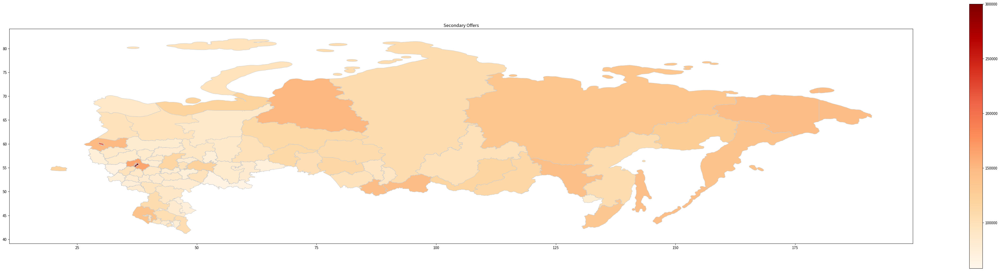

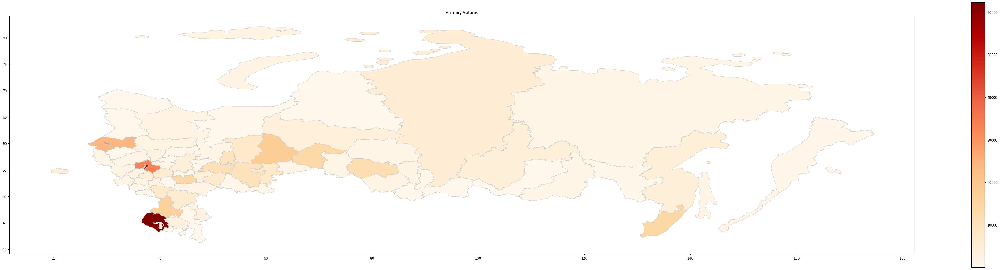

...

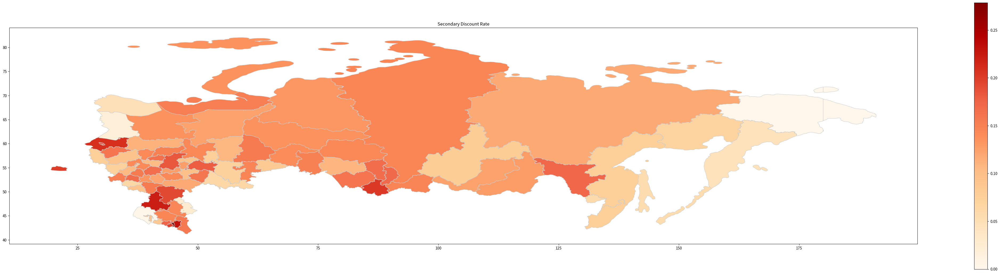

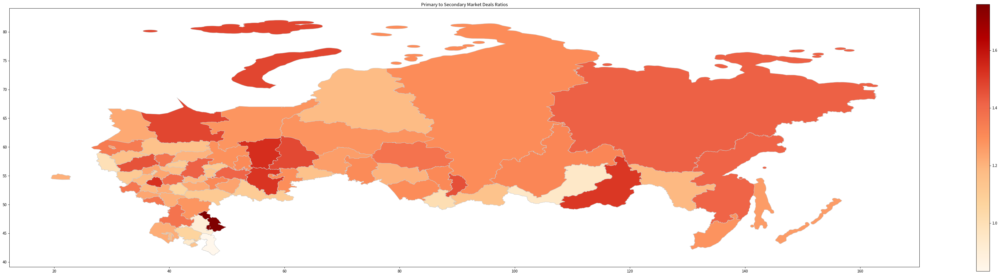

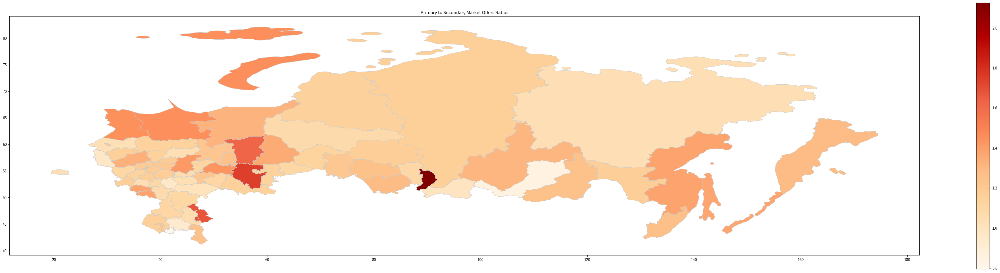

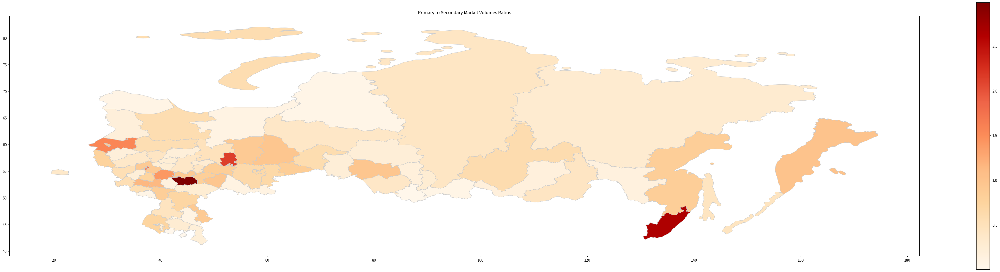

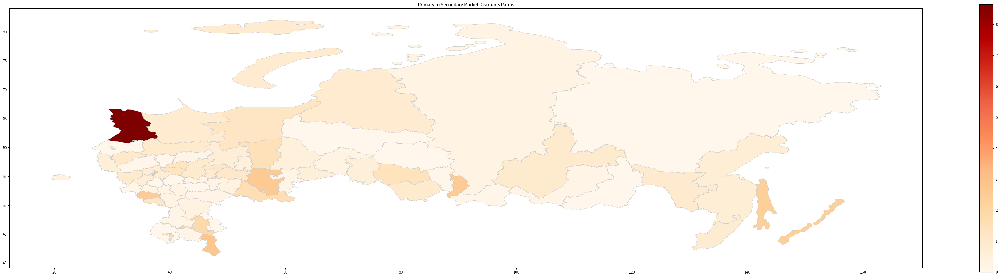

In [55]:
# Looping over each dataset in datasets_plt
for data, column_name, display_name, filename in datasets_plt:
    # Calling the function with the appropriate arguments
    syv.create_and_display_heatmaps_sberindex(data, column_name, display_name, filename, shifted_gdf)


### 4.2. 互动地图

我们还可以绘制互动地图。可通过 [链接](https://web.tresorit.com/l/RTdE4#_8WMDnK6hjXgVfSPD5-mlg) 以 html 文件格式获取。

In [56]:
# Add to datasets
datasets_folium = [
    (primary_deals, 'value', 'Primary Deals', 'primary_deals.png'),
    (secondary_deals, 'value', 'Secondary Deals', 'secondary_deals.png'),
    (primary_offers, 'value', 'Primary Offers', 'primary_offers.png'),
    (secondary_offers, 'value', 'Secondary Offers', 'secondary_offers.png'),
    (primary_volumes, 'value', 'Primary Volume', 'primary_volumes.png'),
    (secondary_volumes, 'value', 'Secondary Volume', 'secondary_volumes.png'),
    (secondary_exposure, 'value', 'Secondary Exposure', 'secondary_exposure.png'),
    (primary_discounts, 'value', 'Primary Discount Rate', 'primary_discount.png'),
    (secondary_discounts, 'value', 'Secondary Discount Rate', 'secondary_discount.png'),
    (deals_ratios, 'value', 'Primary to Secondary Market Deals Ratios', 'deals_ratios.png'),
    (offers_ratios, 'value', 'Primary to Secondary Market Offers Ratios', 'offers_ratios.png'),
    (volumes_ratios, 'value', 'Primary to Secondary Market Volumes Ratios', 'volumes_ratios.png'),
    (discounts_ratios, 'value', 'Primary to Secondary Market Discounts Ratios', 'discounts_ratios.png')
]

In [57]:
for data, column_name, display_name, filename in datasets_folium:
    syv.create_and_save_choropleth_sberindex(data, column_name, display_name, gdf, display_name)


## 5. 时间序列分析

### 5.1. 数据准备

在 Sberindex 一侧创建包含整个观察期数据的数据帧。完整性检查。

In [58]:
# Fetch data for the entire period
primary_deals_ts, secondary_deals_ts, primary_offers_ts,\
secondary_offers_ts, primary_volumes_ts, secondary_volumes_ts,\
secondary_exposure_ts = syv.read_sberindex_flats()

# Check data
primary_deals_ts, secondary_deals_ts, primary_offers_ts,\
secondary_offers_ts, primary_volumes_ts, secondary_volumes_ts,\
secondary_exposure_ts = syv.check_consistency(primary_deals_ts,\
                                              secondary_deals_ts,\
                                              primary_offers_ts,\
                                              secondary_offers_ts,\
                                              primary_volumes_ts,\
                                              secondary_volumes_ts,\
                                              secondary_exposure_ts)


从买入价转为成交价时计算折扣。

In [59]:
primary_discount_rates_ts = syv.calculate_discount_rates_ts(primary_deals_ts, primary_offers_ts, 'primary')
secondary_discount_rates_ts = syv.calculate_discount_rates_ts(secondary_deals_ts, secondary_offers_ts, 'secondary')

计算一级市场和二级市场的比率。

In [60]:
deals_ratios_ts = syv.calculate_market_ratios_ts(primary_deals_ts, secondary_deals_ts, 'value')
offers_ratios_ts = syv.calculate_market_ratios_ts(primary_offers_ts, secondary_offers_ts, 'value')
volumes_ratios_ts = syv.calculate_market_ratios_ts(primary_volumes_ts, secondary_volumes_ts, 'value')
discounts_ratios_ts = syv.calculate_market_ratios_ts(primary_discount_rates_ts, secondary_discount_rates_ts, 'value')

计算一级市场和二级市场之间的差距。

In [61]:
deals_gaps_ts = syv.calculate_market_gaps_ts(primary_deals_ts, secondary_deals_ts, 'value')
offers_gaps_ts = syv.calculate_market_gaps_ts(primary_offers_ts, secondary_offers_ts, 'value')
volumes_gaps_ts = syv.calculate_market_gaps_ts(primary_volumes_ts, secondary_volumes_ts, 'value')
discounts_gaps_ts = syv.calculate_market_gaps_ts(primary_discount_rates_ts, secondary_discount_rates_ts, 'value')

计算市场指标的基尼系数。

In [62]:
primary_deals_gini_ts, primary_offers_gini_ts, secondary_deals_gini_ts,\
secondary_offers_gini_ts, primary_volumes_gini_ts, secondary_volumes_gini_ts,\
secondary_exposure_gini_ts = syv.calculate_gini_over_time(primary_deals_ts,\
                                                          primary_offers_ts,\
                                                          secondary_deals_ts,\
                                                          secondary_offers_ts,\
                                                          primary_volumes_ts,\
                                                          secondary_volumes_ts,\
                                                          secondary_exposure_ts)

primary_deals_gini_ts, primary_offers_gini_ts, secondary_deals_gini_ts,\
secondary_offers_gini_ts, primary_volumes_gini_ts, secondary_volumes_gini_ts,\
secondary_exposure_gini_ts = syv.sort_dataframe_by_date(primary_deals_gini_ts,\
                                                            primary_offers_gini_ts,\
                                                            secondary_deals_gini_ts,\
                                                            secondary_offers_gini_ts,\
                                                            primary_volumes_gini_ts,\
                                                            secondary_volumes_gini_ts,\
                                                            secondary_exposure_gini_ts)

primary_deals_gini_ts, primary_offers_gini_ts, secondary_deals_gini_ts,\
secondary_offers_gini_ts, primary_volumes_gini_ts, secondary_volumes_gini_ts,\
secondary_exposure_gini_ts = syv.convert_date_to_month_year(primary_deals_gini_ts,\
                                                            primary_offers_gini_ts,\
                                                            secondary_deals_gini_ts,\
                                                            secondary_offers_gini_ts,\
                                                            primary_volumes_gini_ts,\
                                                            secondary_volumes_gini_ts,\
                                                            secondary_exposure_gini_ts)

### 5.2. 名义卢布和物理指标分析

#### 5.2.1. 卢布名义价格

让我们绘制五个主要地区的卢布名义价格动态图： 圣彼得堡、列宁格勒州、莫斯科、莫斯科州、克拉斯诺达尔边疆区。

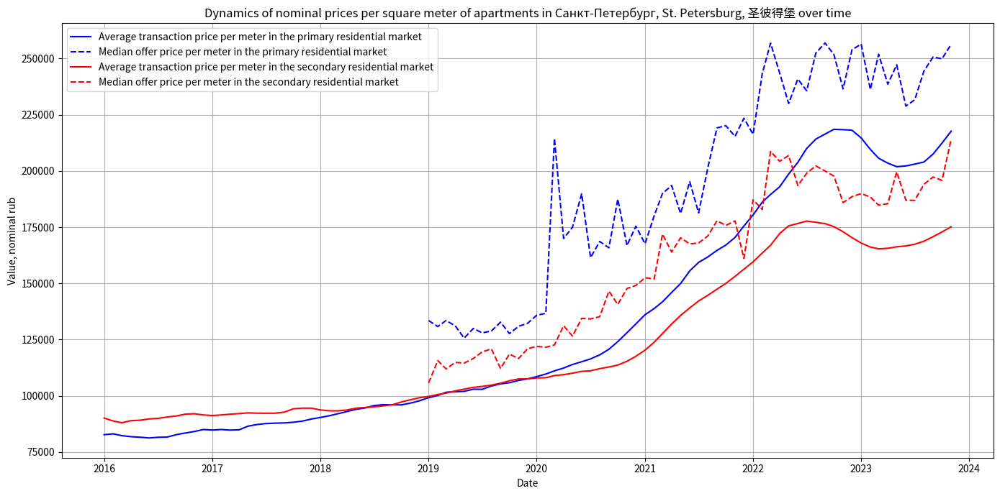

In [63]:
syv.plot_market_price_indicators(primary_deals_ts,
                                 primary_offers_ts,
                                 secondary_deals_ts,
                                 secondary_offers_ts,
                                 'Санкт-Петербург, St. Petersburg, 圣彼得堡')

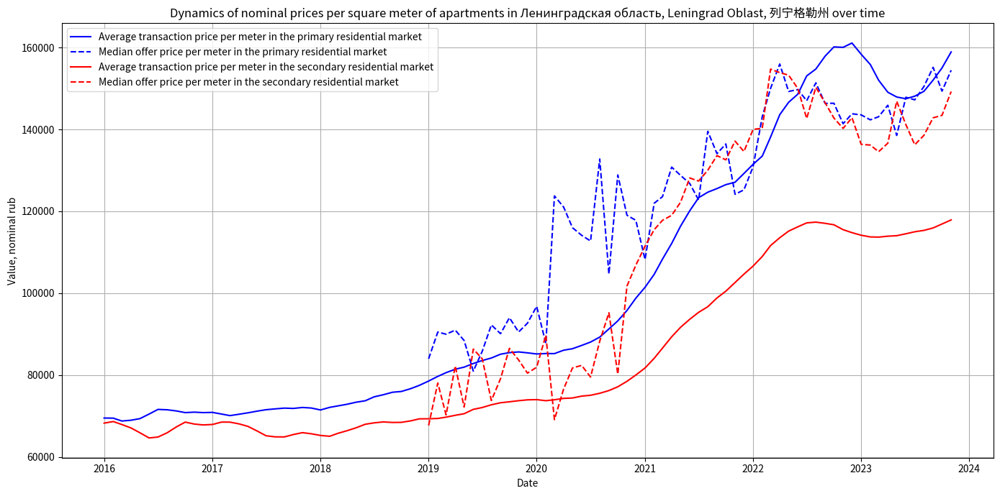

In [64]:
syv.plot_market_price_indicators(primary_deals_ts,
                                 primary_offers_ts,
                                 secondary_deals_ts,
                                 secondary_offers_ts,
                                 'Ленинградская область, Leningrad Oblast, 列宁格勒州')

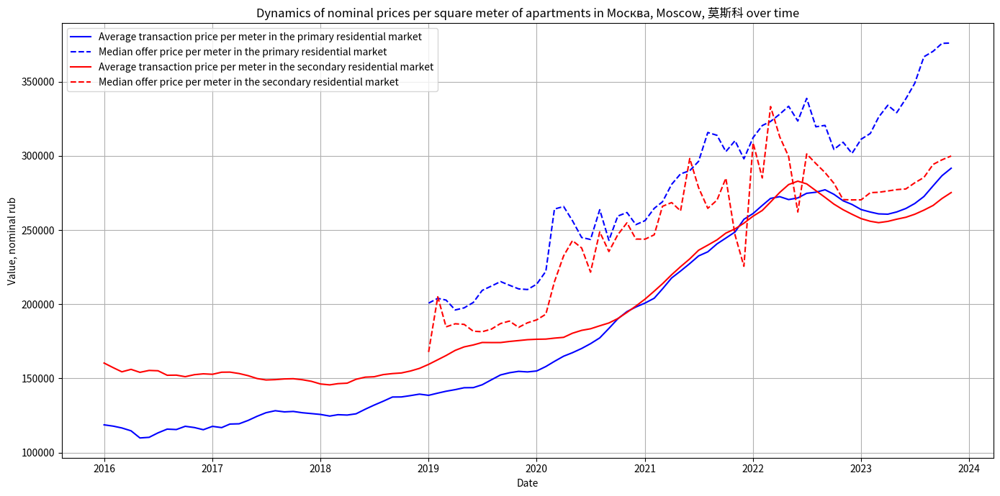

In [65]:
syv.plot_market_price_indicators(primary_deals_ts,
                                 primary_offers_ts,
                                 secondary_deals_ts,
                                 secondary_offers_ts,
                                 'Москва, Moscow, 莫斯科')

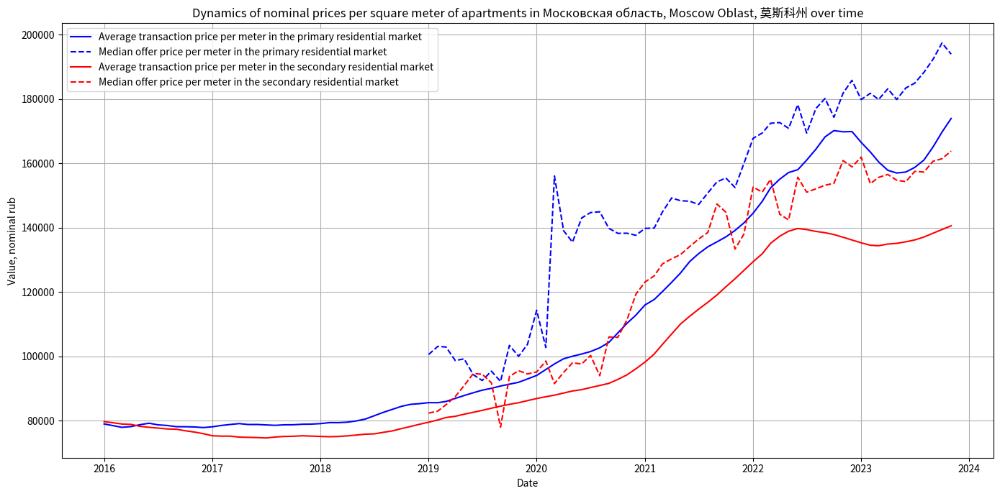

In [66]:
syv.plot_market_price_indicators(primary_deals_ts,
                                 primary_offers_ts,
                                 secondary_deals_ts,
                                 secondary_offers_ts,
                                 'Московская область, Moscow Oblast, 莫斯科州')

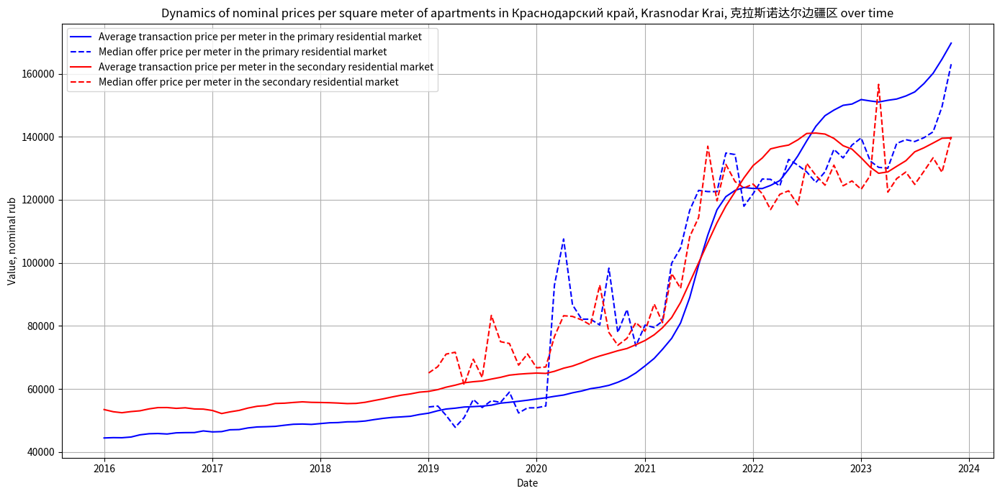

In [67]:
syv.plot_market_price_indicators(primary_deals_ts,
                                 primary_offers_ts,
                                 secondary_deals_ts,
                                 secondary_offers_ts,
                                 'Краснодарский край, Krasnodar Krai, 克拉斯诺达尔边疆区')

所有地区的图表可在 [链接](https://web.tresorit.com/l/1SK8A#4Rzl6PPlQ6Ri07meLsayuA) 上查阅。

In [68]:
syv.save_prices_plots(primary_deals_ts, primary_offers_ts,\
                      secondary_deals_ts, secondary_offers_ts,\
                      column_name='value')

#### 5.2.2. 批量

让我们来绘制五个主要地区的地段成交量动态图： 圣彼得堡、列宁格勒州、莫斯科、莫斯科州、克拉斯诺达尔边疆区。

In [69]:
volume_labels = ['Primary market', 'Secondary market']

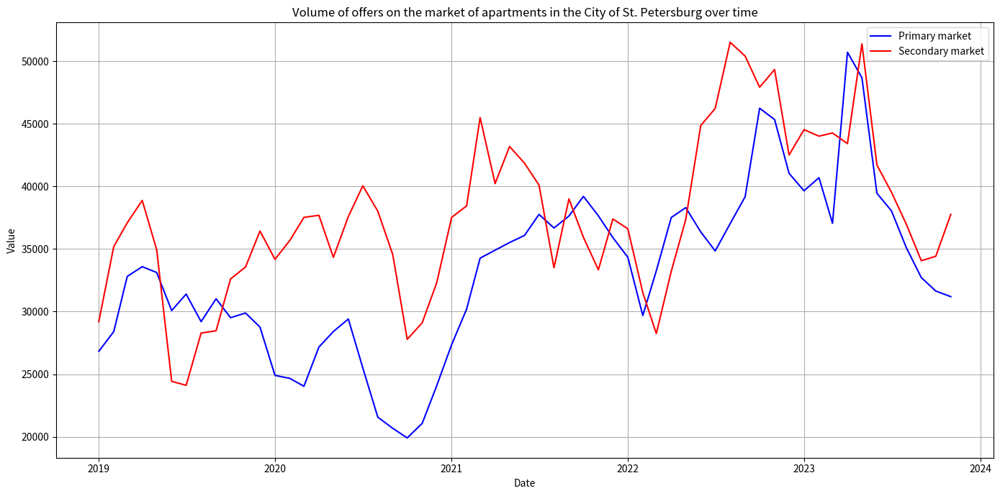

In [70]:
syv.plot_market_indicators(primary_volumes_ts, secondary_volumes_ts,
                           region_name='Санкт-Петербург, St. Petersburg, 圣彼得堡',
                           labels=volume_labels, colors=['blue', 'red'],
                           linestyles=['-', '-'],
                           title=f'Volume of offers on the market of apartments in the City of St. Petersburg over time')

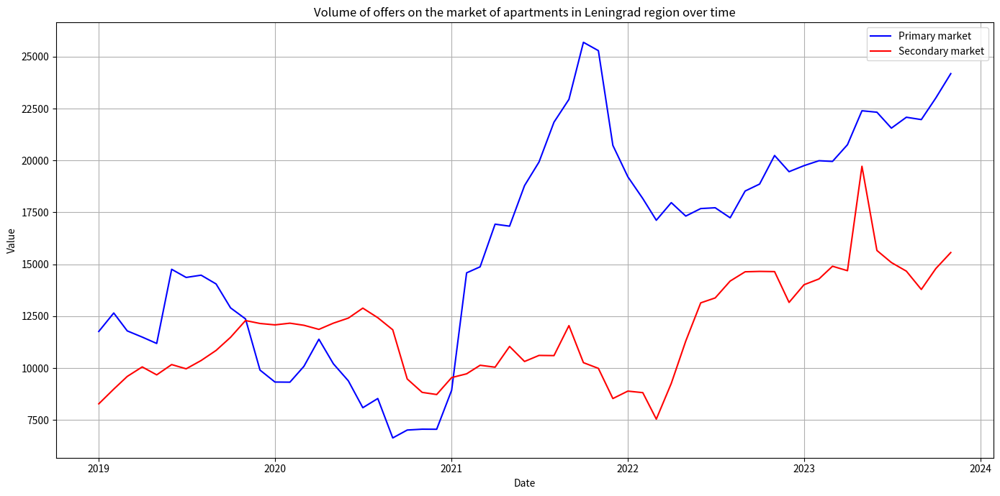

In [71]:
syv.plot_market_indicators(primary_volumes_ts, secondary_volumes_ts,
                           region_name='Ленинградская область, Leningrad Oblast, 列宁格勒州',
                           labels=volume_labels, colors=['blue', 'red'],
                           linestyles=['-', '-'],
                           title=f'Volume of offers on the market of apartments in Leningrad region over time')

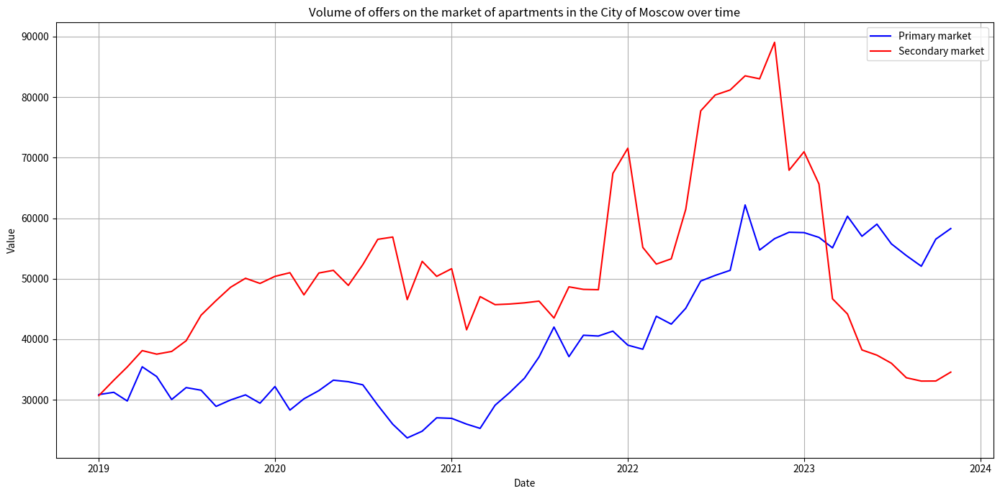

In [72]:
syv.plot_market_indicators(primary_volumes_ts, secondary_volumes_ts,
                           region_name='Москва, Moscow, 莫斯科',
                           labels=volume_labels, colors=['blue', 'red'],
                           linestyles=['-', '-'],
                           title=f'Volume of offers on the market of apartments in the City of Moscow over time')

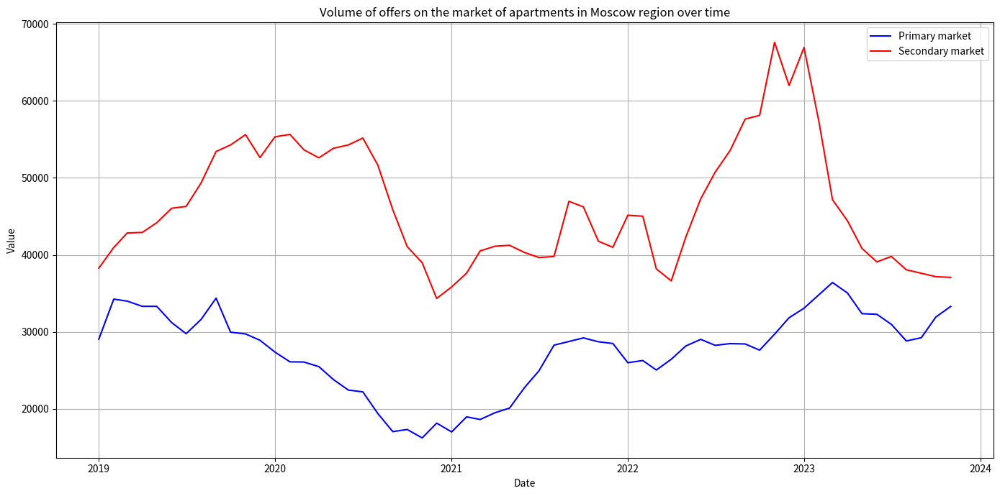

In [73]:
syv.plot_market_indicators(primary_volumes_ts, secondary_volumes_ts,
                           region_name='Московская область, Moscow Oblast, 莫斯科州',
                           labels=volume_labels, colors=['blue', 'red'],
                           linestyles=['-', '-'],
                           title=f'Volume of offers on the market of apartments in Moscow region over time')

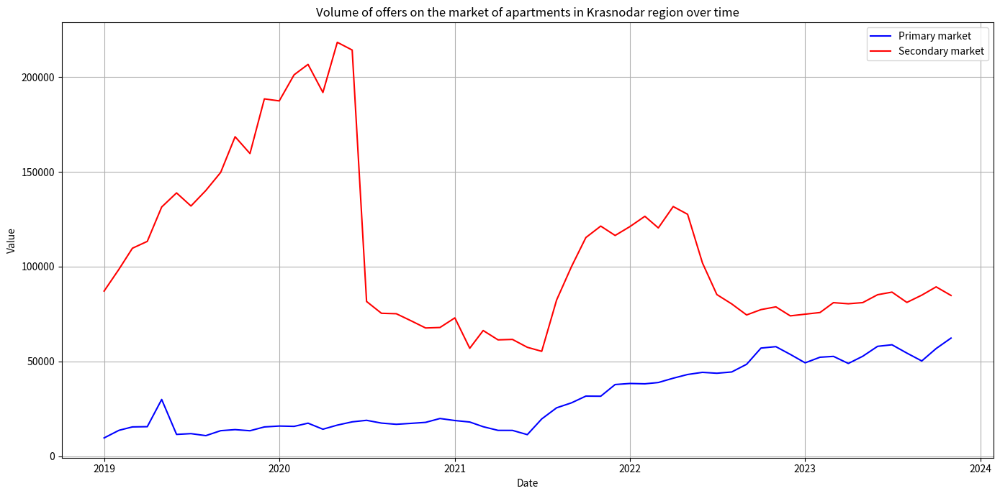

In [74]:
syv.plot_market_indicators(primary_volumes_ts, secondary_volumes_ts,
                           region_name='Краснодарский край, Krasnodar Krai, 克拉斯诺达尔边疆区',
                           labels=volume_labels, colors=['blue', 'red'],
                           linestyles=['-', '-'],
                           title=f'Volume of offers on the market of apartments in Krasnodar region over time')

所有地区的图表可在 [链接](https://web.tresorit.com/l/1SK8A#4Rzl6PPlQ6Ri07meLsayuA) 上查阅。

In [75]:
syv.save_volumes_plots(primary_volumes_ts,\
                       secondary_volumes_ts,\
                       column_name='value')

#### 5.2.3. 二级市场的风险暴露期


创建五个主要地区二级市场曝光时间动态图（以天为单位）： 圣彼得堡、列宁格勒州、莫斯科、莫斯科州、克拉斯诺达尔边疆区。

In [76]:
exposure_labels = ['Secondary market']

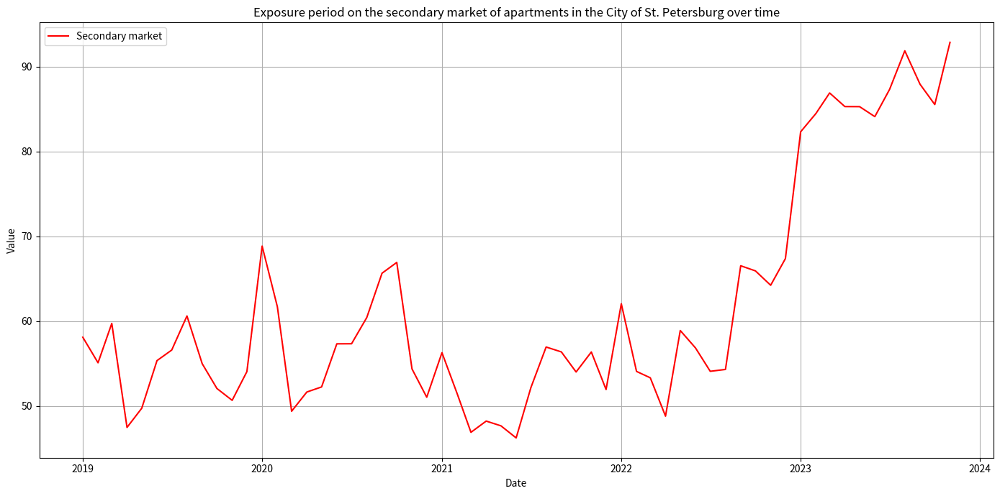

In [77]:
syv.plot_market_indicators(secondary_exposure_ts,
                           region_name='Санкт-Петербург, St. Petersburg, 圣彼得堡',
                           labels=exposure_labels, colors=['red'],
                           linestyles=['-'],
                           title=f'Exposure period on the secondary market of apartments in the City of St. Petersburg over time')

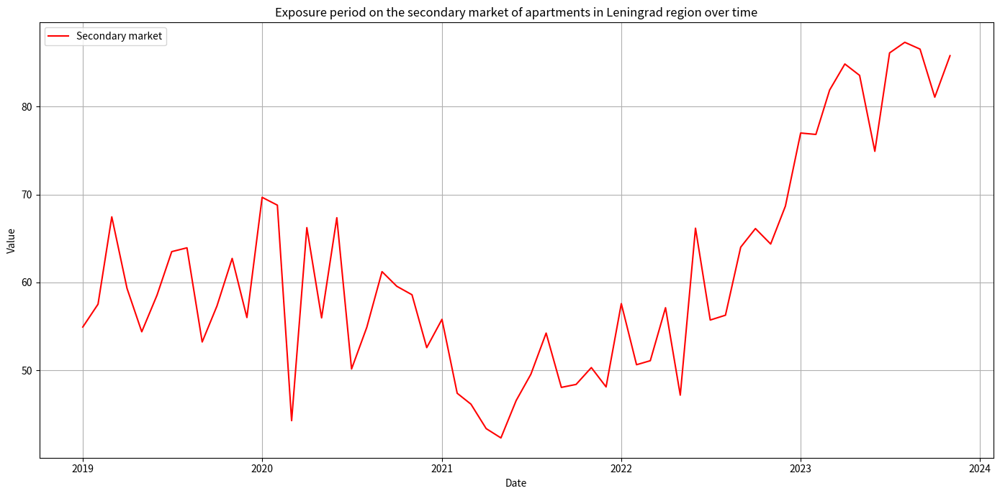

In [78]:
syv.plot_market_indicators(secondary_exposure_ts,
                           region_name='Ленинградская область, Leningrad Oblast, 列宁格勒州',
                           labels=exposure_labels, colors=['red'],
                           linestyles=['-'],
                           title=f'Exposure period on the secondary market of apartments in Leningrad region over time')

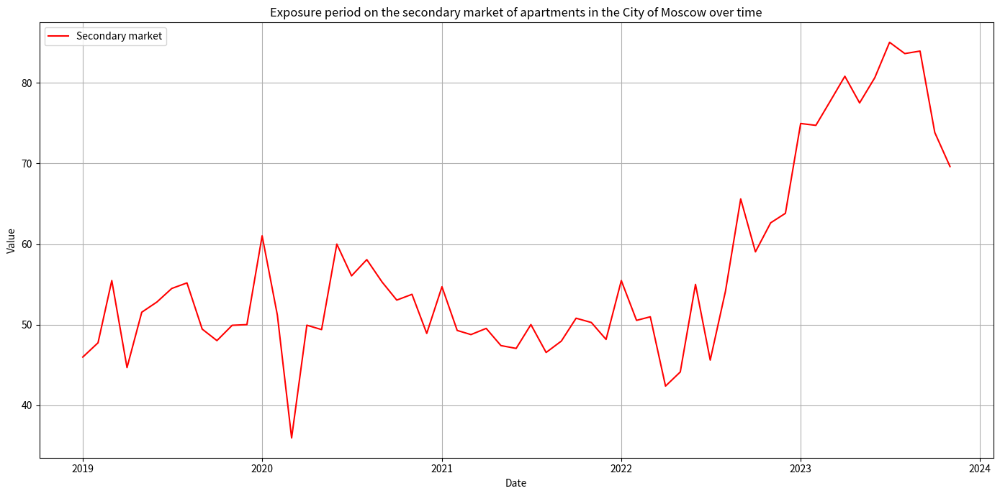

In [79]:
syv.plot_market_indicators(secondary_exposure_ts,
                           region_name='Москва, Moscow, 莫斯科',
                           labels=exposure_labels, colors=['red'],
                           linestyles=['-'],
                           title=f'Exposure period on the secondary market of apartments in the City of Moscow over time')

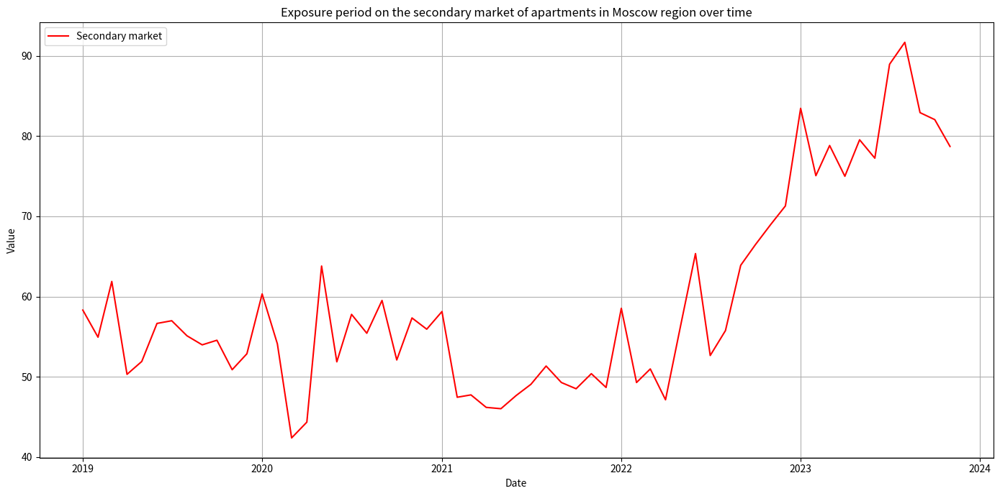

In [80]:
syv.plot_market_indicators(secondary_exposure_ts,
                           region_name='Московская область, Moscow Oblast, 莫斯科州',
                           labels=exposure_labels, colors=['red'],
                           linestyles=['-'],
                           title=f'Exposure period on the secondary market of apartments in Moscow region over time')

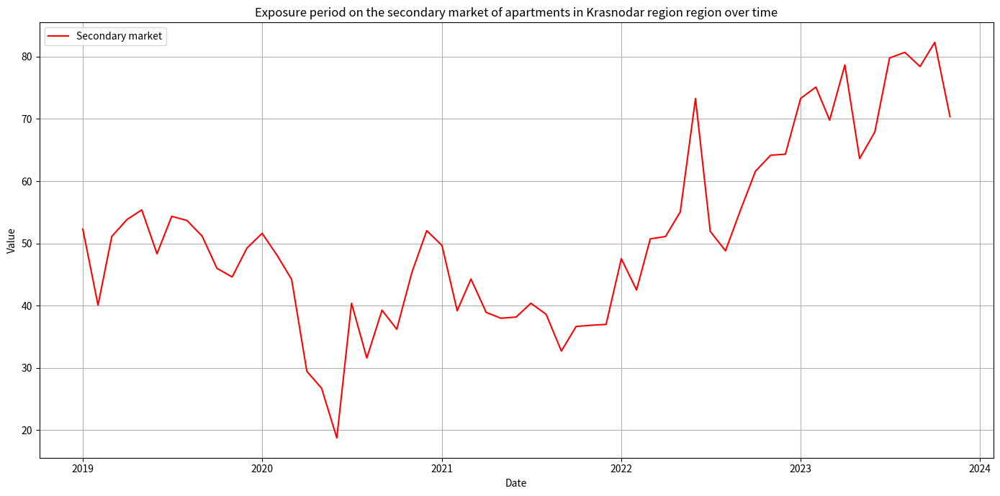

In [81]:
syv.plot_market_indicators(secondary_exposure_ts,
                           region_name='Краснодарский край, Krasnodar Krai, 克拉斯诺达尔边疆区',\
                           labels=exposure_labels, colors=['red'],\
                           linestyles=['-'],
                           title=f'Exposure period on the secondary market of apartments in Krasnodar region region over time')

所有地区的图表可在 [链接](https://web.tresorit.com/l/1SK8A#4Rzl6PPlQ6Ri07meLsayuA) 上查阅。

In [82]:
syv.save_exposure_plots(secondary_exposure_ts,\
                       column_name='value')

#### 5.2.4. 从买入价转为成交价时的折扣

五个主要地区从买入价到成交价的折扣率动态曲线图： 圣彼得堡、列宁格勒州、莫斯科、莫斯科州、克拉斯诺达尔边疆区。

In [83]:
discounts_labels = ['Primary Market',
                   'Secondary market']

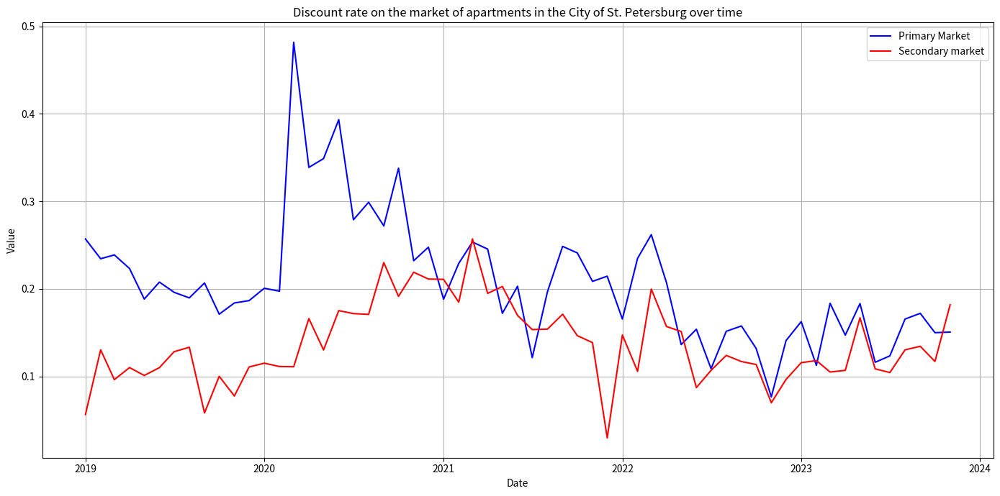

In [84]:
syv.plot_market_indicators(primary_discount_rates_ts, secondary_discount_rates_ts,
                           region_name='Санкт-Петербург, St. Petersburg, 圣彼得堡',
                           labels=discounts_labels, colors=['blue', 'red'], linestyles=['-', '-'],
                           title=f'Discount rate on the market of apartments in the City of St. Petersburg over time')

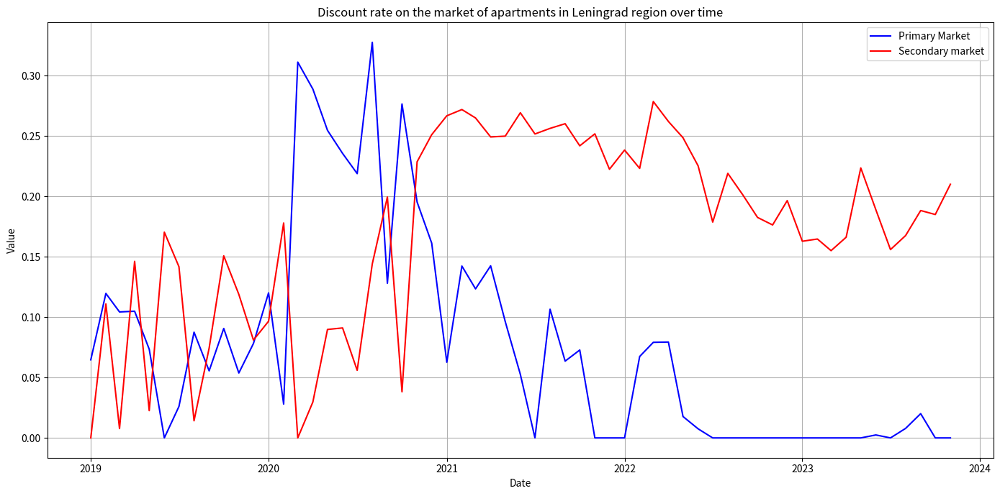

In [85]:
syv.plot_market_indicators(primary_discount_rates_ts, secondary_discount_rates_ts,
                           region_name='Ленинградская область, Leningrad Oblast, 列宁格勒州',\
                           labels=discounts_labels, colors=['blue', 'red'], linestyles=['-', '-'],\
                           title=f'Discount rate on the market of apartments in Leningrad region over time')

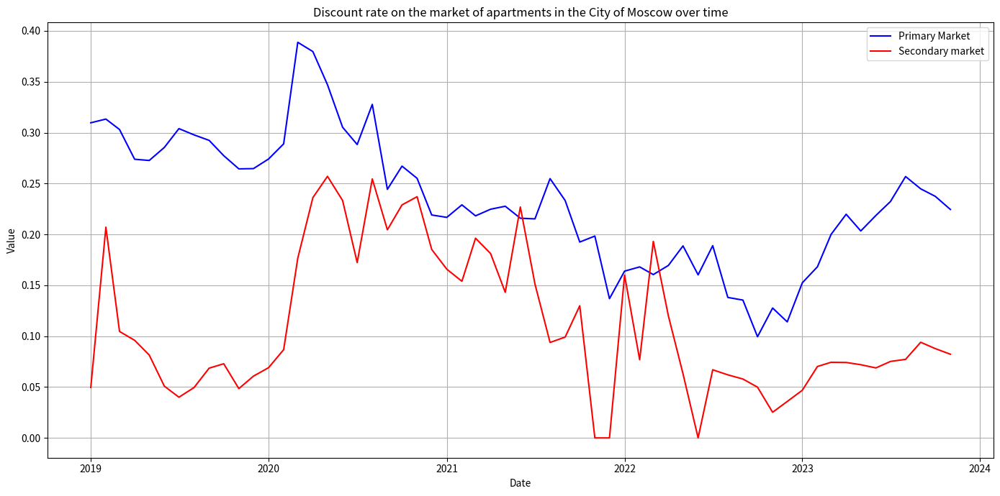

In [86]:
syv.plot_market_indicators(primary_discount_rates_ts, secondary_discount_rates_ts,
                           region_name='Москва, Moscow, 莫斯科',
                           labels=discounts_labels, colors=['blue', 'red'], linestyles=['-', '-'],
                           title=f'Discount rate on the market of apartments in the City of Moscow over time')

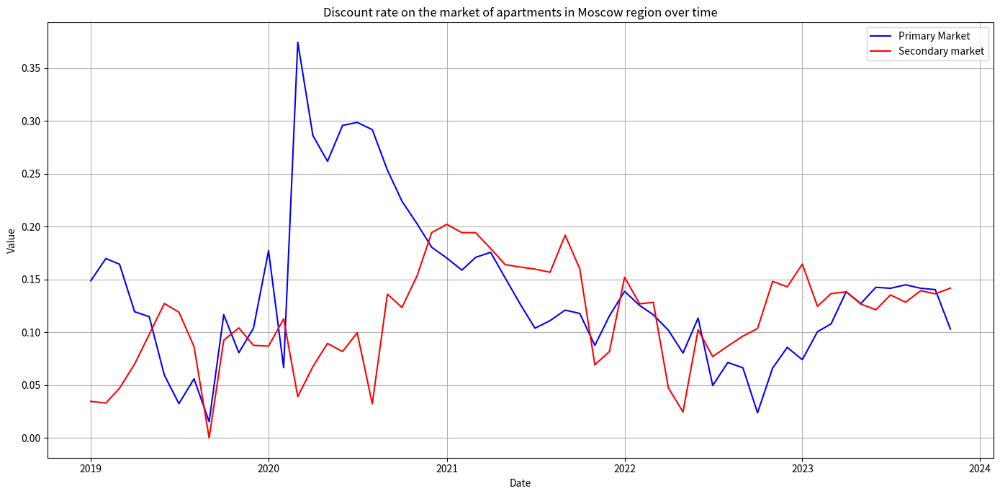

In [87]:
syv.plot_market_indicators(primary_discount_rates_ts, secondary_discount_rates_ts,
                           region_name='Московская область, Moscow Oblast, 莫斯科州',
                           labels=discounts_labels, colors=['blue', 'red'], linestyles=['-', '-'],
                           title=f'Discount rate on the market of apartments in Moscow region over time')

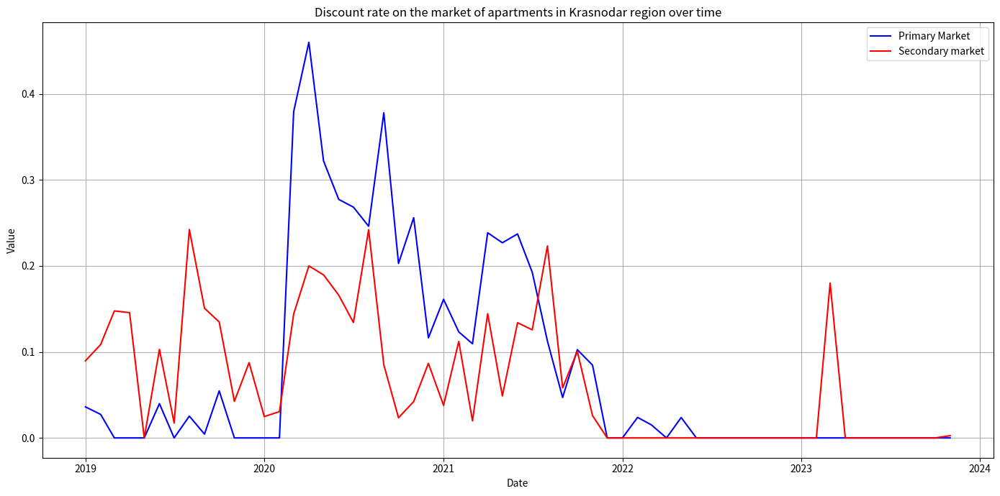

In [88]:
syv.plot_market_indicators(primary_discount_rates_ts, secondary_discount_rates_ts,
                           region_name='Краснодарский край, Krasnodar Krai, 克拉斯诺达尔边疆区',
                           labels=discounts_labels, colors=['blue', 'red'], linestyles=['-', '-'],
                           title=f'Discount rate on the market of apartments in Krasnodar region over time')

所有地区的图表可在 [链接](https://web.tresorit.com/l/1SK8A#4Rzl6PPlQ6Ri07meLsayuA) 上查阅。

In [89]:
syv.save_discounts_plots(primary_discount_rates_ts,
                         secondary_discount_rates_ts,
                         column_name='value')

#### 5.2.5. 一级和二级市场指标的比率

让我们绘制五个主要地区一级市场和二级市场的价格、交易量和折扣指标的比率图： 圣彼得堡、列宁格勒州、莫斯科、莫斯科州、克拉斯诺达尔边疆区。在计算比率指标时，分母使用的是一级市场的数据。因此，指标值（例如 1.21）意味着一级市场指标值比二级市场类似指标值高 0.21。

In [90]:
ratios_labels_1 = ['Deals',
                  'Offers']
ratios_labels_2 = ['Offers']
ratios_labels_3 = ['Mean deal price/Median offer price']

##### 5.2.5.1. 价格指标比率

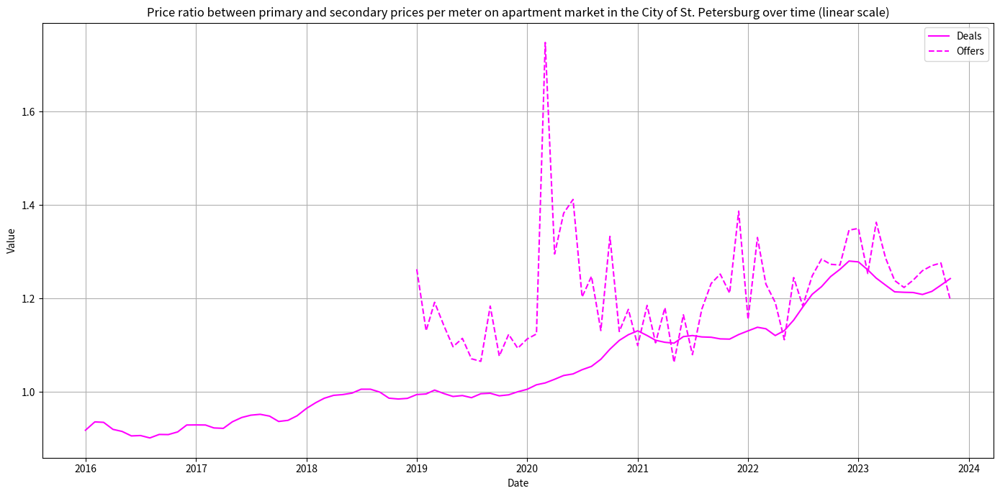

In [91]:
syv.plot_market_indicators(deals_ratios_ts, offers_ratios_ts,
                           region_name='Санкт-Петербург, St. Petersburg, 圣彼得堡',
                           labels=ratios_labels_1, colors=['magenta', 'magenta'], linestyles=['-', '--'],
                           title=f'Price ratio between primary and secondary prices per meter on apartment market in the City of St. Petersburg over time (linear scale)')

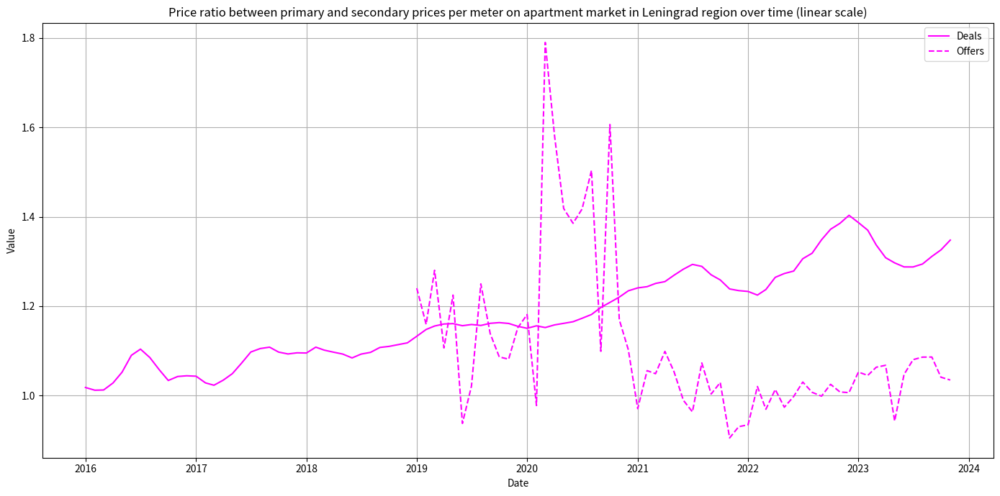

In [92]:
syv.plot_market_indicators(deals_ratios_ts, offers_ratios_ts,
                           region_name='Ленинградская область, Leningrad Oblast, 列宁格勒州',
                           labels=ratios_labels_1, colors=['magenta', 'magenta'], linestyles=['-', '--'],
                           title=f'Price ratio between primary and secondary prices per meter on apartment market in Leningrad region over time (linear scale)')

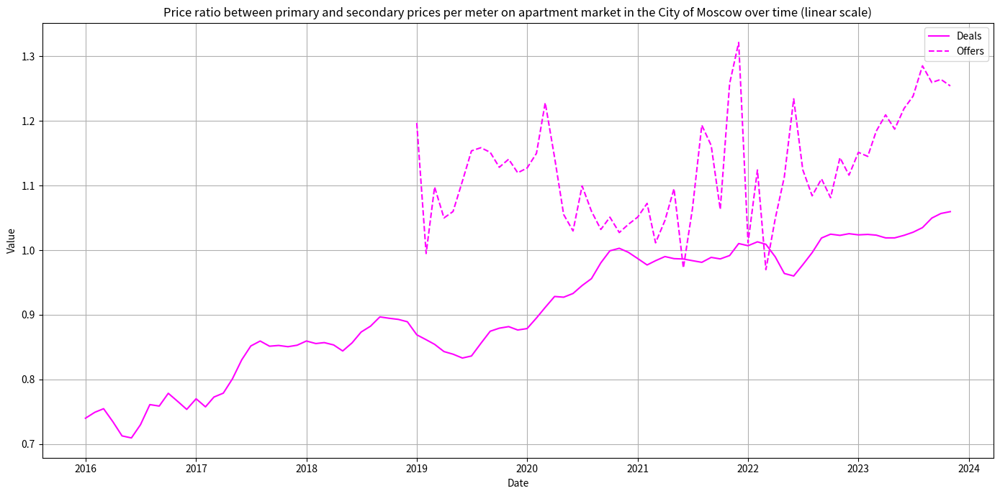

In [93]:
syv.plot_market_indicators(deals_ratios_ts, offers_ratios_ts,
                           region_name='Москва, Moscow, 莫斯科',
                           labels=ratios_labels_1, colors=['magenta', 'magenta'], linestyles=['-', '--'],
                           title=f'Price ratio between primary and secondary prices per meter on apartment market in the City of Moscow over time (linear scale)')

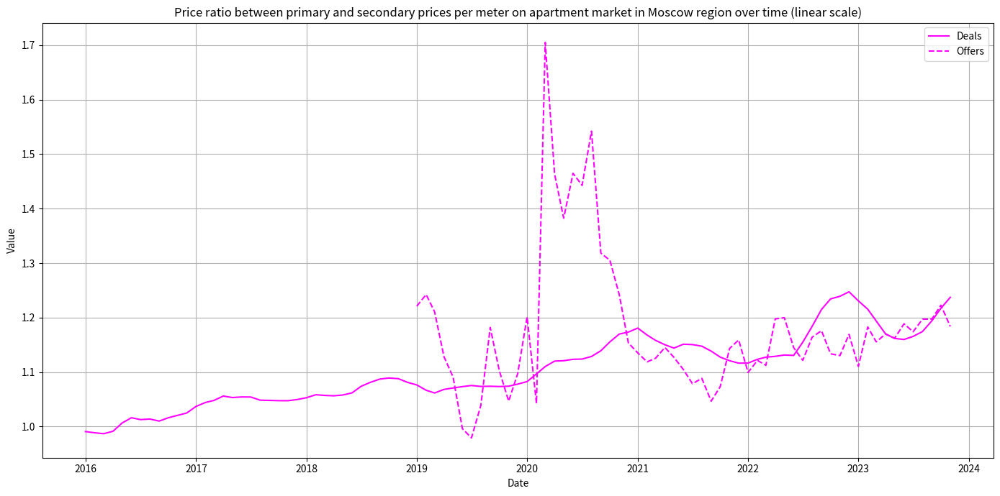

In [94]:
syv.plot_market_indicators(deals_ratios_ts, offers_ratios_ts,
                           region_name='Московская область, Moscow Oblast, 莫斯科州',
                           labels=ratios_labels_1, colors=['magenta', 'magenta'], linestyles=['-', '--'],
                           title=f'Price ratio between primary and secondary prices per meter on apartment market in Moscow region over time (linear scale)')

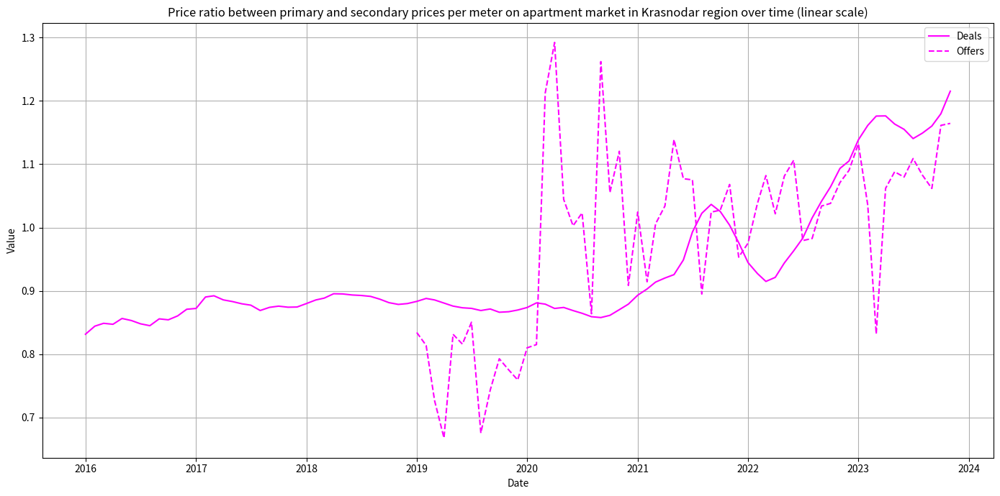

In [95]:
syv.plot_market_indicators(deals_ratios_ts, offers_ratios_ts,
                           region_name='Краснодарский край, Krasnodar Krai, 克拉斯诺达尔边疆区',
                           labels=ratios_labels_1, colors=['magenta', 'magenta'], linestyles=['-', '--'],
                           title=f'Price ratio between primary and secondary prices per meter on apartment market in Krasnodar region over time (linear scale)')

所有地区的图表可在 [链接](https://web.tresorit.com/l/1SK8A#4Rzl6PPlQ6Ri07meLsayuA) 上查阅。

In [96]:
syv.save_price_ratios_plots(deals_ratios_ts,
                         offers_ratios_ts,
                         column_name='value')

##### 5.2.5.2. 数量指标比率

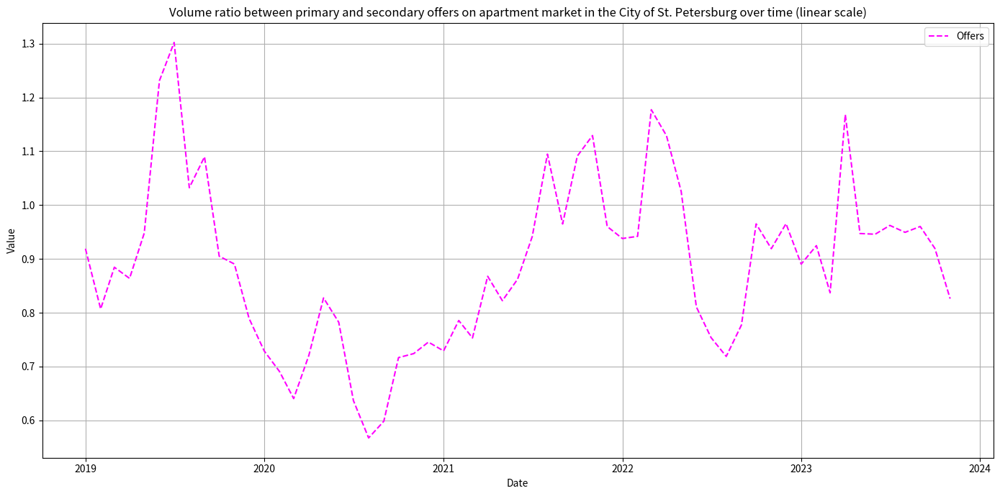

In [97]:
syv.plot_market_indicators(volumes_ratios_ts,
                           region_name='Санкт-Петербург, St. Petersburg, 圣彼得堡',
                           labels=ratios_labels_2, colors=['magenta'], linestyles=['--'],
                           title=f'Volume ratio between primary and secondary offers on apartment market in the City of St. Petersburg over time (linear scale)')

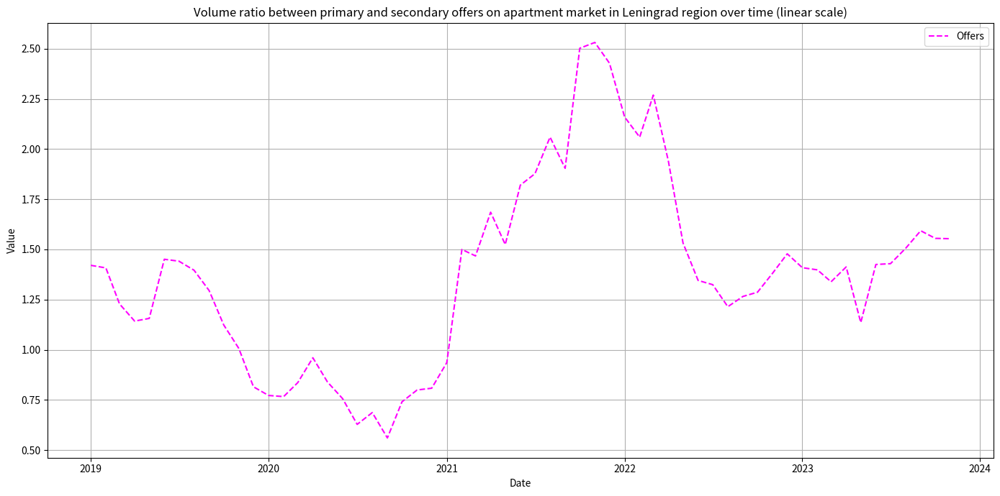

In [98]:
syv.plot_market_indicators(volumes_ratios_ts,
                           region_name='Ленинградская область, Leningrad Oblast, 列宁格勒州',
                           labels=ratios_labels_2, colors=['magenta'], linestyles=['--'],
                           title=f'Volume ratio between primary and secondary offers on apartment market in Leningrad region over time (linear scale)')

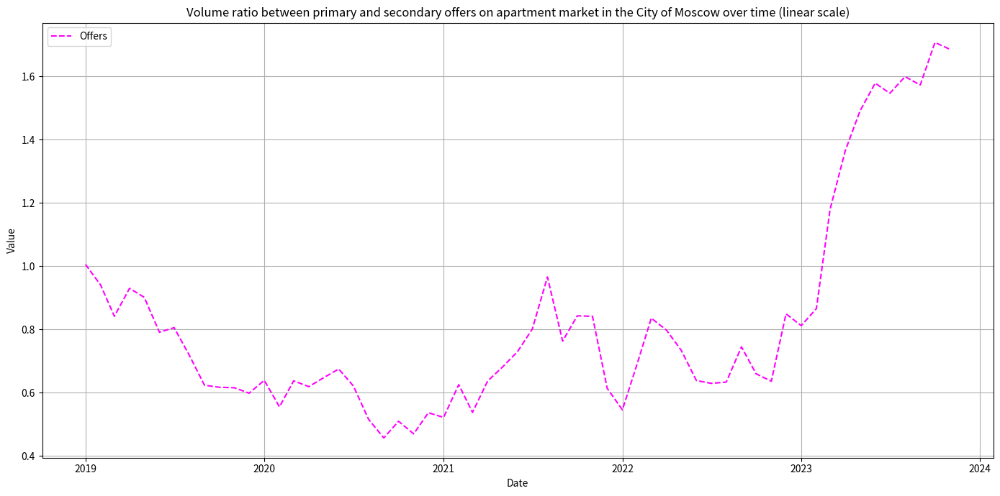

In [99]:
syv.plot_market_indicators(volumes_ratios_ts,
                           region_name='Москва, Moscow, 莫斯科',
                           labels=ratios_labels_2, colors=['magenta'], linestyles=['--'],
                           title=f'Volume ratio between primary and secondary offers on apartment market in the City of Moscow over time (linear scale)')

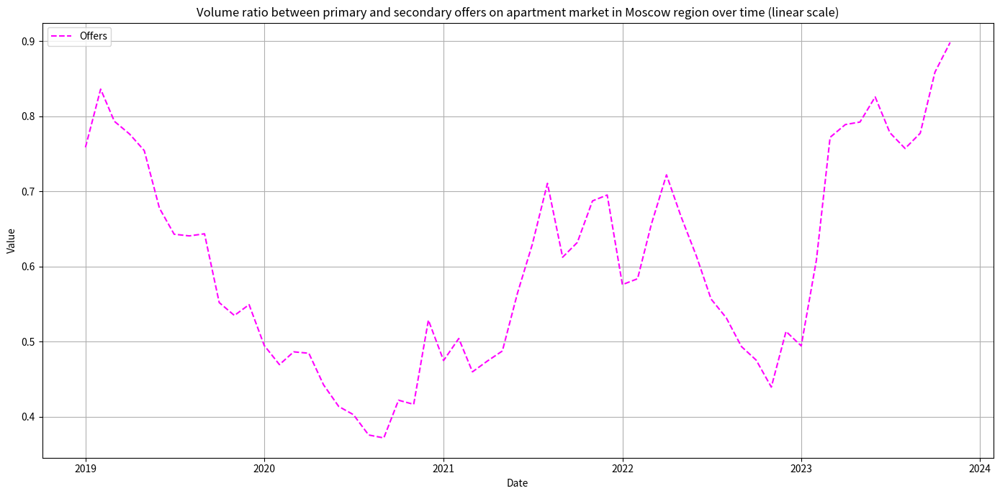

In [100]:
syv.plot_market_indicators(volumes_ratios_ts,
                           region_name='Московская область, Moscow Oblast, 莫斯科州',
                           labels=ratios_labels_2, colors=['magenta'], linestyles=['--'],
                           title=f'Volume ratio between primary and secondary offers on apartment market in Moscow region over time (linear scale)')

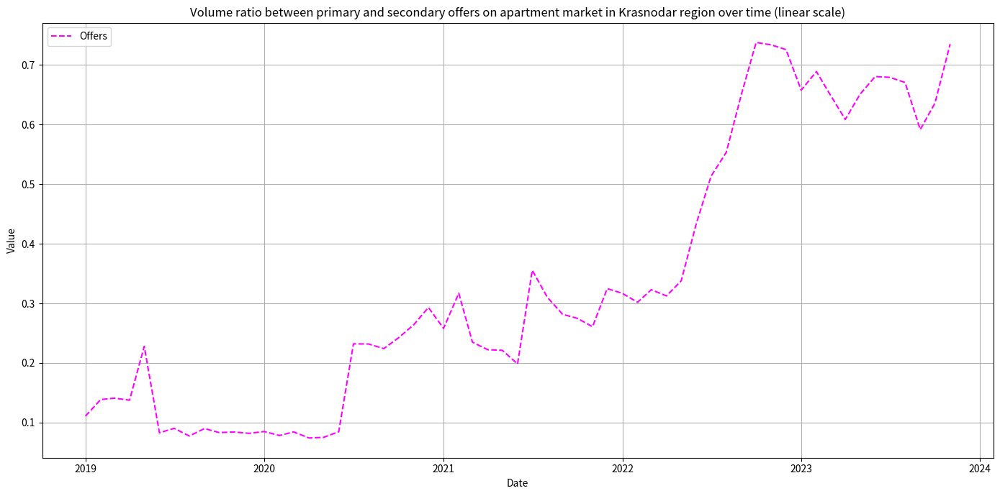

In [101]:
syv.plot_market_indicators(volumes_ratios_ts,
                           region_name='Краснодарский край, Krasnodar Krai, 克拉斯诺达尔边疆区',
                           labels=ratios_labels_2, colors=['magenta'], linestyles=['--'],
                           title=f'Volume ratio between primary and secondary offers on apartment market in Krasnodar region over time (linear scale)')

所有地区的图表可在 [链接](https://web.tresorit.com/l/1SK8A#4Rzl6PPlQ6Ri07meLsayuA) 上查阅。

In [102]:
syv.save_volume_ratios_plots(volumes_ratios_ts,
                           column_name='value')

##### 5.2.5.3. 折扣指标比率

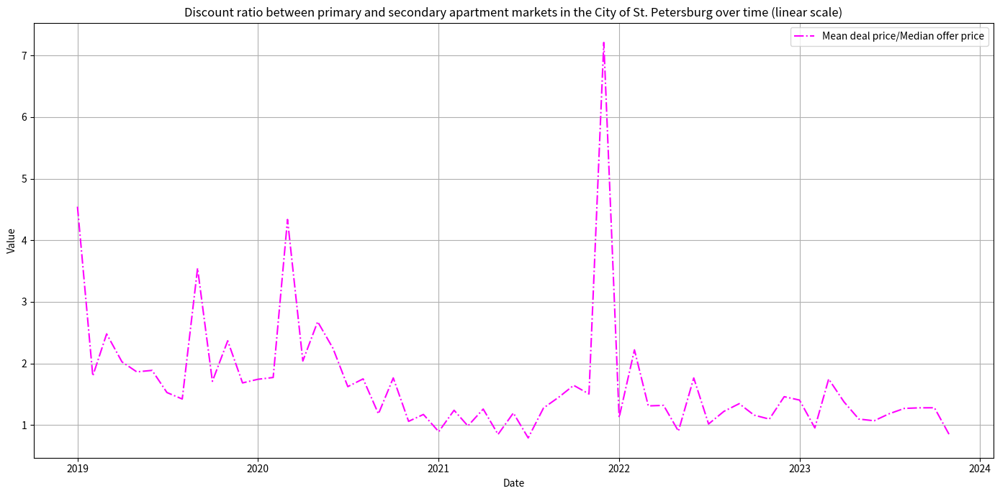

In [103]:
syv.plot_market_indicators(discounts_ratios_ts,
                           region_name='Санкт-Петербург, St. Petersburg, 圣彼得堡',
                           labels=ratios_labels_3, colors=['magenta'], linestyles=['-.'],
                           title=f'Discount ratio between primary and secondary apartment markets in the City of St. Petersburg over time (linear scale)')

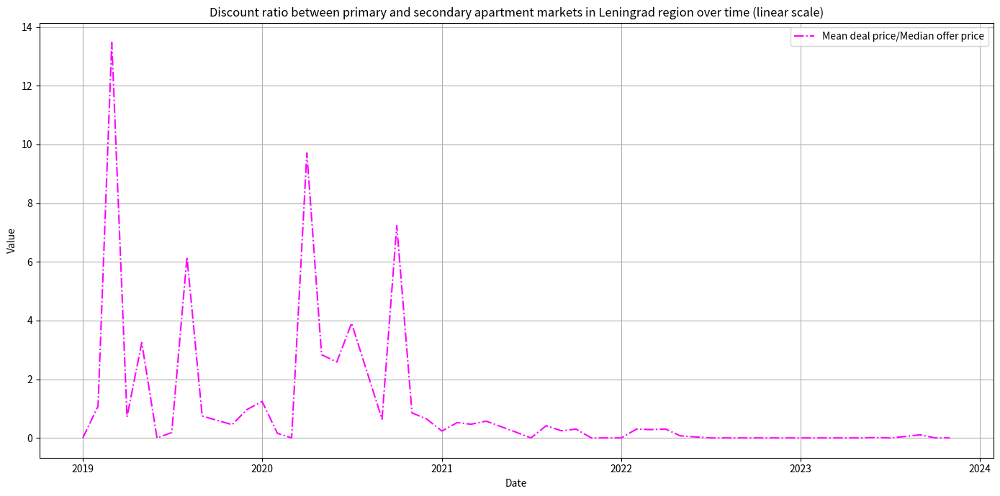

In [104]:
syv.plot_market_indicators(discounts_ratios_ts,
                           region_name='Ленинградская область, Leningrad Oblast, 列宁格勒州',
                           labels=ratios_labels_3, colors=['magenta'], linestyles=['-.'],
                           title=f'Discount ratio between primary and secondary apartment markets in Leningrad region over time (linear scale)')

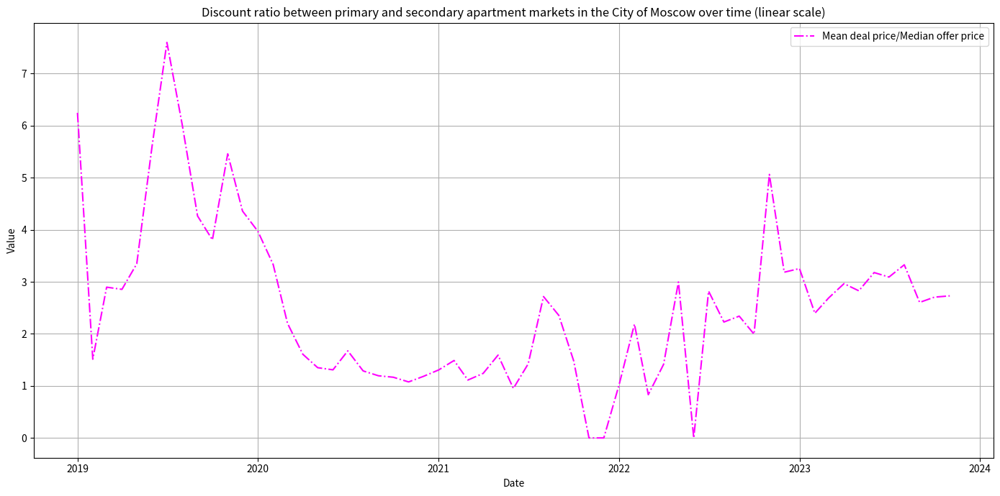

In [105]:
syv.plot_market_indicators(discounts_ratios_ts,
                           region_name='Москва, Moscow, 莫斯科',
                           labels=ratios_labels_3, colors=['magenta'], linestyles=['-.'],
                           title=f'Discount ratio between primary and secondary apartment markets in the City of Moscow over time (linear scale)')

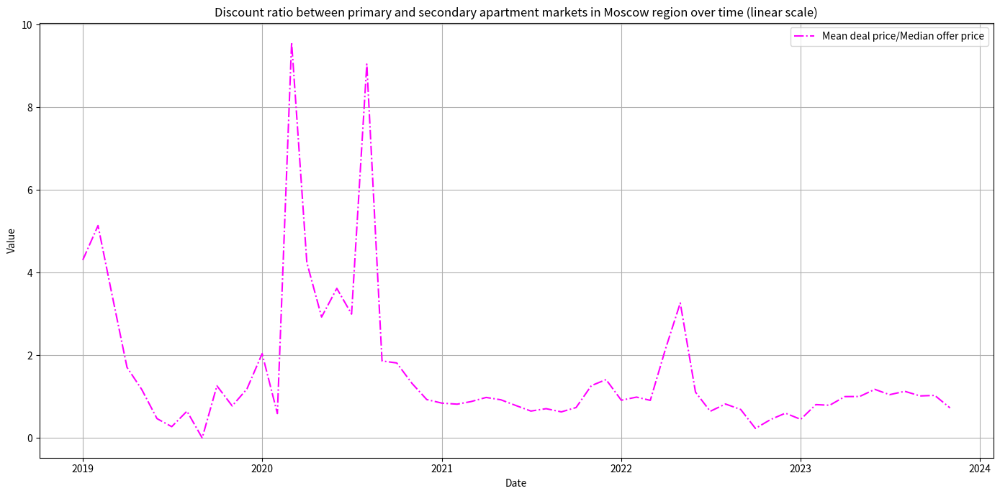

In [106]:
syv.plot_market_indicators(discounts_ratios_ts,
                           region_name='Московская область, Moscow Oblast, 莫斯科州',
                           labels=ratios_labels_3, colors=['magenta'], linestyles=['-.'],
                           title=f'Discount ratio between primary and secondary apartment markets in Moscow region over time (linear scale)')

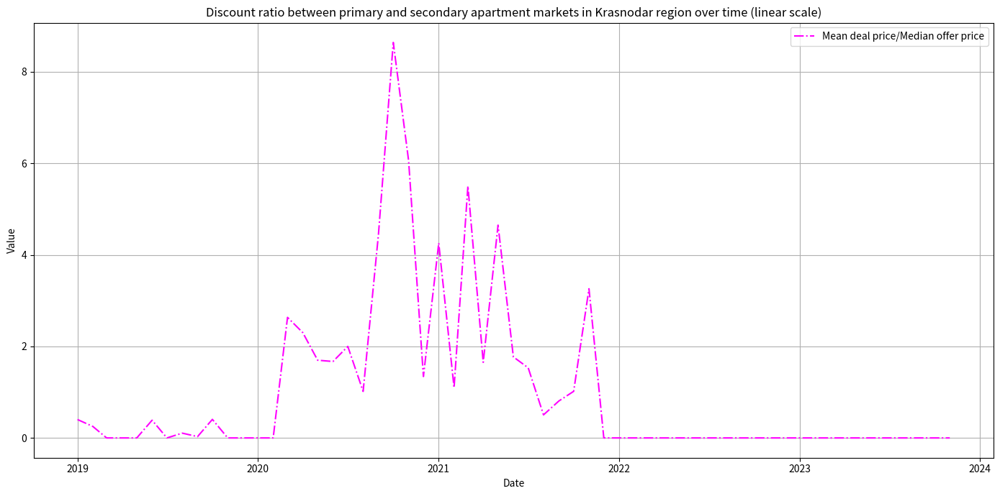

In [107]:
syv.plot_market_indicators(discounts_ratios_ts,
                           region_name='Краснодарский край, Krasnodar Krai, 克拉斯诺达尔边疆区',
                           labels=ratios_labels_3, colors=['magenta'], linestyles=['-.'],
                           title=f'Discount ratio between primary and secondary apartment markets in Krasnodar region over time (linear scale)')

所有地区的图表可在 [链接](https://web.tresorit.com/l/1SK8A#4Rzl6PPlQ6Ri07meLsayuA) 上查阅。

In [108]:
syv.save_discount_ratios_plots(discounts_ratios_ts,\
                           column_name='value')

#### 5.2.6. 一级市场和二级市场指标之间的差距

让我们描绘一下五个主要地区一级市场和二级市场的价格、交易量和折扣指标之间的差距： 圣彼得堡、列宁格勒州、莫斯科、莫斯科州、克拉斯诺达尔州。在计算比率指标时，一级市场的数据按递减顺序使用。因此，指标值大于零，意味着一级市场指标值大于二级市场的相同指标值。

In [109]:
gaps_labels_1 = ['Deals',
                  'Offers']
gaps_labels_2 = ['Offers']
gaps_labels_3 = ['Mean deal price - Median offer price']

##### 5.2.6.1. 价格指标之间的差距

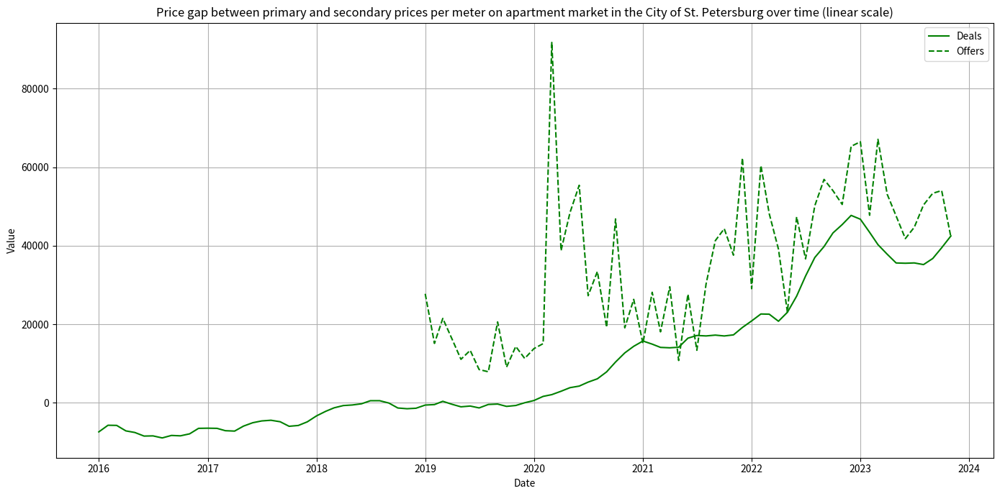

In [110]:
syv.plot_market_indicators(deals_gaps_ts, offers_gaps_ts,
                           region_name='Санкт-Петербург, St. Petersburg, 圣彼得堡',
                           labels=gaps_labels_1, colors=['green', 'green'], linestyles=['-', '--'],
                           title=f'Price gap between primary and secondary prices per meter on apartment market in the City of St. Petersburg over time (linear scale)')

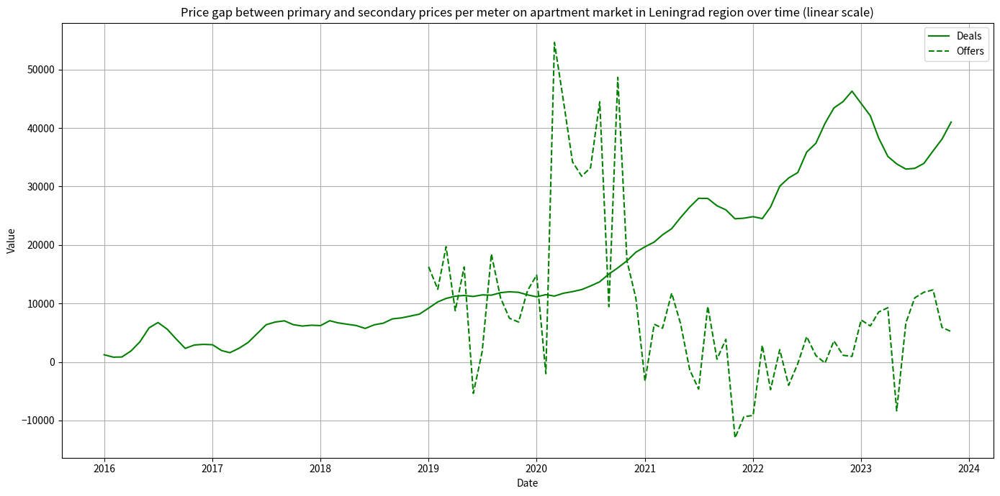

In [111]:
syv.plot_market_indicators(deals_gaps_ts, offers_gaps_ts,
                           region_name='Ленинградская область, Leningrad Oblast, 列宁格勒州',
                           labels=gaps_labels_1, colors=['green', 'green'], linestyles=['-', '--'],
                           title=f'Price gap between primary and secondary prices per meter on apartment market in Leningrad region over time (linear scale)')

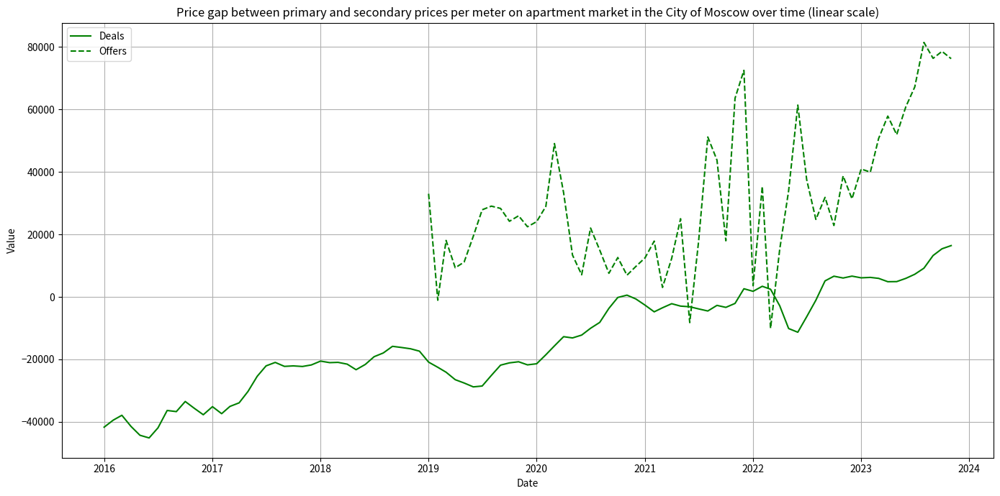

In [112]:
syv.plot_market_indicators(deals_gaps_ts, offers_gaps_ts,
                           region_name='Москва, Moscow, 莫斯科',
                           labels=gaps_labels_1, colors=['green', 'green'], linestyles=['-', '--'],
                           title=f'Price gap between primary and secondary prices per meter on apartment market in the City of Moscow over time (linear scale)')

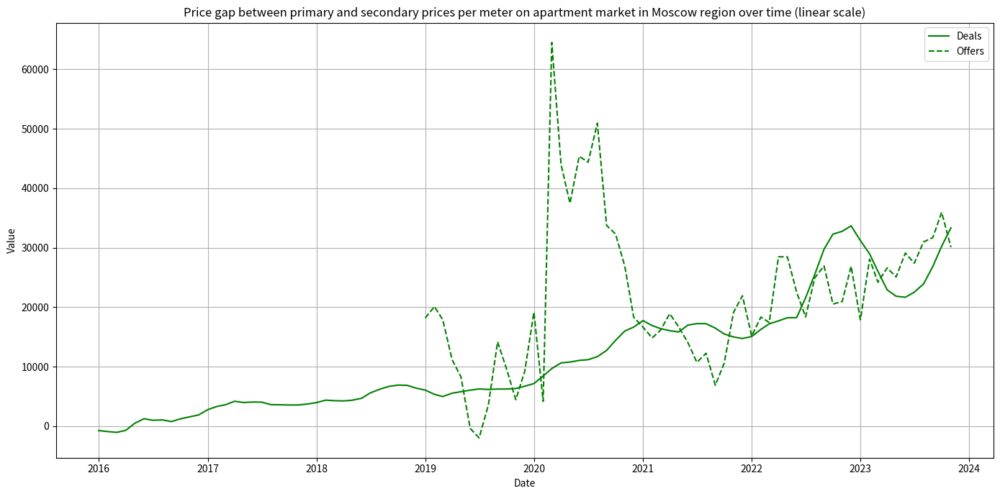

In [113]:
syv.plot_market_indicators(deals_gaps_ts, offers_gaps_ts,
                           region_name='Московская область, Moscow Oblast, 莫斯科州',
                           labels=gaps_labels_1, colors=['green', 'green'], linestyles=['-', '--'],
                           title=f'Price gap between primary and secondary prices per meter on apartment market in Moscow region over time (linear scale)')

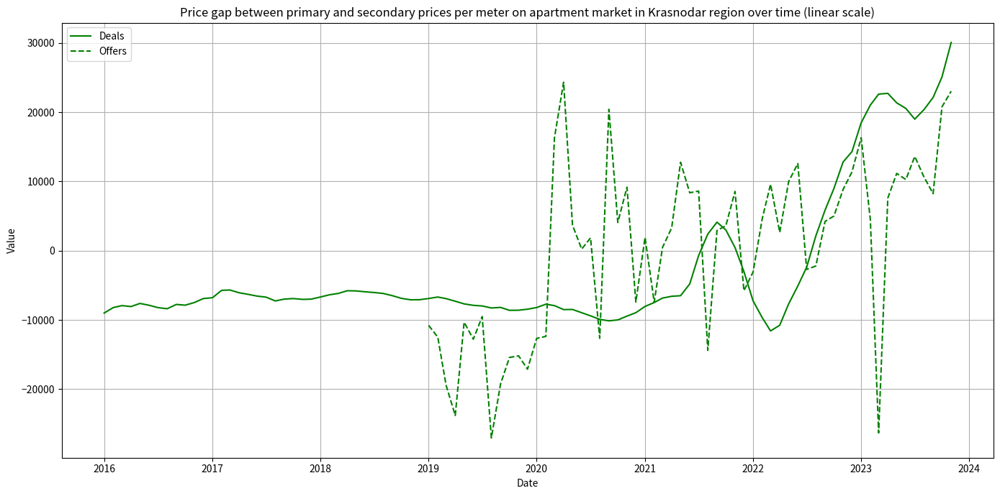

In [114]:
syv.plot_market_indicators(deals_gaps_ts, offers_gaps_ts,
                           region_name='Краснодарский край, Krasnodar Krai, 克拉斯诺达尔边疆区',
                           labels=gaps_labels_1, colors=['green', 'green'], linestyles=['-', '--'],
                           title=f'Price gap between primary and secondary prices per meter on apartment market in Krasnodar region over time (linear scale)')

所有地区的图表可在 [链接](https://web.tresorit.com/l/1SK8A#4Rzl6PPlQ6Ri07meLsayuA) 上查阅。

In [115]:
syv.save_price_gaps_plots(deals_gaps_ts,\
                         offers_gaps_ts,\
                         column_name='value')

##### 5.2.6.2. 数量指标之间的差距

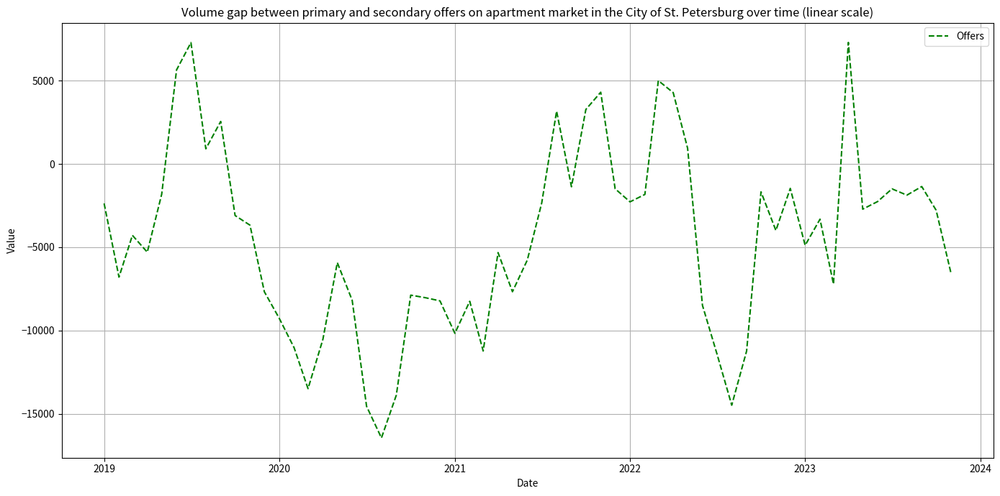

In [116]:
syv.plot_market_indicators(volumes_gaps_ts,
                           region_name='Санкт-Петербург, St. Petersburg, 圣彼得堡',
                           labels=gaps_labels_2, colors=['green'], linestyles=['--'],
                           title=f'Volume gap between primary and secondary offers on apartment market in the City of St. Petersburg over time (linear scale)')

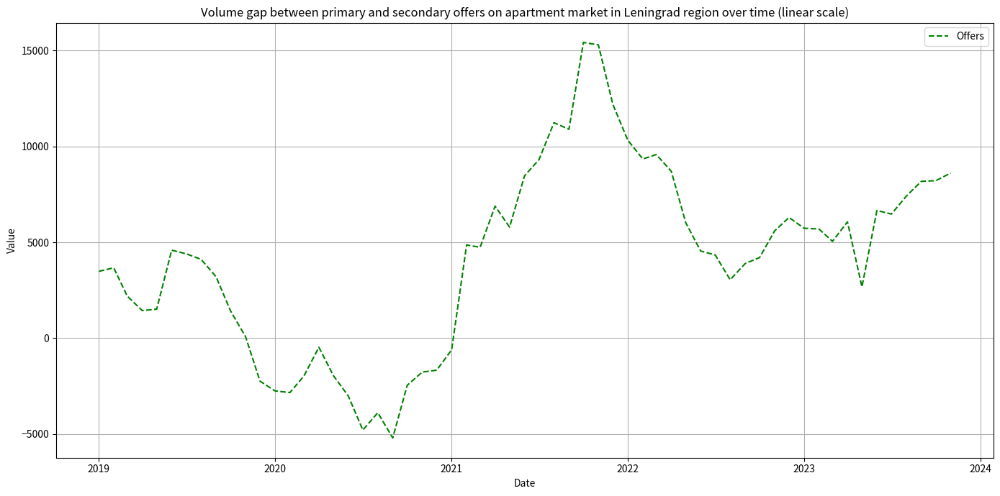

In [117]:
syv.plot_market_indicators(volumes_gaps_ts,
                           region_name='Ленинградская область, Leningrad Oblast, 列宁格勒州',
                           labels=gaps_labels_2, colors=['green'], linestyles=['--'],
                           title=f'Volume gap between primary and secondary offers on apartment market in Leningrad region over time (linear scale)')

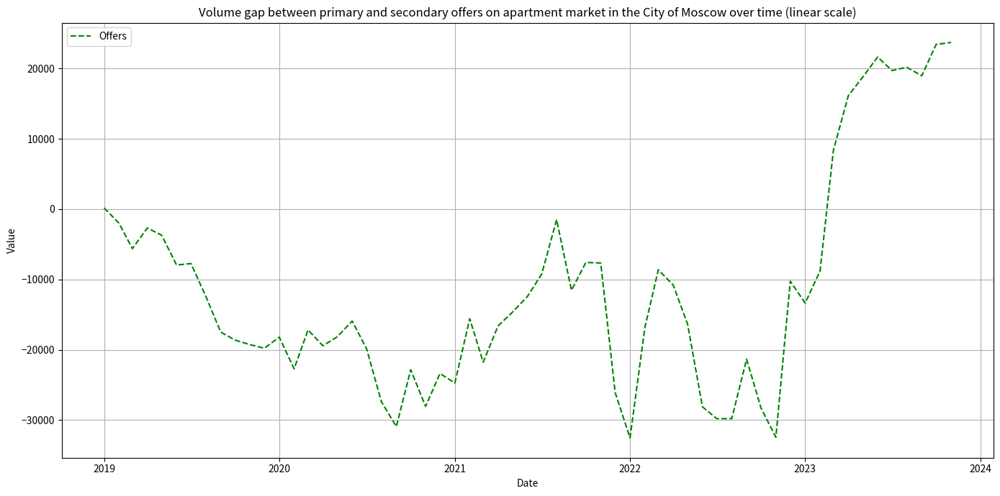

In [118]:
syv.plot_market_indicators(volumes_gaps_ts,
                           region_name='Москва, Moscow, 莫斯科',
                           labels=gaps_labels_2, colors=['green'], linestyles=['--'],
                           title=f'Volume gap between primary and secondary offers on apartment market in the City of Moscow over time (linear scale)')

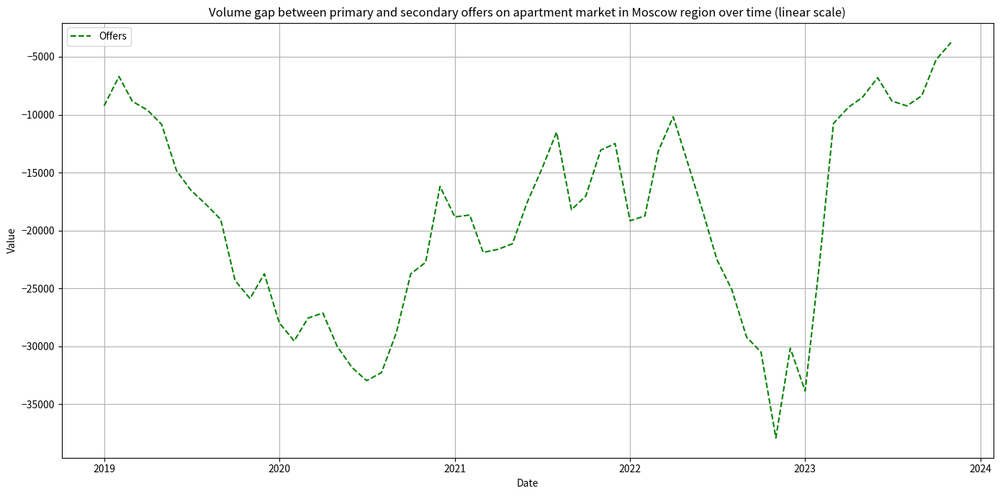

In [119]:
syv.plot_market_indicators(volumes_gaps_ts,
                           region_name='Московская область, Moscow Oblast, 莫斯科州',
                           labels=gaps_labels_2, colors=['green'], linestyles=['--'],
                           title=f'Volume gap between primary and secondary offers on apartment market in Moscow region over time (linear scale)')

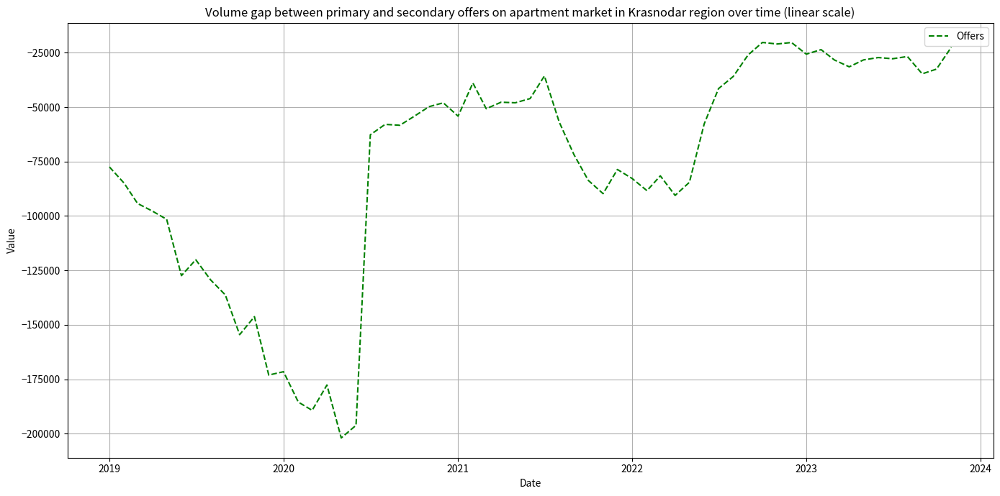

In [120]:
syv.plot_market_indicators(volumes_gaps_ts,
                           region_name='Краснодарский край, Krasnodar Krai, 克拉斯诺达尔边疆区',
                           labels=gaps_labels_2, colors=['green'], linestyles=['--'],
                           title=f'Volume gap between primary and secondary offers on apartment market in Krasnodar region over time (linear scale)')

所有地区的图表可在 [链接](https://web.tresorit.com/l/1SK8A#4Rzl6PPlQ6Ri07meLsayuA) 上查阅。

In [121]:
syv.save_volume_gaps_plots(volumes_gaps_ts,
                          column_name='value')

##### 5.2.6.3. 折扣指标之间的差距

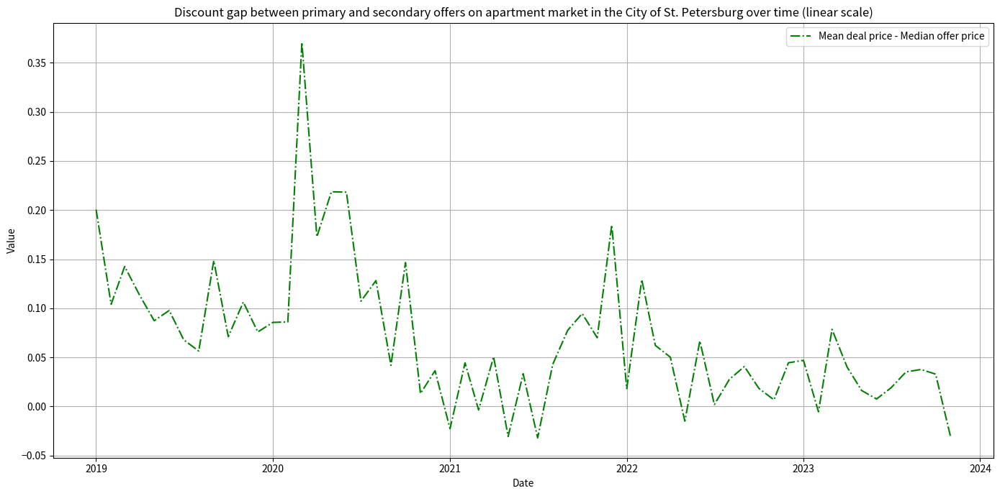

In [122]:
syv.plot_market_indicators(discounts_gaps_ts,
                           region_name='Санкт-Петербург, St. Petersburg, 圣彼得堡',
                           labels=gaps_labels_3, colors=['green'], linestyles=['-.'],
                           title=f'Discount gap between primary and secondary offers on apartment market in the City of St. Petersburg over time (linear scale)')

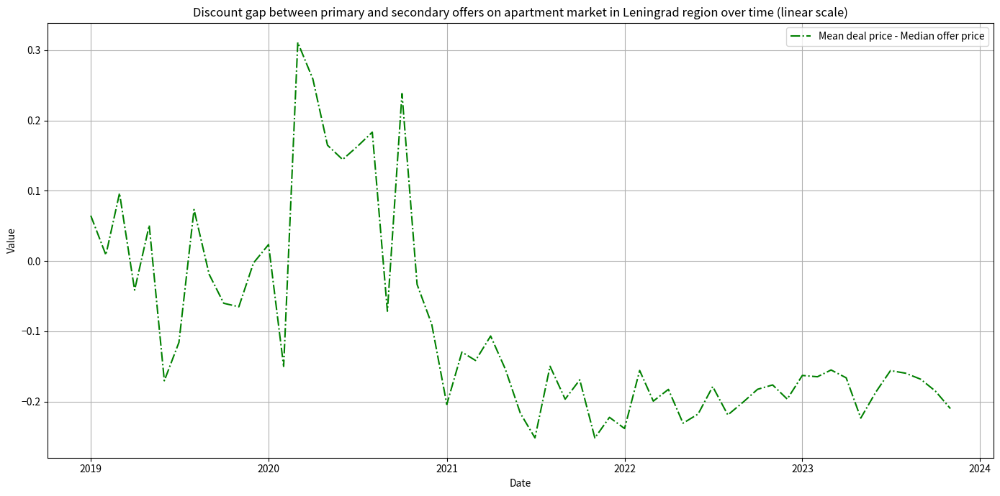

In [123]:
syv.plot_market_indicators(discounts_gaps_ts,
                           region_name='Ленинградская область, Leningrad Oblast, 列宁格勒州',
                           labels=gaps_labels_3, colors=['green'], linestyles=['-.'],
                           title=f'Discount gap between primary and secondary offers on apartment market in Leningrad region over time (linear scale)')

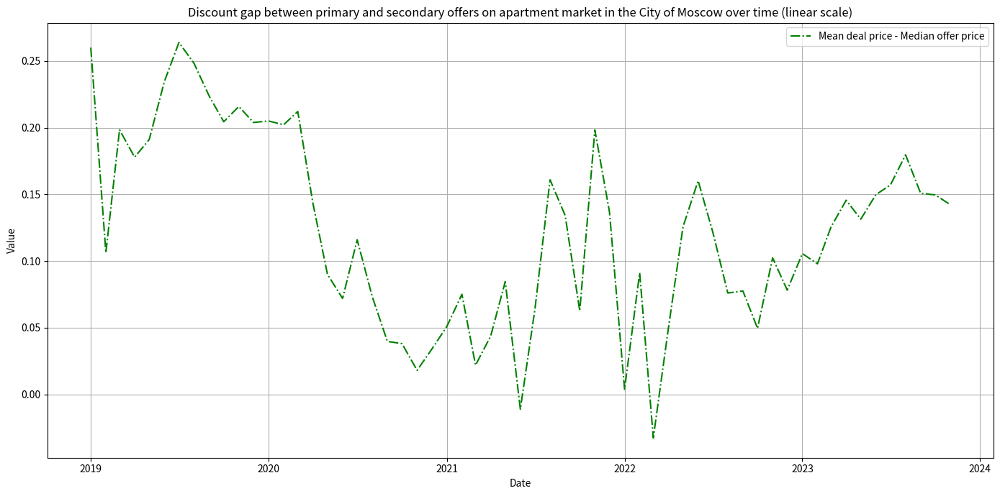

In [124]:
syv.plot_market_indicators(discounts_gaps_ts,
                           region_name='Москва, Moscow, 莫斯科',
                           labels=gaps_labels_3, colors=['green'], linestyles=['-.'],
                           title=f'Discount gap between primary and secondary offers on apartment market in the City of Moscow over time (linear scale)')

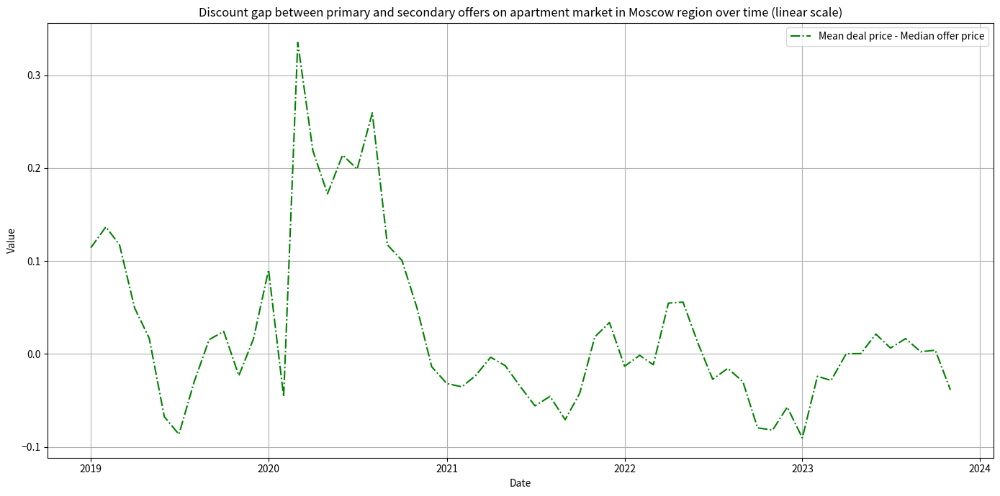

In [125]:
syv.plot_market_indicators(discounts_gaps_ts,
                           region_name='Московская область, Moscow Oblast, 莫斯科州',
                           labels=gaps_labels_3, colors=['green'], linestyles=['-.'],
                           title=f'Discount gap between primary and secondary offers on apartment market in Moscow region over time (linear scale)')

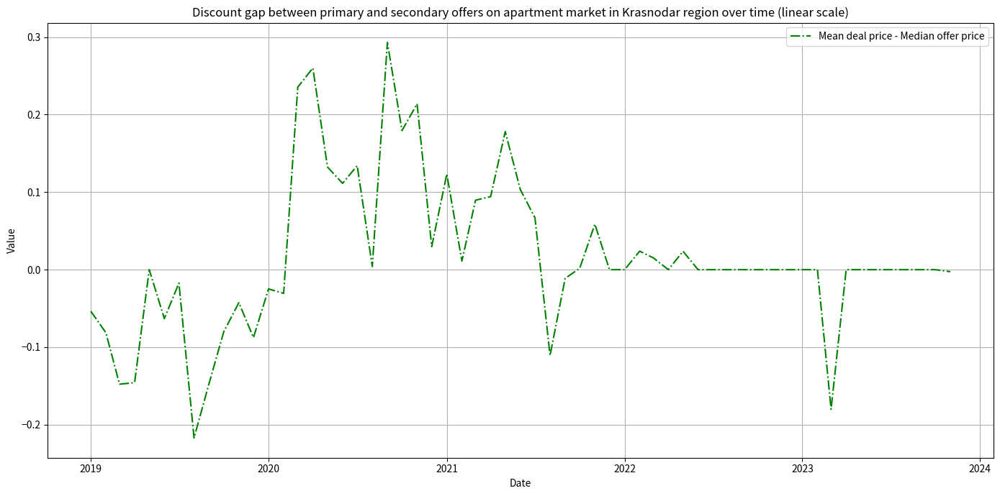

In [126]:
syv.plot_market_indicators(discounts_gaps_ts,
                           region_name='Краснодарский край, Krasnodar Krai, 克拉斯诺达尔边疆区',
                           labels=gaps_labels_3, colors=['green'], linestyles=['-.'],
                           title=f'Discount gap between primary and secondary offers on apartment market in Krasnodar region over time (linear scale)')

所有地区的图表可在 [链接](https://web.tresorit.com/l/1SK8A#4Rzl6PPlQ6Ri07meLsayuA) 上查阅。

In [127]:
syv.save_discount_gaps_plots(discounts_gaps_ts,\
                            column_name='value')

### 5.3. 地区不平等动态分析

一级市场平均成交价和中位买入价的基尼系数动态图。

In [128]:
labels_gini_ts_1 = ['Deals', 'Offers']
labels_gini_ts_2 = ['Primary market', 'Secondary market']
labels_gini_ts_3 = ['Secondary market']

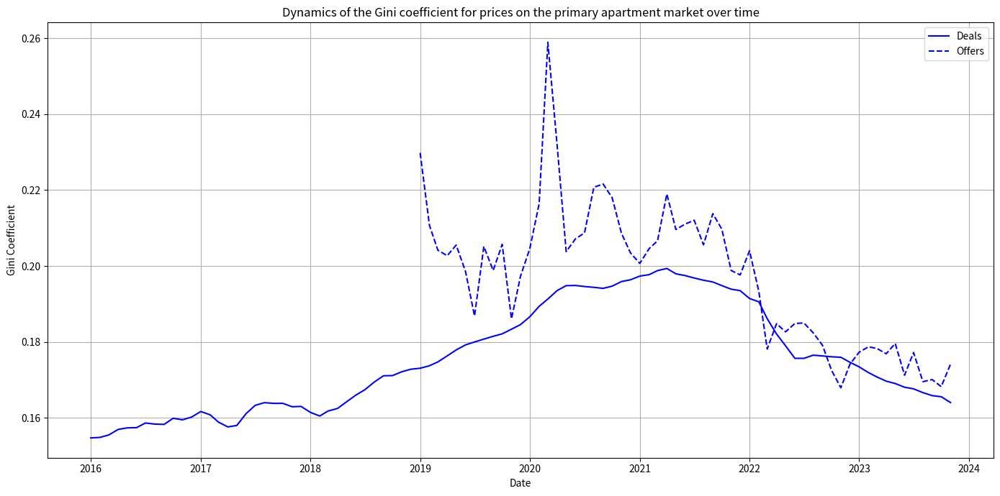

In [129]:
syv.plot_gini_ts(primary_deals_gini_ts, primary_offers_gini_ts,
                           labels=labels_gini_ts_1, colors=['blue', 'blue'], linestyles=['-', '--'],
                           plot_title=f'Dynamics of the Gini coefficient for prices on the primary apartment market over time')

二级市场平均成交价和出价中位数的基尼系数动态图。

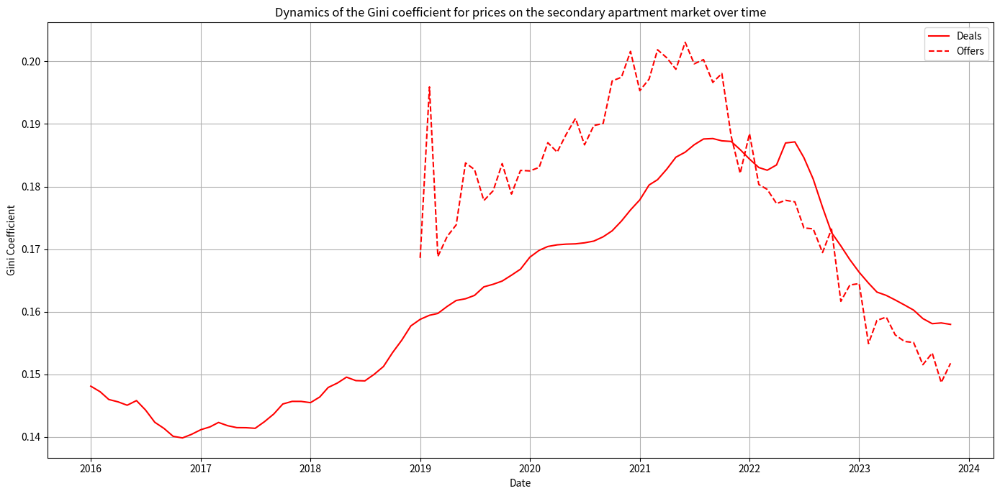

In [130]:
syv.plot_gini_ts(secondary_deals_gini_ts, secondary_offers_gini_ts,
                           labels=labels_gini_ts_1, colors=['red', 'red'], linestyles=['-', '--'],
                           plot_title=f'Dynamics of the Gini coefficient for prices on the secondary apartment market over time')

一级市场和二级市场交易量的基尼系数动态图。

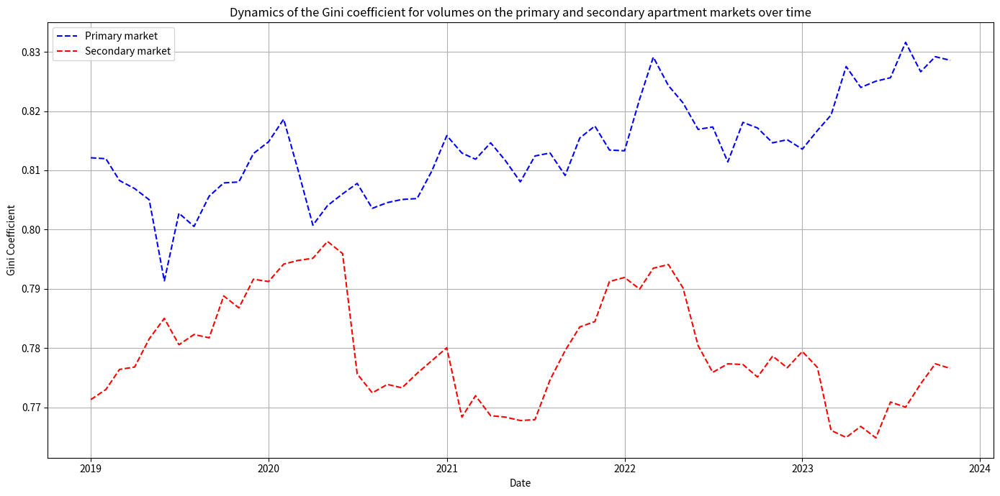

In [131]:
syv.plot_gini_ts(primary_volumes_gini_ts, secondary_volumes_gini_ts,
                           labels=labels_gini_ts_2, colors=['blue', 'red'], linestyles=['--', '--'],
                           plot_title=f'Dynamics of the Gini coefficient for volumes on the primary and secondary apartment markets over time')

二级市场风险敞口的基尼系数动态图。

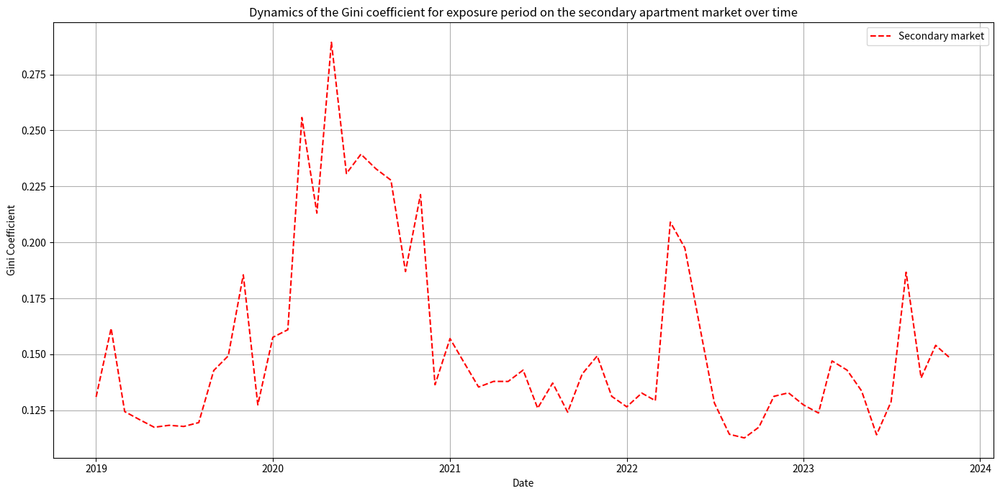

In [132]:
syv.plot_gini_ts(secondary_exposure_gini_ts,
                           labels=labels_gini_ts_3, colors=['red'], linestyles=['--'],
                           plot_title=f'Dynamics of the Gini coefficient for exposure period on the secondary apartment market over time')

图表见 [链接](https://web.tresorit.com/l/1SK8A#4Rzl6PPlQ6Ri07meLsayuA)。

In [133]:
# Save plot for the primary market prices
syv.save_gini_ts_plot(primary_deals_gini_ts, primary_offers_gini_ts,
                  labels = labels_gini_ts_1,
                  file_name = 'primary_prices_gini_ts',
                  colors=['blue', 'blue'],
                  linestyles=['-', '--'],
                  yscale='linear',
                  value_column='gini_coefficient',
                  plot_title="Dynamics of the Gini coefficient for prices on the primary apartment market over time")

# Save plot for the secondary market prices
syv.save_gini_ts_plot(secondary_deals_gini_ts, secondary_offers_gini_ts,
                  labels = labels_gini_ts_1,
                  file_name = 'secondary_prices_gini_ts',
                  colors=['red', 'red'],
                  linestyles=['-', '--'],
                  yscale='linear',
                  value_column='gini_coefficient',
                  plot_title="Dynamics of the Gini coefficient for prices on the secondary apartment market over time")

# Save plot for the primary and secondary markets volumes
syv.save_gini_ts_plot(primary_volumes_gini_ts, secondary_volumes_gini_ts,
                  labels = labels_gini_ts_2,
                  file_name = 'volumes_gini_ts',
                  colors=['blue', 'red'],
                  linestyles=['--', '--'],
                  yscale='linear',
                  value_column='gini_coefficient',
                  plot_title="Dynamics of the Gini coefficient for volumes on the primary and secondary apartment markets over time")

# Save plot for the secondary market exposure period
syv.save_gini_ts_plot(secondary_exposure_gini_ts,
                  labels = labels_gini_ts_3,
                  file_name = 'secondary_exposure_gini_ts',
                  colors=['red'],
                  linestyles=['--'],
                  yscale='linear',
                  value_column='gini_coefficient',
                  plot_title="Dynamics of the Gini coefficient for exposure period on the secondary apartment market over time")

### 5.4. 实际卢布价格指标分析

#### 5.4.1. 处理年度通货膨胀率数据

世界银行数据被用作[俄罗斯通货膨胀数据](https://databank.worldbank.org/source/world-development-indicators/Series/NY.GDP.DEFL.KD.ZG#)的来源。

In [134]:
annual_inflation_rus = syv.read_inflation_data_rus()

让我们使用 [LOWESS 方法](https://en.wikipedia.org/wiki/Local_regression) 对数据进行平滑处理。

In [135]:
annual_inflation_rus_smoothed = syv.smooth_lowess(annual_inflation_rus, 'year', 'inflation', frac=0.3)


让我们用线性比例绘制通货膨胀图。

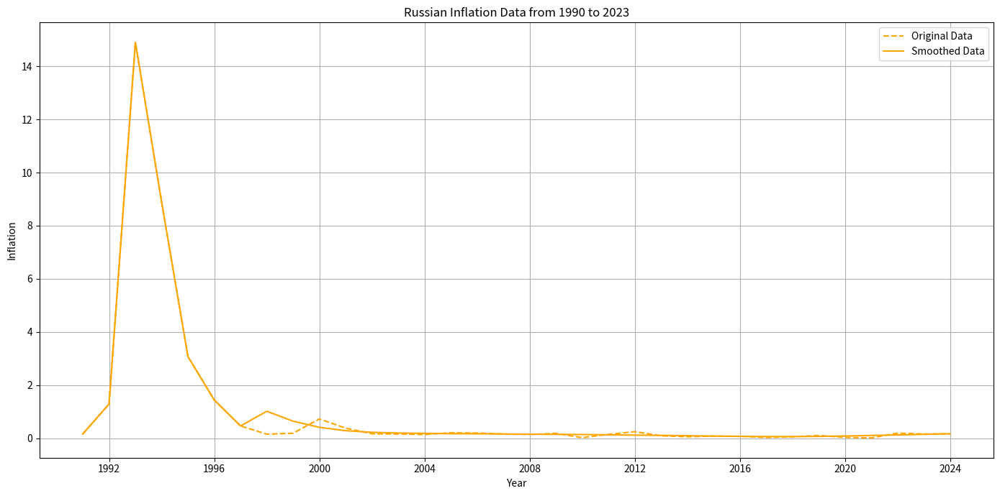

In [136]:
syv.plot_inflation_data(annual_inflation_rus, annual_inflation_rus_smoothed,
                        raw_label='Original Data', smoothed_label='Smoothed Data',
                        title="Russian Inflation Data from 1990 to 2023",
                        yscale = 'linear')

让我们用对数刻度来描绘通货膨胀。

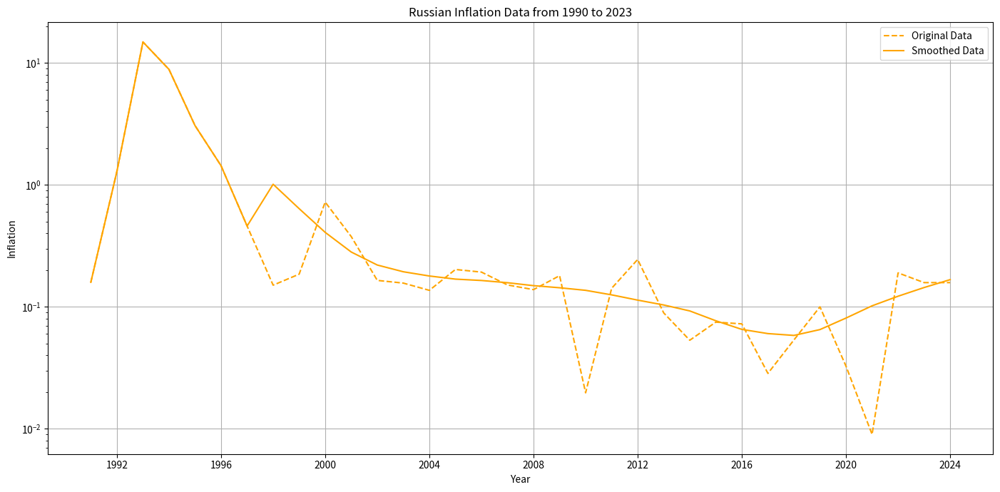

In [137]:
syv.plot_inflation_data(annual_inflation_rus, annual_inflation_rus_smoothed,
                        raw_label='Original Data', smoothed_label='Smoothed Data',
                        title="Russian Inflation Data from 1990 to 2023",
                        yscale = 'log')

让我们绘制 2002 年至 2023 年（含 2023 年）的卢布通胀图。

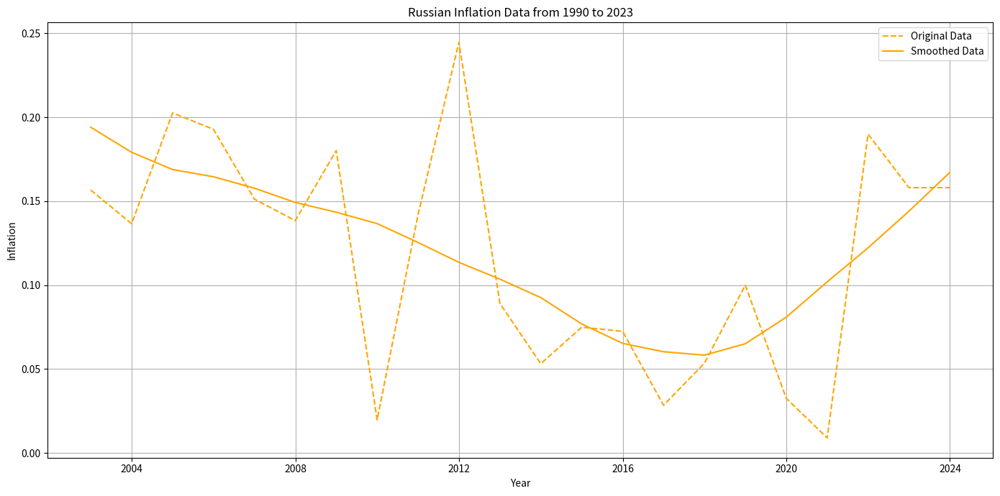

In [138]:
syv.plot_inflation_data(annual_inflation_rus, annual_inflation_rus_smoothed,
                        raw_label='Original Data', smoothed_label='Smoothed Data',
                        title="Russian Inflation Data from 1990 to 2023",
                        yscale = 'linear', start_date="2002-01-01", end_date="2023-12-31")

图表见 [链接](https://web.tresorit.com/l/1SK8A#4Rzl6PPlQ6Ri07meLsayuA)。

In [139]:
# Plot inflation from 1990 to 2023 in linear scale
syv.save_inflation_plot(annual_inflation_rus, annual_inflation_rus_smoothed,
                        file_name='annual_inflation_1990_2023_linear',
                        start_date="1990-01-01", end_date="2023-12-31", 
                        yscale='linear', title="Russian Inflation Data from 1990 to 2023 (linear scale)")

# Plot inflation from 1990 to 2023 in logarithmic scale
syv.save_inflation_plot(annual_inflation_rus, annual_inflation_rus_smoothed,
                        file_name='annual_inflation_1990_2023_log',
                        start_date="1990-01-01", end_date="2023-12-31", 
                        yscale='log', title="Russian Inflation Data from 1990 to 2023 (logarithmic scale)")

# Plot inflation from 2002 to 2023 in linear scale
syv.save_inflation_plot(annual_inflation_rus, annual_inflation_rus_smoothed,
                        file_name='annual_inflation_2002_2023_linear',
                        start_date="2002-01-01", end_date="2023-12-31", 
                        yscale='linear', title="Russian Inflation Data from 2002 to 2023 (linear scale)")

#### 5.4.2. 每月通货膨胀计算

让我们来计算一下卢布的月通货膨胀率。

In [140]:
monthly_inflation_rus = syv.calculate_monthly_inflation(annual_inflation_rus_smoothed,
                                                       inflation_column='smoothed_inflation')
monthly_inflation_rus = syv.filter_date_range(monthly_inflation_rus, start_date="2016-01", end_date="2023-11")
monthly_inflation_rus = syv.convert_date_to_month_year(monthly_inflation_rus)
monthly_inflation_rus = monthly_inflation_rus[0]
monthly_inflation_rus = monthly_inflation_rus.reset_index(drop=True)

让我们计算一下相对于 2020-01-01 基准日的通货膨胀指数。

In [141]:
monthly_inflation_rus_relative = syv.calculate_relative_inflation(monthly_inflation_rus.copy())

#### 5.4.3. 计算各地区和月份的卢布实际价格

让我们来计算一下交易和优惠的实际卢布价格。

In [142]:
# Read data
primary_deals_ts, primary_offers_ts,\
secondary_deals_ts, secondary_offers_ts = syv.sort_dataframe_by_date(primary_deals_ts,\
                                                            primary_offers_ts,\
                                                            secondary_deals_ts,\
                                                            secondary_offers_ts)

# Set the appropriate date format
monthly_inflation_rus_relative['date'] = monthly_inflation_rus_relative['date'].dt.to_timestamp()
primary_deals_ts['date'] = pd.to_datetime(primary_deals_ts['date'])
primary_deals_ts['date'] = primary_deals_ts['date'].dt.to_period('M').dt.to_timestamp()
primary_offers_ts['date'] = pd.to_datetime(primary_offers_ts['date'])
primary_offers_ts['date'] = primary_offers_ts['date'].dt.to_period('M').dt.to_timestamp()
secondary_deals_ts['date'] = pd.to_datetime(secondary_deals_ts['date'])
secondary_deals_ts['date'] = secondary_deals_ts['date'].dt.to_period('M').dt.to_timestamp()
primary_offers_ts['date'] = pd.to_datetime(primary_offers_ts['date'])
primary_offers_ts['date'] = primary_offers_ts['date'].dt.to_period('M').dt.to_timestamp()


In [143]:
# Calculate real prices
primary_deals_real, primary_offers_real, secondary_deals_real, secondary_offers_real = \
    syv.calculate_real_prices(monthly_inflation_rus_relative, 
                              'cumulative_inflation',
                              primary_deals_ts,
                              primary_offers_ts,
                              secondary_deals_ts,
                              secondary_offers_ts,
                              value_column='value')


In [144]:
# Round real prices
primary_deals_real['value_real'] = primary_deals_real['value_real'].round(0).astype(int)
primary_offers_real['value_real'] = primary_offers_real['value_real'].round(0).astype(int)
secondary_deals_real['value_real'] = secondary_deals_real['value_real'].round(0).astype(int)
secondary_offers_real['value_real'] = secondary_offers_real['value_real'].round(0).astype(int)


#### 5.4.4. 卢布实际价格可视化

让我们绘制五个主要地区的卢布实际价格动态图： 圣彼得堡、列宁格勒州、莫斯科、莫斯科州、克拉斯诺达尔州。

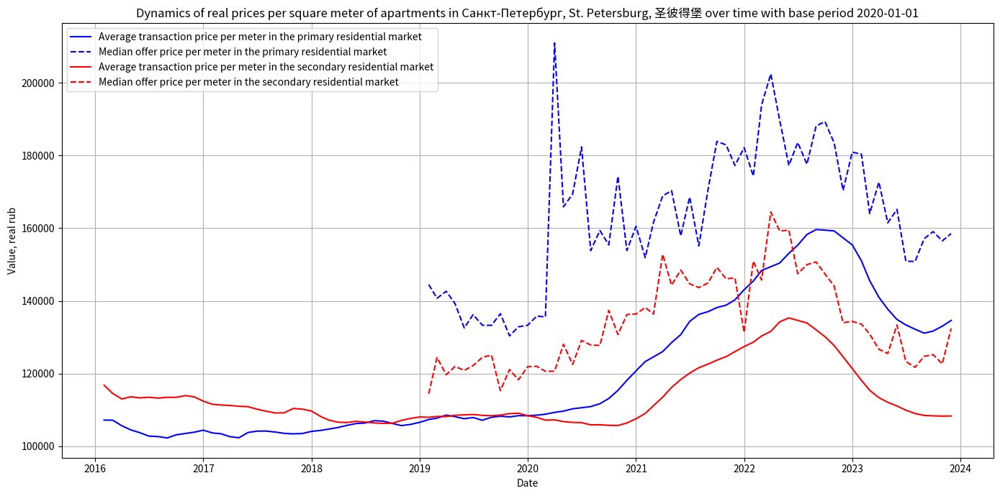

In [145]:
syv.plot_market_real_price_indicators(primary_deals_real,
                                      primary_offers_real,
                                      secondary_deals_real,
                                      secondary_offers_real,
                                      'Санкт-Петербург, St. Petersburg, 圣彼得堡')

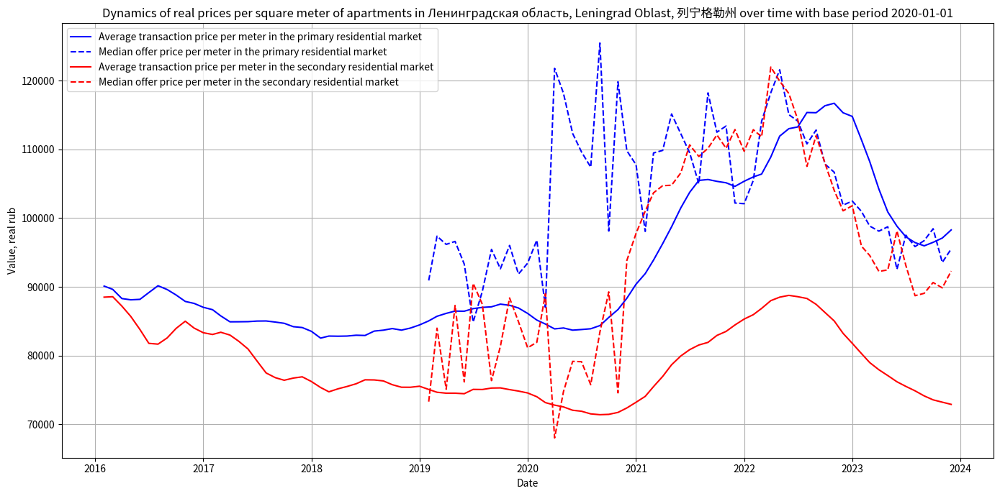

In [146]:
syv.plot_market_real_price_indicators(primary_deals_real,
                                      primary_offers_real,
                                      secondary_deals_real,
                                      secondary_offers_real,
                                      'Ленинградская область, Leningrad Oblast, 列宁格勒州')

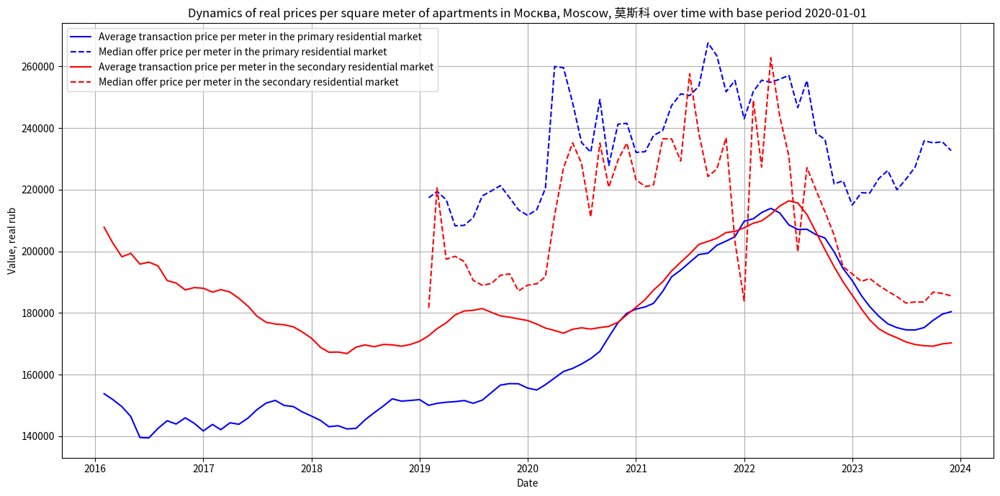

In [147]:
syv.plot_market_real_price_indicators(primary_deals_real,
                                      primary_offers_real,
                                      secondary_deals_real,
                                      secondary_offers_real,
                                      'Москва, Moscow, 莫斯科')

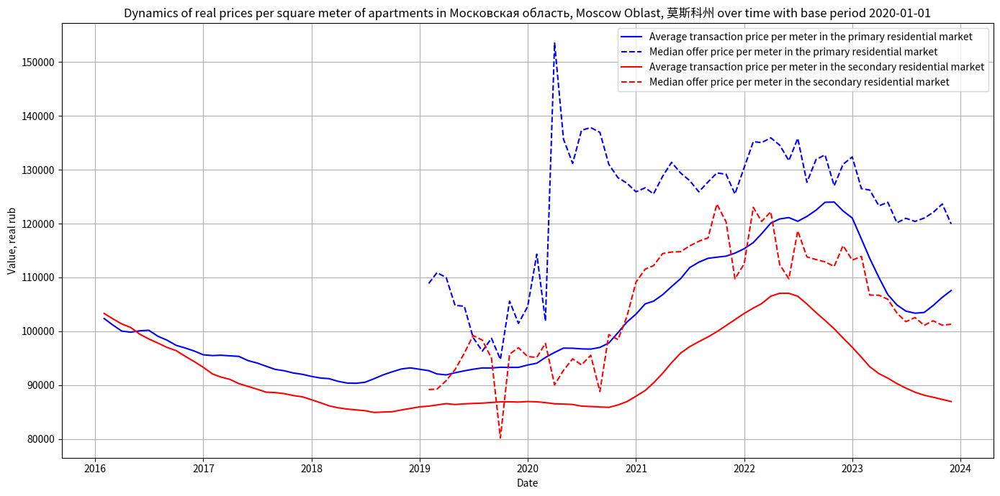

In [148]:
syv.plot_market_real_price_indicators(primary_deals_real,
                                      primary_offers_real,
                                      secondary_deals_real,
                                      secondary_offers_real,
                                      'Московская область, Moscow Oblast, 莫斯科州')

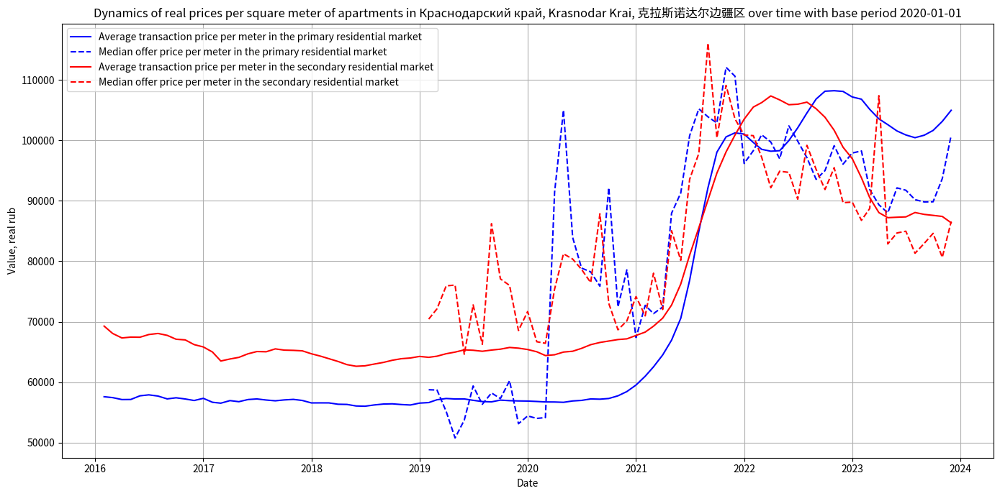

In [149]:
syv.plot_market_real_price_indicators(primary_deals_real,
                                      primary_offers_real,
                                      secondary_deals_real,
                                      secondary_offers_real,
                                      'Краснодарский край, Krasnodar Krai, 克拉斯诺达尔边疆区')

所有地区的图表可在 [链接](https://web.tresorit.com/l/1SK8A#4Rzl6PPlQ6Ri07meLsayuA) 上查阅。

In [150]:
syv.save_real_prices_plots(primary_deals_real,
                           primary_offers_real,
                           secondary_deals_real,
                           secondary_offers_real)

## 5.5. 名义美元价格指标分析

[俄罗斯联邦中央银行数据](https://www.cbr.ru/currency_base/dynamics/) 是特定日期卢布兑美元汇率的数据来源。

### 5.5.1. 数据准备

下载卢布-美元汇率数据。所有汇率均按[1998 年货币改革](https://en.wikipedia.org/wiki/Monetary_reform_in_Russia,_1998)后的面值给出。

In [151]:
usd_rub_rates = syv.get_usd_rub_ex_rate()

使用 LOWESS 方法对数据进行平滑处理。

In [152]:
usd_rub_rates = syv.smooth_exchange_rate(usd_rub_rates)

美元兑卢布汇率动态初始数据和平滑数据的可视化。

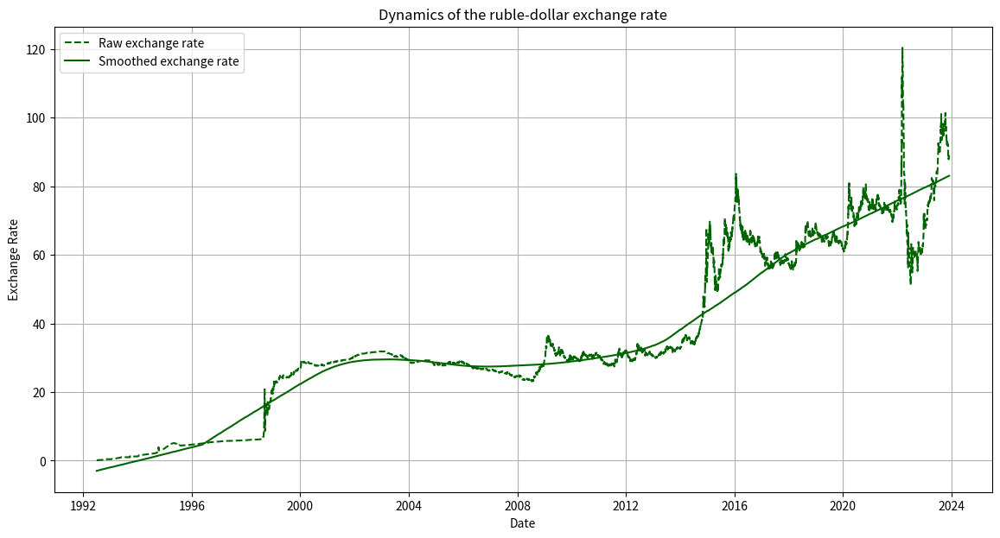

In [153]:
syv.plot_and_save_exchange_rate(usd_rub_rates)


由于价格数据是按月显示的，我们来计算一下各月的平均汇率。

In [154]:
monthly_avg_ex_rates = syv.calculate_monthly_avg_ex_rate(usd_rub_rates.copy())
monthly_avg_ex_rates['last_day_of_month'] = monthly_avg_ex_rates['date'].dt.to_timestamp('M') + pd.DateOffset(months=-0, days=-0)
monthly_avg_ex_rates = monthly_avg_ex_rates[['last_day_of_month', 'smoothed_rate']]

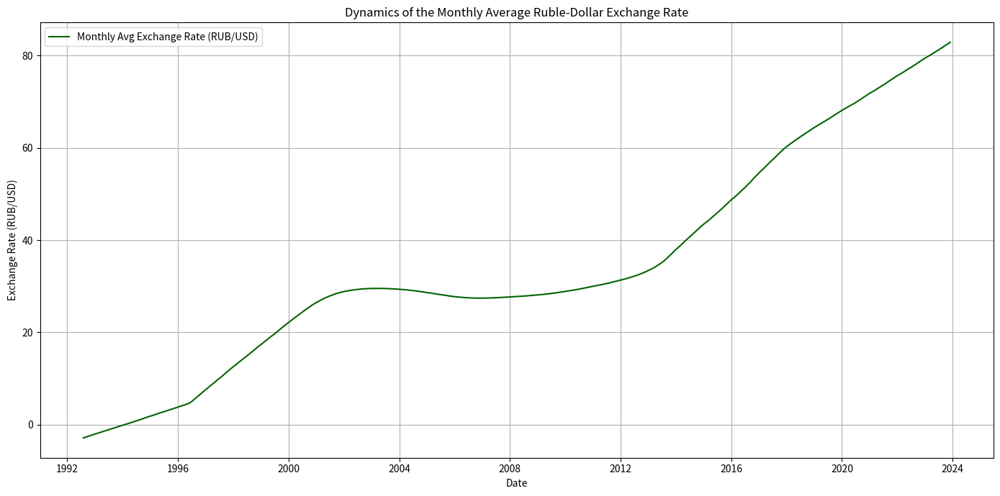

In [155]:
syv.plot_and_save_monthly_avg_exchange_rate(monthly_avg_ex_rates)

让我们来计算名义美元价格。

In [156]:
# Convert dates to datetime format
primary_deals_ts['date'] = pd.to_datetime(primary_deals_ts['date'])
primary_offers_ts['date'] = pd.to_datetime(primary_offers_ts['date'])
secondary_deals_ts['date'] = pd.to_datetime(secondary_deals_ts['date'])
secondary_offers_ts['date'] = pd.to_datetime(secondary_offers_ts['date'])


# Calculate prices in dollars
primary_deals_ts_usd = syv.convert_to_usd(primary_deals_ts, monthly_avg_ex_rates, 'value')
primary_offers_ts_usd = syv.convert_to_usd(primary_offers_ts, monthly_avg_ex_rates, 'value')
secondary_deals_ts_usd = syv.convert_to_usd(secondary_deals_ts, monthly_avg_ex_rates, 'value')
secondary_offers_ts_usd = syv.convert_to_usd(secondary_offers_ts, monthly_avg_ex_rates, 'value')

# Round 'value_usd' column to 0 decimal places
primary_deals_ts_usd['value_usd'] = primary_deals_ts_usd['value_usd'].round(0)
primary_offers_ts_usd['value_usd'] = primary_offers_ts_usd['value_usd'].round(0)
secondary_deals_ts_usd['value_usd'] = secondary_deals_ts_usd['value_usd'].round(0)
secondary_offers_ts_usd['value_usd'] = secondary_offers_ts_usd['value_usd'].round(0)

# Convert 'value_usd' column to integer
primary_deals_ts_usd['value_usd'] = primary_deals_ts_usd['value_usd'].astype(int)
primary_offers_ts_usd['value_usd'] = primary_offers_ts_usd['value_usd'].astype(int)
secondary_deals_ts_usd['value_usd'] = secondary_deals_ts_usd['value_usd'].astype(int)
secondary_offers_ts_usd['value_usd'] = secondary_offers_ts_usd['value_usd'].astype(int)

# Sort data frames by date
primary_deals_ts_usd, primary_offers_ts_usd,secondary_deals_ts_usd,\
secondary_offers_ts_usd = syv.sort_dataframe_by_date(primary_deals_ts_usd,\
                                                     primary_offers_ts_usd,\
                                                     secondary_deals_ts_usd,\
                                                     secondary_offers_ts_usd)

### 5.5.2. 美元名义价格可视化 

让我们绘制五个主要地区的名义美元价格动态图： 圣彼得堡、列宁格勒州、莫斯科、莫斯科州、克拉斯诺达尔边疆区。

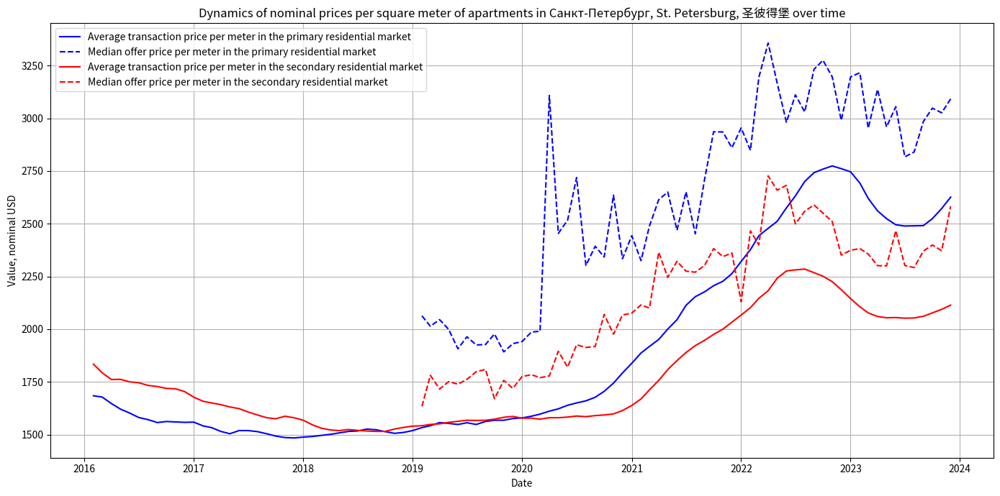

In [157]:
syv.plot_market_nomimal_usd_price_indicators(primary_deals_ts_usd,
                                             primary_offers_ts_usd,
                                             secondary_deals_ts_usd,
                                             secondary_offers_ts_usd,
                                             'Санкт-Петербург, St. Petersburg, 圣彼得堡')

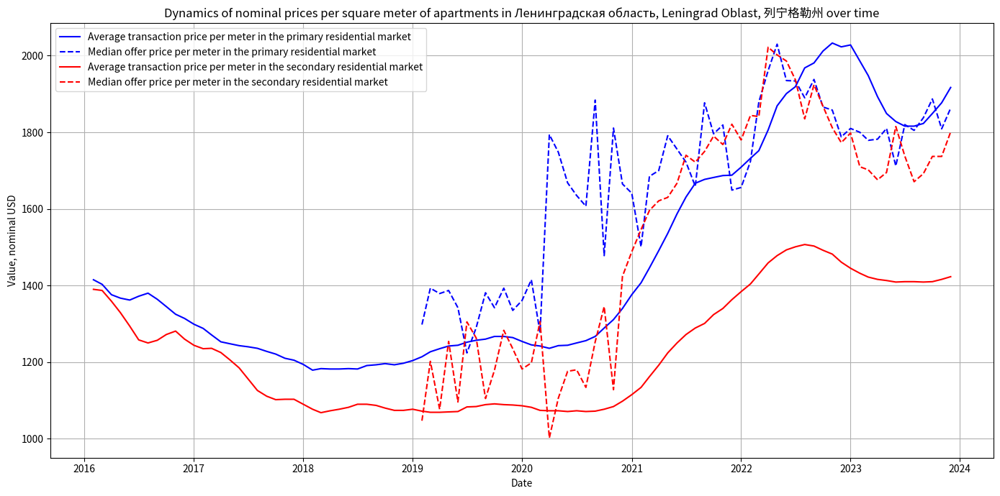

In [158]:
syv.plot_market_nomimal_usd_price_indicators(primary_deals_ts_usd,
                                             primary_offers_ts_usd,
                                             secondary_deals_ts_usd,
                                             secondary_offers_ts_usd,
                                             'Ленинградская область, Leningrad Oblast, 列宁格勒州')

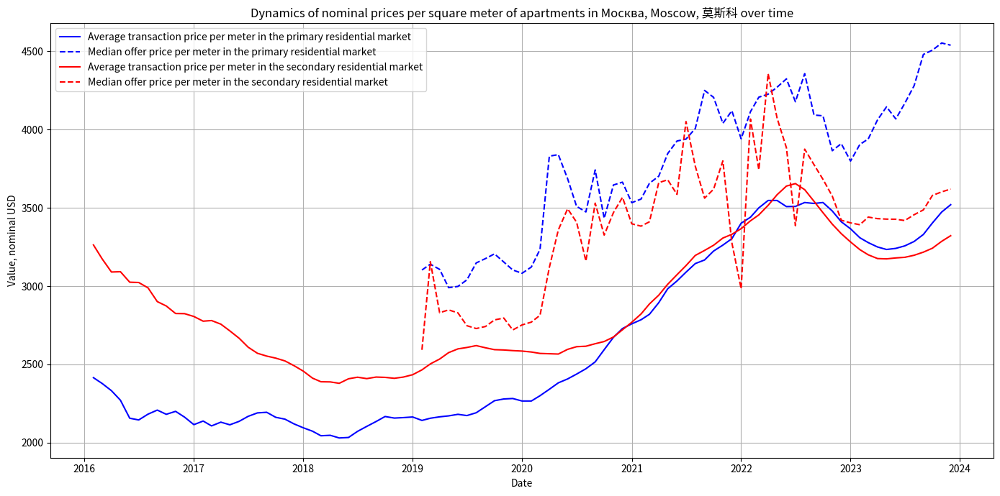

In [159]:
syv.plot_market_nomimal_usd_price_indicators(primary_deals_ts_usd,
                                             primary_offers_ts_usd,
                                             secondary_deals_ts_usd,
                                             secondary_offers_ts_usd,
                                             'Москва, Moscow, 莫斯科')

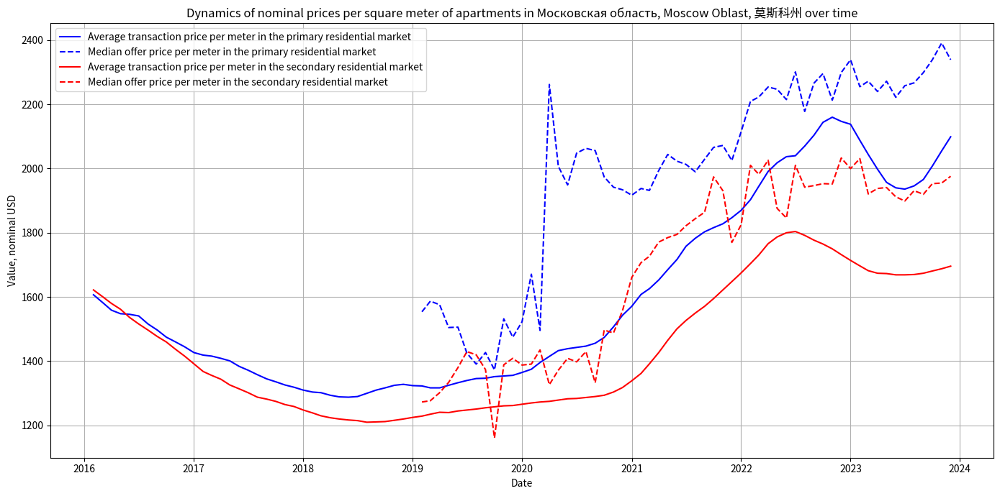

In [160]:
syv.plot_market_nomimal_usd_price_indicators(primary_deals_ts_usd,
                                             primary_offers_ts_usd,
                                             secondary_deals_ts_usd,
                                             secondary_offers_ts_usd,
                                             'Московская область, Moscow Oblast, 莫斯科州')

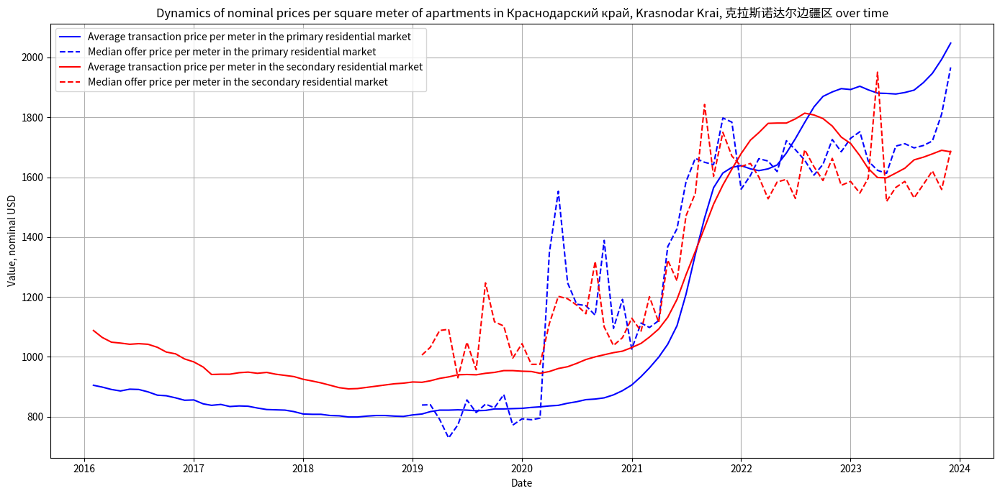

In [161]:
syv.plot_market_nomimal_usd_price_indicators(primary_deals_ts_usd,
                                             primary_offers_ts_usd,
                                             secondary_deals_ts_usd,
                                             secondary_offers_ts_usd,
                                             'Краснодарский край, Krasnodar Krai, 克拉斯诺达尔边疆区')

所有地区的图表可在 [链接](https://web.tresorit.com/l/1SK8A#4Rzl6PPlQ6Ri07meLsayuA) 上查阅。

In [162]:
syv.save_nominal_usd_prices_plots(primary_deals_ts_usd,
                              primary_offers_ts_usd,
                              secondary_deals_ts_usd,
                              secondary_offers_ts_usd)

## 5.6. 美元实际价格指标分析

#### 5.6.1. 处理年度通货膨胀率数据

世界银行数据被用作[美国通货膨胀数据](https://databank.worldbank.org/source/world-development-indicators/Series/NY.GDP.DEFL.KD.ZG#)的来源。

In [163]:
annual_inflation_usd = syv.read_inflation_data_usa()

让我们使用 LOWESS 方法对数据进行平滑处理。

In [164]:
annual_inflation_usd_smoothed = syv.smooth_lowess(annual_inflation_usd, 'year', 'inflation', frac=0.3)

让我们用线性比例绘制美元通胀图。

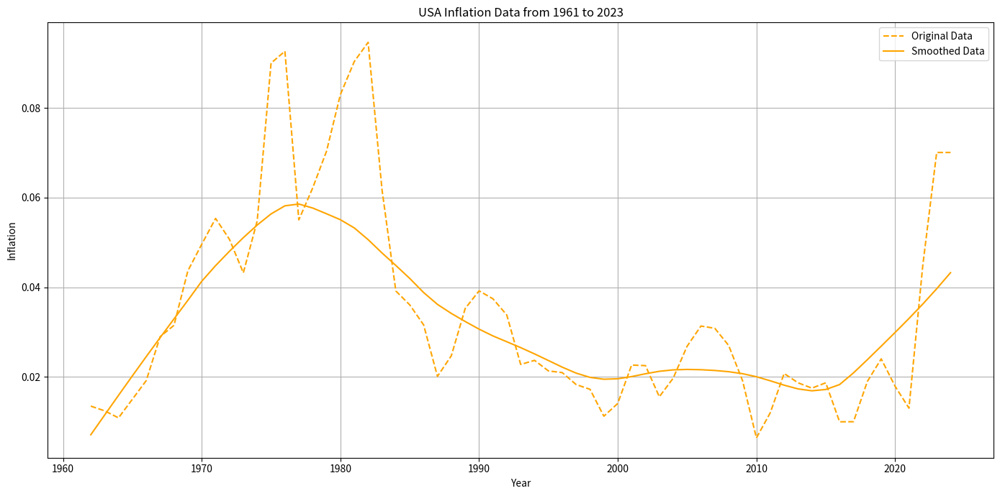

In [165]:
syv.plot_inflation_data(annual_inflation_usd, annual_inflation_usd_smoothed,
                        raw_label='Original Data', smoothed_label='Smoothed Data',
                        title="USA Inflation Data from 1961 to 2023",
                        start_date="1961-01-01",
                        end_date="2023-12-31",
                        yscale = 'linear')

让我们绘制 2002 年至 2023 年（含 2023 年）的美元通胀图。

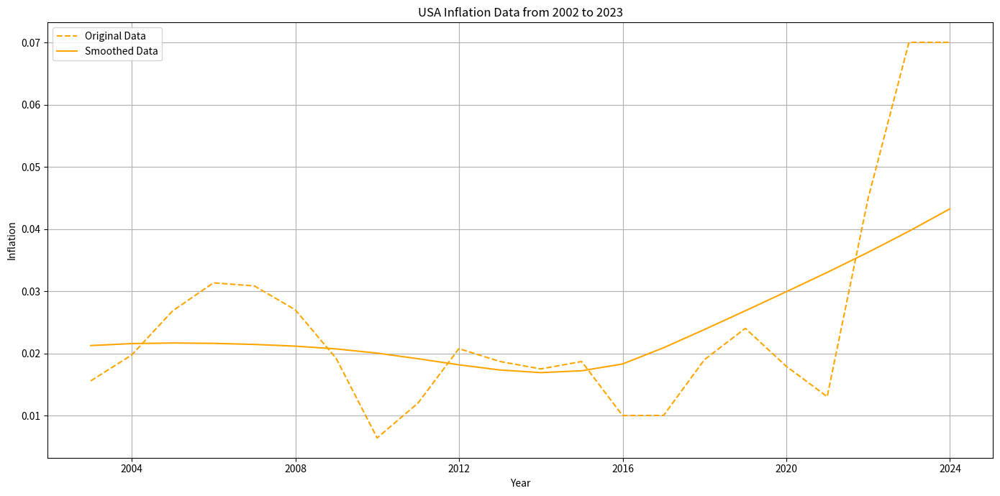

In [166]:
syv.plot_inflation_data(annual_inflation_usd, annual_inflation_usd_smoothed,
                        raw_label='Original Data', smoothed_label='Smoothed Data',
                        title="USA Inflation Data from 2002 to 2023",
                        start_date="2002-01-01",
                        end_date="2023-12-31",
                        yscale = 'linear')

图表见 [链接](https://web.tresorit.com/l/1SK8A#4Rzl6PPlQ6Ri07meLsayuA)。

In [167]:
# Plot inflation from 1961 to 2023 in linear scale
syv.save_inflation_plot(annual_inflation_usd, annual_inflation_usd_smoothed,
                        file_name='usa_annual_inflation_1961_2023_linear',
                        start_date="1961-01-01", end_date="2023-12-31", 
                        yscale='linear', title="U.S. inflation data from 1990 to 2023 (linear scale)")

# Plot inflation from 2002 to 2023 in linear scale
syv.save_inflation_plot(annual_inflation_usd, annual_inflation_usd_smoothed,
                        file_name='usa_annual_inflation_2002_2023_linear',
                        start_date="2002-01-01", end_date="2023-12-31", 
                        yscale='linear', title="U.S. inflation data from 2002 to 2023 (linear scale)")

#### 5.6.2. 每月美元通胀计算

让我们来计算一下每月的美元通胀率。

In [171]:
monthly_inflation_usd = syv.calculate_monthly_inflation(annual_inflation_usd_smoothed,
                                                       inflation_column='smoothed_inflation')
monthly_inflation_usd = syv.filter_date_range(monthly_inflation_usd, start_date="2016-01", end_date="2023-11")
monthly_inflation_usd = syv.convert_date_to_month_year(monthly_inflation_usd)
monthly_inflation_usd = monthly_inflation_usd[0]
monthly_inflation_usd = monthly_inflation_usd.reset_index(drop=True)

让我们计算一下相对于 2020-01-01 基准日的通货膨胀指数。

In [172]:
monthly_inflation_usd_relative = syv.calculate_relative_inflation(monthly_inflation_usd.copy())

#### 5.6.3. 计算每个地区和月份的实际美元价格

让我们来计算一下交易和投标的实际美元价格。

In [173]:
# Read data
primary_deals_ts_usd, primary_offers_ts_usd,\
secondary_deals_ts_usd, secondary_offers_ts_usd = syv.sort_dataframe_by_date(primary_deals_ts_usd,\
                                                            primary_offers_ts_usd,\
                                                            secondary_deals_ts_usd,\
                                                            secondary_offers_ts_usd)

# Set the appropriate date format
monthly_inflation_usd_relative['date'] = monthly_inflation_usd_relative['date'].dt.to_timestamp()
primary_deals_ts_usd['date'] = pd.to_datetime(primary_deals_ts_usd['date'])
primary_deals_ts_usd['date'] = primary_deals_ts_usd['date'].dt.to_period('M').dt.to_timestamp()
primary_offers_ts_usd['date'] = pd.to_datetime(primary_offers_ts_usd['date'])
primary_offers_ts_usd['date'] = primary_offers_ts_usd['date'].dt.to_period('M').dt.to_timestamp()
secondary_deals_ts_usd['date'] = pd.to_datetime(secondary_deals_ts_usd['date'])
secondary_deals_ts_usd['date'] = secondary_deals_ts_usd['date'].dt.to_period('M').dt.to_timestamp()
primary_offers_ts_usd['date'] = pd.to_datetime(primary_offers_ts_usd['date'])
primary_offers_ts_usd['date'] = primary_offers_ts_usd['date'].dt.to_period('M').dt.to_timestamp()

In [174]:
# Calculate real prices
primary_deals_real_usd, primary_offers_real_usd,\
secondary_deals_real_usd, secondary_offers_real_usd = \
    syv.calculate_real_prices(monthly_inflation_usd_relative, 
                              'cumulative_inflation',
                              primary_deals_ts_usd,
                              primary_offers_ts_usd,
                              secondary_deals_ts_usd,
                              secondary_offers_ts_usd,
                              value_column='value_usd')

In [175]:
# Round real prices
primary_deals_real_usd['value_usd_real'] = primary_deals_real_usd['value_usd_real'].round(0).astype(int)
primary_offers_real_usd['value_usd_real'] = primary_offers_real_usd['value_usd_real'].round(0).astype(int)
secondary_deals_real_usd['value_usd_real'] = secondary_deals_real_usd['value_usd_real'].round(0).astype(int)
secondary_offers_real_usd['value_usd_real'] = secondary_offers_real_usd['value_usd_real'].round(0).astype(int)

#### 5.6.4. 实际美元价格可视化

让我们绘制五个主要地区的实际美元价格动态图： 圣彼得堡、列宁格勒州、莫斯科、莫斯科州、克拉斯诺达尔边疆区。

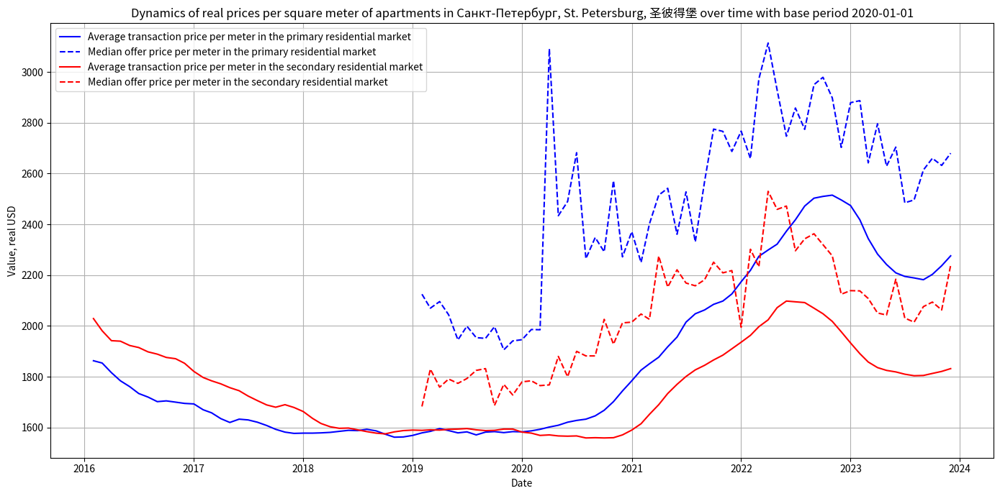

In [176]:
syv.plot_market_real_usd_price_indicators(primary_deals_real_usd,
                                      primary_offers_real_usd,
                                      secondary_deals_real_usd,
                                      secondary_offers_real_usd,
                                      'Санкт-Петербург, St. Petersburg, 圣彼得堡')

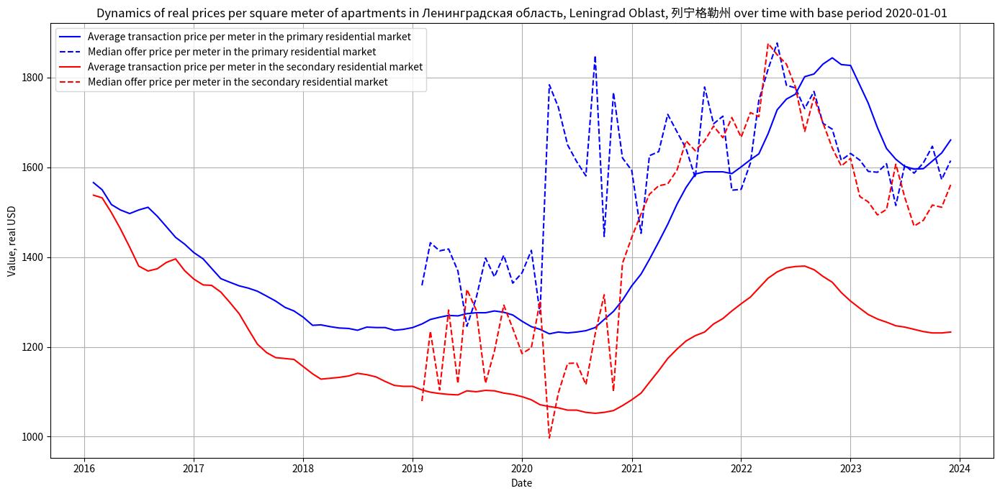

In [177]:
syv.plot_market_real_usd_price_indicators(primary_deals_real_usd,
                                      primary_offers_real_usd,
                                      secondary_deals_real_usd,
                                      secondary_offers_real_usd,
                                      'Ленинградская область, Leningrad Oblast, 列宁格勒州')

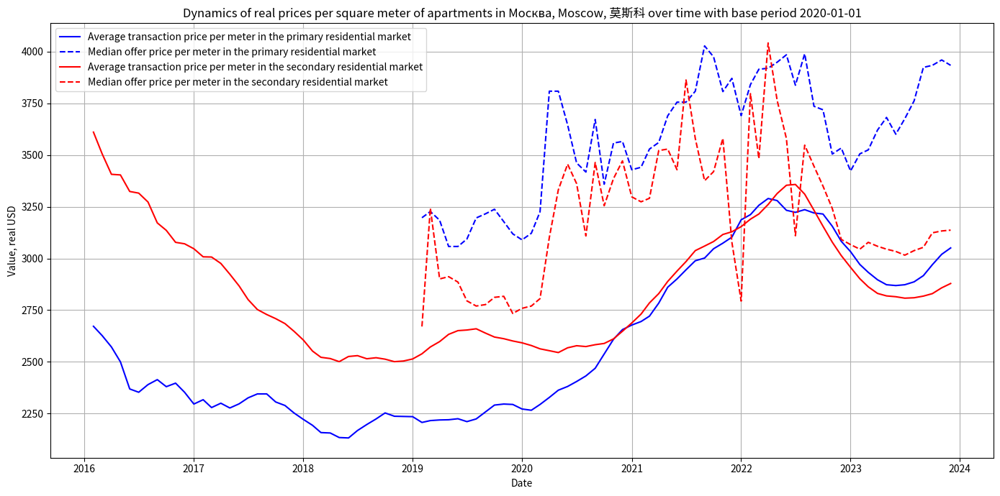

In [178]:
syv.plot_market_real_usd_price_indicators(primary_deals_real_usd,
                                      primary_offers_real_usd,
                                      secondary_deals_real_usd,
                                      secondary_offers_real_usd,
                                      'Москва, Moscow, 莫斯科')

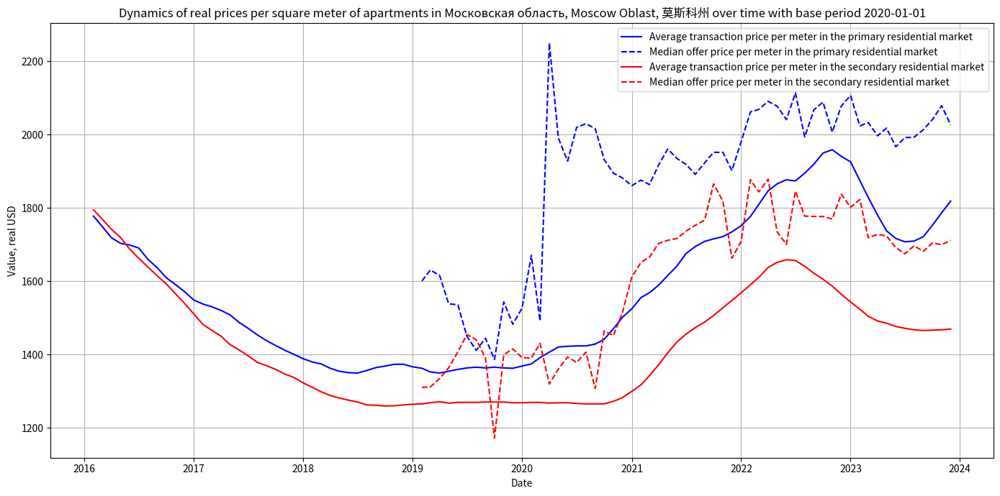

In [179]:
syv.plot_market_real_usd_price_indicators(primary_deals_real_usd,
                                      primary_offers_real_usd,
                                      secondary_deals_real_usd,
                                      secondary_offers_real_usd,
                                      'Московская область, Moscow Oblast, 莫斯科州')

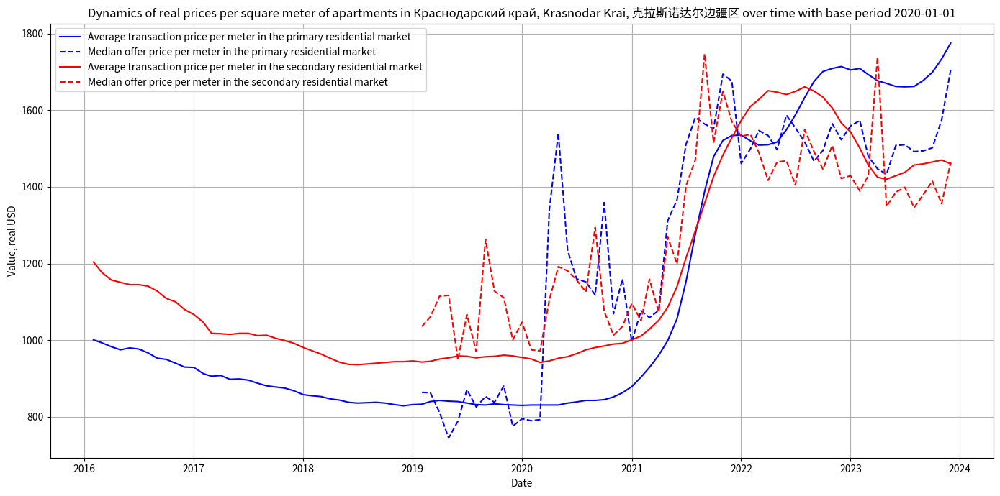

In [180]:
syv.plot_market_real_usd_price_indicators(primary_deals_real_usd,
                                      primary_offers_real_usd,
                                      secondary_deals_real_usd,
                                      secondary_offers_real_usd,
                                      'Краснодарский край, Krasnodar Krai, 克拉斯诺达尔边疆区')

所有地区的图表可在 [链接](https://web.tresorit.com/l/1SK8A#4Rzl6PPlQ6Ri07meLsayuA) 上查阅。

In [181]:
syv.save_real_usd_prices_plots(primary_deals_real_usd,
                           primary_offers_real_usd,
                           secondary_deals_real_usd,
                           secondary_offers_real_usd)

## 反馈意见

如需反馈、问题和建议，请使用 [Facebook 群组 "Artificial Intelligence in Valuation"](https://www.facebook.com/groups/1977067932456703) 或 ["Telegram 频道 "Artificial Intelligence in Valuation"](https://t.me/AIinValuation)。